### Importing Some Basic Libraries 

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px

### Loading Our Preprocessed Dataset 

##### Population and Literacy related all the datas I have collected from websites like google,wikipedia etc by using webscraping method. Except all the datas I get from the csv files given by my institute.

I preprocessed all the files and collected all the required datas like crimes, type of crimes, total crime against (women,children,SC and STs). After that I merge all the files with one.

For Population and Literacy, I found the census datas for the year 2001 and 2011 from the Government website and I collected those datas. Then I used linear Interpolation method for finding the rest datas like for the years 2002,2003,2004,...,2012.

In [2]:
df= pd.read_csv('total_crime1.csv')

In [3]:
df

,State/UT,Year,Total Population,Rural Population,Urban Population,Total Lit,Lit_rate,Area in km2,MURDER,ATTEMPT TO MURDER,...,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crime against sc,Total crime against women,Total crimes against ST,Total crime against children,Total crimes,Total crime rate
0,A& N ISLANDS,2001,356152,239954,116198,253135,81.30,8249,13,0,...,0,0,323,658,0,34.0,1.0,0.0,1421,398.986949
1,ANDHRA PRADESH,2001,76210007,55401067,20808940,39934323,60.47,275045,2602,1555,...,7,7400,34344,130089,2933,13669.0,512.0,270.0,296366,388.880689
2,ARUNACHAL PRADESH,2001,1097968,870087,227881,484785,54.34,83743,83,53,...,0,0,618,2342,0,180.0,72.0,0.0,5495,500.469959
3,ASSAM,2001,26655528,23216288,3439240,14015354,63.25,78438,1356,481,...,0,2010,9315,36877,6,4048.0,0.0,18.0,85490,320.721465
4,BIHAR,2001,82998509,74316709,8681800,31109577,47.00,94163,3643,3419,...,83,2406,36667,88432,1303,4489.0,83.0,83.0,195570,235.630739
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415,TAMIL NADU,2012,73112286,40774761,32337525,52968803,80.88,130058,1949,2954,...,0,15499,124176,200474,1647,6381.0,27.0,1036.0,424717,580.910574
416,TRIPURA,2012,3718215,3088808,631607,2883051,80.89,10486,124,79,...,0,10,1742,6264,76,1559.0,29.0,20.0,15145,407.319103
417,UTTAR PRADESH,2012,202919833,160511944,42407889,118265382,67.98,240928,4966,4811,...,0,14406,68538,198093,6202,23033.0,44.0,6033.0,479715,236.406167
418,UTTARAKHAND,2012,10279492,7665922,2613571,7058470,79.22,53483,217,161,...,0,670,2118,8882,33,1055.0,3.0,122.0,21335,207.549167


##### So as we can see that our dataset has total 420 rows and 44 columns

In [4]:
# Checking total information of our dataset

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420 entries, 0 to 419
Data columns (total 44 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   State/UT                                             420 non-null    object 
 1   Year                                                 420 non-null    int64  
 2   Total Population                                     420 non-null    int64  
 3   Rural Population                                     420 non-null    int64  
 4   Urban Population                                     420 non-null    int64  
 5   Total Lit                                            420 non-null    int64  
 6   Lit_rate                                             420 non-null    float64
 7   Area in km2                                          420 non-null    int64  
 8   MURDER                                               420 non-null    i

##### So we can see that Total crime against (women,ST and children) column has null values present

In [6]:
# Let's check the total sum of null values 

In [7]:
df.isnull().sum()

State/UT                                                0
Year                                                    0
Total Population                                        0
Rural Population                                        0
Urban Population                                        0
Total Lit                                               0
Lit_rate                                                0
Area in km2                                             0
MURDER                                                  0
ATTEMPT TO MURDER                                       0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER               0
RAPE                                                    0
CUSTODIAL RAPE                                          0
OTHER RAPE                                              0
KIDNAPPING & ABDUCTION                                  0
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS             0
KIDNAPPING AND ABDUCTION OF OTHERS                      0
DACOITY       

##### So Total crime against women column has total 9 Null values
##### Total crimes against ST column has total 33 Null values 
##### Total crime against children column has total 2 Null values are present

### Let's Replace The Null Values

##### Replacing all the null values with 0. assuming that there is no crime.

In [8]:
df['Total crimes against ST']=df['Total crimes against ST'].fillna(0)

In [9]:
df['Total crime against women']=df['Total crime against women'].fillna(0)

In [10]:
df['Total crime against children']=df['Total crime against children'].fillna(0)

### Checking columns of our dataset

In [11]:
df.columns

Index(['State/UT', 'Year', 'Total Population', 'Rural Population',
       'Urban Population', 'Total Lit', 'Lit_rate', 'Area in km2', 'MURDER',
       'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER',
       'RAPE', 'CUSTODIAL RAPE', 'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES',
       'Total crime against sc', 'Total crime against women',
       'Total crimes against ST'

### Let's understand the purpose of the columns

In [12]:
# State/UT -- State In India
# Year -- year ranging from 2001 to 2012
# Total Population -- Total population of each state
# Rural Population -- Total Rural Population of that state
# Urban Population -- Total Urban Population of that state
# Total Lit -- Total Literacy in population for each state 
# Lit_rate -- Literacy Rate 
# Area in km2 -- Total Area in km2 for each state
# MURDER -- Total No of Murders in each state
# ATTEMPT TO MURDER -- Tried for Murder
# CULPABLE HOMICIDE NOT AMOUNTING TO MURDER
# RAPE
# CUSTODIAL RAPE
# OTHER RAPE
# KIDNAPPING & ABDUCTION
# KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS
# KIDNAPPING AND ABDUCTION OF OTHERS
# DACOITY
# PREPARATION AND ASSEMBLY FOR DACOITY
# ROBBERY
# BURGLARY
# THEFT
# AUTO THEFT
# OTHER THEFT
# RIOTS
# CRIMINAL BREACH OF TRUST
# CHEATING
# COUNTERFIETING
# ARSON
# HURT/GREVIOUS HURT
# DOWRY DEATHS
# ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY
# INSULT TO MODESTY OF WOMEN
# CRUELTY BY HUSBAND OR HIS RELATIVES
# IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES
# CAUSING DEATH BY NEGLIGENCE
# OTHER IPC CRIMES
# TOTAL IPC CRIMES
# Total crime against sc
# Total crime against women
# Total crimes against ST
# Total crime against children
# Total crimes
# Total crime rate

##### Checking Unique values

In [13]:
df['State/UT'].nunique()

35

So State/UT column has 35 states including union teritories

In [ ]:
df['State/UT'].value_counts()

Each State is repeating 12 times. Because we have datas for the 12 years.

##### Let's Check for the max values 

In [15]:
# Maximum population in state

In [16]:
state = df[df['Total Population'] == df["Total Population"].max()]['State/UT']
print('maximum population is :',df["Total Population"].max(),'  and the state is :',state)


maximum population is : 202919833   and the state is : 417    UTTAR PRADESH
Name: State/UT, dtype: object


##### UTTAR PRADESH has maximum Population

In [17]:
# Maximum Literacy rate in state
state = df[df['Lit_rate'] == df["Lit_rate"].max()]['State/UT']
year = df[df['Lit_rate'] == df["Lit_rate"].max()]['Year']
print('maximum Lit_rate is :',df["Lit_rate"].max(),'  and the state is :',state,' in year :',year)

maximum Lit_rate is : 94.5   and the state is : 402    KERALA
Name: State/UT, dtype: object  in year : 402    2012
Name: Year, dtype: int64


##### At the year 2012 KERALA has the highest literacy rate of 94.5

In [18]:
# Maximum crime in state
state = df[df['Total crimes'] == df["Total crimes"].max()]['State/UT']
year = df[df['Total crimes'] == df["Total crimes"].max()]['Year']
print('maximum Total crimes is :',df["Total crimes"].max(),'  and the state is :',state,' in year :',year)

maximum Total crimes is : 1048314   and the state is : 413    RAJASTHAN
Name: State/UT, dtype: object  in year : 413    2012
Name: Year, dtype: int64


##### At the year 2012 RAJASTHAN has maximum crimes 

In [19]:
# Maximum area in state
state = df[df['Area in km2'] == df["Area in km2"].max()]['State/UT']
print('maximum Area in km2 is :',df["Area in km2"].max(),'  and the state is :',state)

maximum Area in km2 is : 342239   and the state is : 28     RAJASTHAN
63     RAJASTHAN
98     RAJASTHAN
133    RAJASTHAN
168    RAJASTHAN
203    RAJASTHAN
238    RAJASTHAN
273    RAJASTHAN
308    RAJASTHAN
343    RAJASTHAN
378    RAJASTHAN
413    RAJASTHAN
Name: State/UT, dtype: object


##### Rajasthan has the maximum area

In [20]:
# Maximum crime rate rate in state
state = df[df['Total crime rate'] == df["Total crime rate"].max()]['State/UT']
year = df[df['Total crime rate'] == df["Total crime rate"].max()]['Year']
print('maximum Total crime rate is :',df["Total crime rate"].max(),'  and the state is :',state," in year :",year)

maximum Total crime rate is : 41222.51973   and the state is : 20    MAHARASHTRA
Name: State/UT, dtype: object  in year : 20    2001
Name: Year, dtype: int64


##### At the year 2001 Maharashtra has maximum crime rate

#### Let's check the statistical summary of our dataset

In [21]:
df.describe()

,Year,Total Population,Rural Population,Urban Population,Total Lit,Lit_rate,Area in km2,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,...,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crime against sc,Total crime against women,Total crimes against ST,Total crime against children,Total crimes,Total crime rate
count,420.000000,4.200000e+02,4.200000e+02,4.200000e+02,4.200000e+02,420.000000,420.000000,420.000000,420.000000,420.000000,...,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,4.200000e+02,420.000000
mean,2006.500000,3.030960e+07,2.329693e+07,8.944251e+06,1.920780e+07,74.304929,93921.142857,958.130952,838.030952,106.226190,...,2.123810,2385.038095,23342.764286,57005.423810,14884.821429,5031.128571,170.535714,584.471429,1.444358e+05,1097.156796
std,3.456169,3.951660e+07,3.102968e+07,1.152538e+07,2.353959e+07,9.942087,102383.400844,1213.902657,1149.630191,253.865596,...,8.914278,3665.682348,29318.488594,66190.228036,91151.189568,6570.309290,380.749695,1034.774239,1.891593e+05,2830.864921
min,2001.000000,6.065000e+04,3.368300e+04,2.696700e+04,4.468300e+04,47.000000,32.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,5.000000,31.000000,0.000000,0.000000,0.000000,0.000000,8.300000e+01,115.287494
25%,2003.750000,1.318566e+06,7.262260e+05,5.518238e+05,9.246915e+05,66.382500,8249.000000,45.750000,32.000000,4.000000,...,0.000000,35.000000,693.750000,2408.500000,0.000000,107.500000,0.000000,25.000000,1.078000e+04,300.334850
50%,2006.500000,1.428592e+07,8.613440e+06,3.725214e+06,1.118721e+07,74.495000,53483.000000,463.500000,434.000000,29.000000,...,0.000000,463.500000,10414.500000,30116.500000,23.500000,2303.000000,4.000000,101.500000,6.581450e+04,462.572689
75%,2009.250000,5.261758e+07,3.653082e+07,1.498088e+07,3.304334e+07,82.187500,155707.000000,1461.000000,1302.250000,92.250000,...,0.000000,3025.000000,41774.750000,109178.500000,710.500000,7459.500000,153.500000,628.750000,2.396142e+05,820.395412
max,2012.000000,2.029198e+08,1.605119e+08,4.829472e+07,1.182654e+08,94.500000,342239.000000,7601.000000,7964.000000,1616.000000,...,83.000000,16076.000000,124176.000000,220335.000000,653748.000000,30585.000000,2894.000000,6033.000000,1.048314e+06,41222.519730


So here we can see the percentile values, max and min values, Total counts and the median values for all the columns.
This will give us brief idea about the range of our columns.

maximum IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES is 83 in one year.

maximum Murder is 7601 in one year.

maximum Literacy rate is 94.5

In [22]:
df.columns

Index(['State/UT', 'Year', 'Total Population', 'Rural Population',
       'Urban Population', 'Total Lit', 'Lit_rate', 'Area in km2', 'MURDER',
       'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER',
       'RAPE', 'CUSTODIAL RAPE', 'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES',
       'Total crime against sc', 'Total crime against women',
       'Total crimes against ST'

In [23]:
a=['MURDER',
       'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER',
       'RAPE', 'CUSTODIAL RAPE', 'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT']

### Let's plot barplot for different types of crime over the year

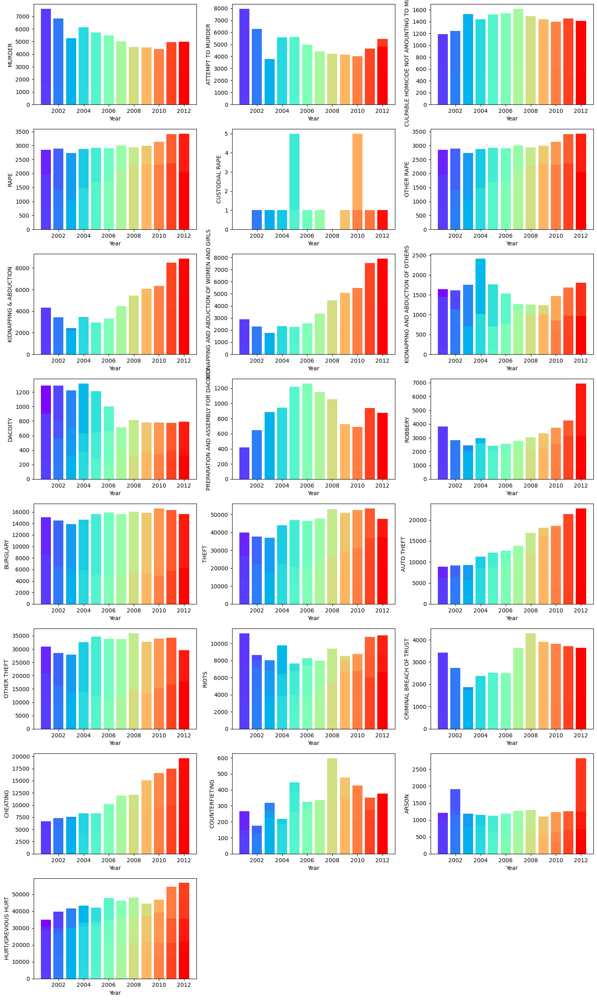

In [24]:
import matplotlib.cm as cm
plt.figure(figsize=(15,25))
p=1
for i in a:
    if p<=22:
        ax = plt.subplot(8,3,p)
        colors = cm.rainbow(np.linspace(0, 1, len(df['Year'])))
        plt.bar(x=df['Year'], height=df[i],color=colors)
        plt.xlabel('Year')
        plt.ylabel(i)
    p+=1

plt.tight_layout()

###### So as we can see that MURDER, ATTEMPT TO MURDER and DACOITY is decreasing over the year

###### RAPE, OTHER RAPE, KIDNAPPING & ABDUCTION, KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS, ROBBERY, AUTO THEFT and HURT/GREVIOUS HURT is increasing over the year

###### CUSTODIAL RAPE is increased for the year 2005 and 2010.

###### In 2012 ARSON is almost double than the previous year

### Let's plot the PIE plot to see the total percentages of different types of crime

In [25]:
b=['MURDER',
       'RAPE', 'KIDNAPPING & ABDUCTION','ROBBERY', 'BURGLARY', 'THEFT', 'RIOTS',
       'CHEATING','HURT/GREVIOUS HURT','DACOITY']

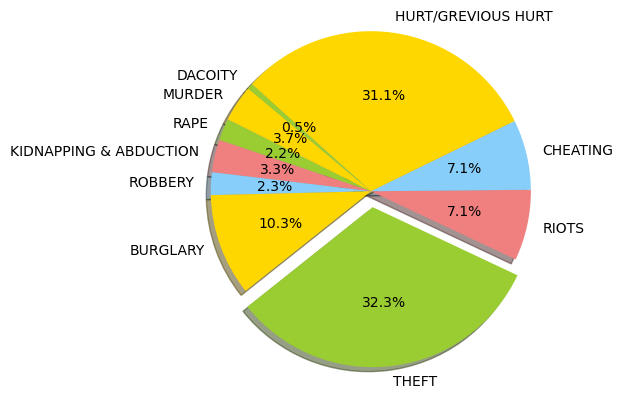

In [83]:
labels = b
list_sum=[df[i].sum() for i in b]
colors = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue']
explode = (0, 0, 0, 0,0,0.1,0,0,0,0)
plt.pie(list_sum, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')
plt.show()


So In this PIE plot we can see that THEFT has the most percentage among the all types of crime then HURT/GREVIOUS HURT then BURGLARY. RIOTS and CHEATING has the same percentage of around 7.1%

#### Let's check the crime over the states

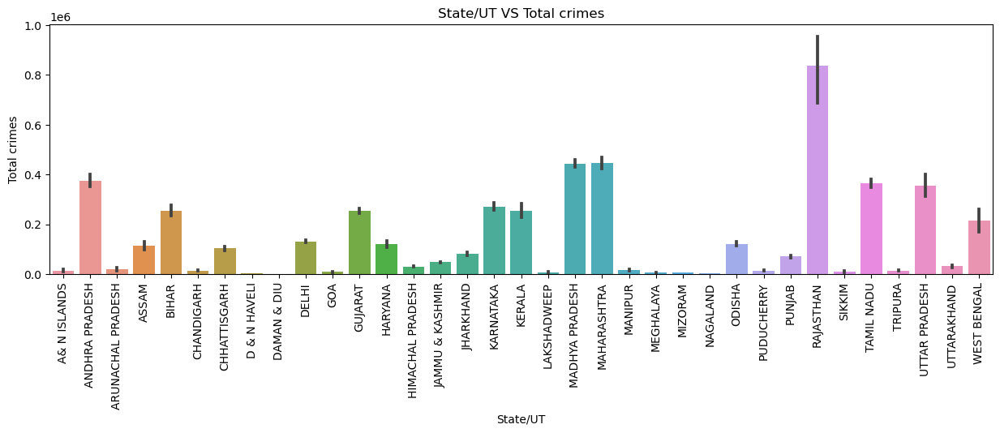

In [34]:
plt.figure(figsize=(15,4))
sns.barplot(x='State/UT',y='Total crimes',data =df)
plt.title('State/UT VS Total crimes')
plt.xticks(rotation = 90)
plt.ylabel('Total crimes')
plt.show()

From this graph we can see Rajasthan has the most crimes over the other states and Madhya pradesh and maharashtra has second highest most crimes.
Nagaland, Daman & Diu and D & N Haveli has the lowest crimes in india

#### Let's check the Total population over the states

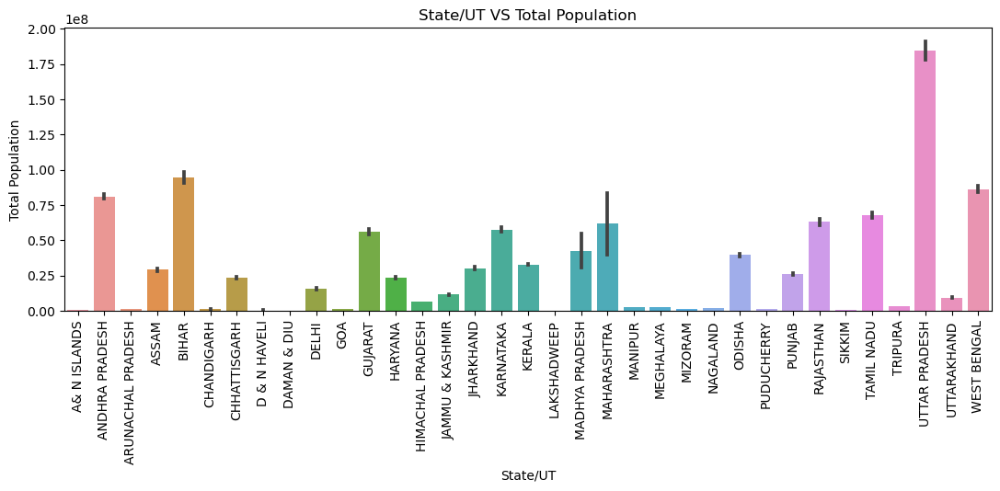

In [65]:
plt.figure(figsize=(13,4))
sns.barplot(x='State/UT',y='Total Population',data =df)
plt.title('State/UT VS Total Population')
plt.xticks(rotation = 90)
plt.ylabel('Total Population')
plt.show()

From the above graph we can see that Uttar-pradesh has the highest population. Daman & Diu, D & N Haveli, A & N Islands and Sikkim has the lowest population in india

#### Let's check the Literacy Rates over the states

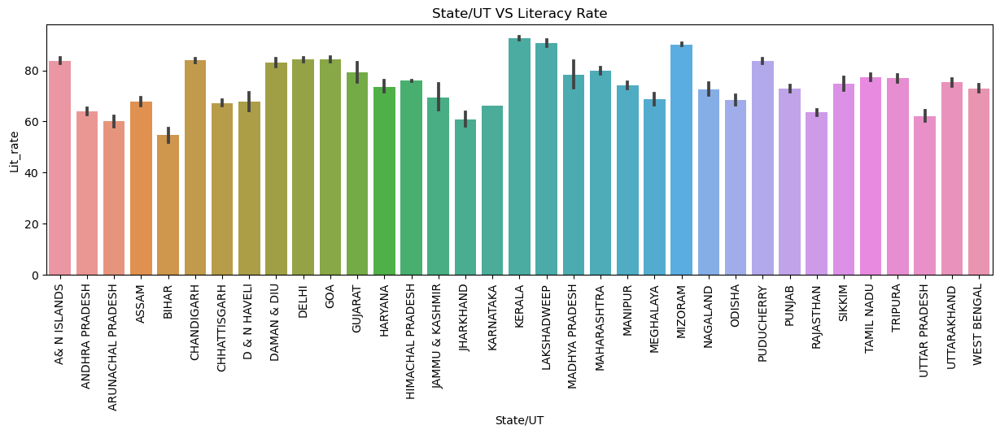

In [37]:
plt.figure(figsize=(15,4))
sns.barplot(x='State/UT',y='Lit_rate',data =df)
plt.title('State/UT VS Literacy Rate')
plt.xticks(rotation = 90)
plt.ylabel('Lit_rate')
plt.show()

From the above graph we can see that Kerala has the highest literacy rates over the states in India and Bihar has the lowest Literacy rate.

#### Let's check the Total crime against sc over the states

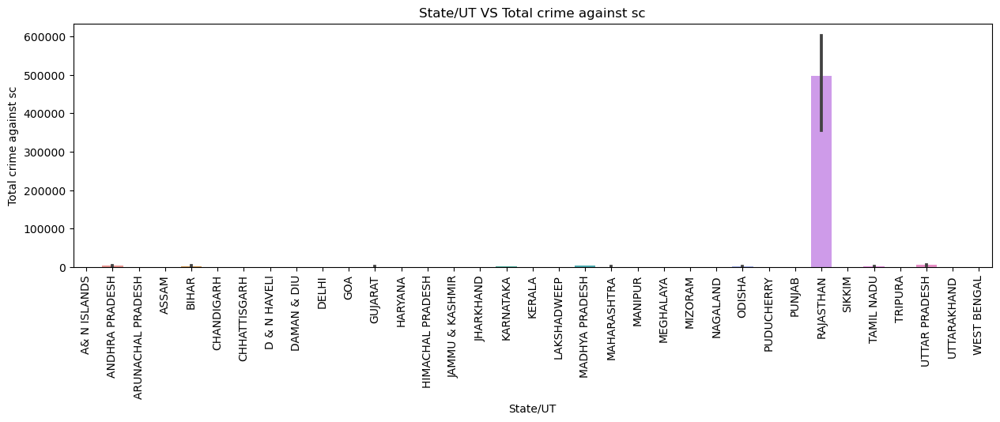

In [38]:
plt.figure(figsize=(15,4))
sns.barplot(x='State/UT',y='Total crime against sc',data =df)
plt.title('State/UT VS Total crime against sc')
plt.xticks(rotation = 90)
plt.ylabel('Total crime against sc')
plt.show()

In Rajasthan there is huge crime against Sc 

#### Let's check the Total crime against women over the states

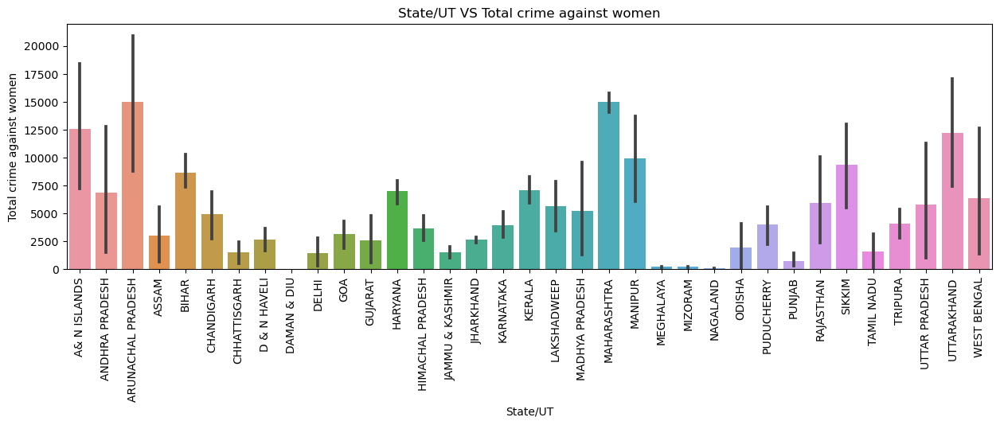

In [39]:
plt.figure(figsize=(15,4))
sns.barplot(x='State/UT',y='Total crime against women',data =df)
plt.title('State/UT VS Total crime against women')
plt.xticks(rotation = 90)
plt.ylabel('Total crime against women')
plt.show()

Arunachal Pradesh, Maharashtra, A & N Islands and Uttarakhand has the highest crimes against women. Daman & Diu and Nagaland has the lowest crime againt women

#### Let's check the Total crimes against ST over the states

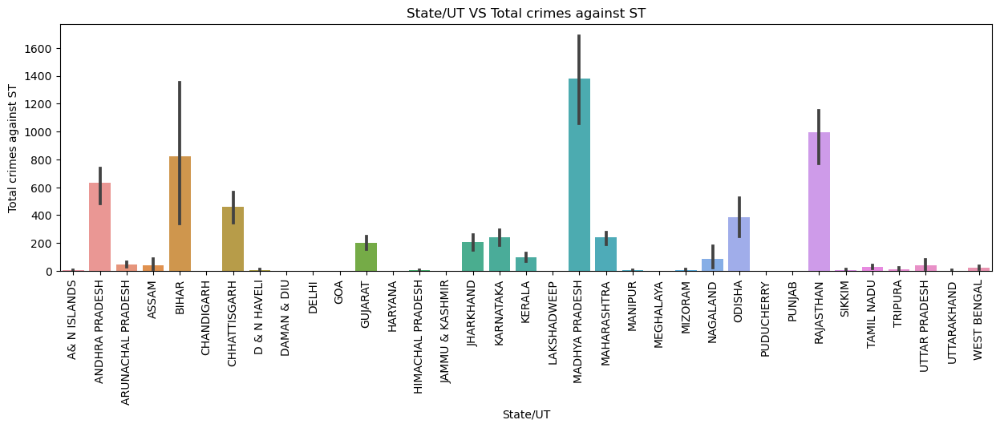

In [40]:
plt.figure(figsize=(15,4))
sns.barplot(x='State/UT',y='Total crimes against ST',data =df)
plt.title('State/UT VS Total crimes against ST')
plt.xticks(rotation = 90)
plt.ylabel('Total crimes against ST')
plt.show()

In Madhya Pradesh, Rajasthan and Bihar has the highest crimes against ST. Daman & Diu, Haryana, Punjab, puducherry, Lakshadweep, Goa and Delhi has the lowest crimes againt STs

#### Let's check the Total crime against children over the states

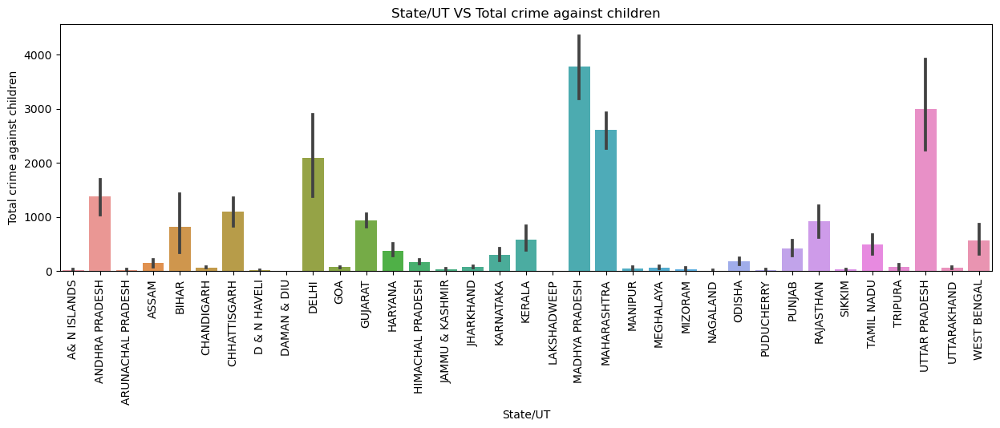

In [41]:
plt.figure(figsize=(15,4))
sns.barplot(x='State/UT',y='Total crime against children',data =df)
plt.title('State/UT VS Total crime against children')
plt.xticks(rotation = 90)
plt.ylabel('Total crime against children')
plt.show()

In Madhya Pradesh, Uttar-Pradesh, MahaRashtra has the highest crimes againt children and Nagaland, Lakshadweep and Daman & Diu has the lowest crimes against children

#### Let's check the Total crime rate over the states

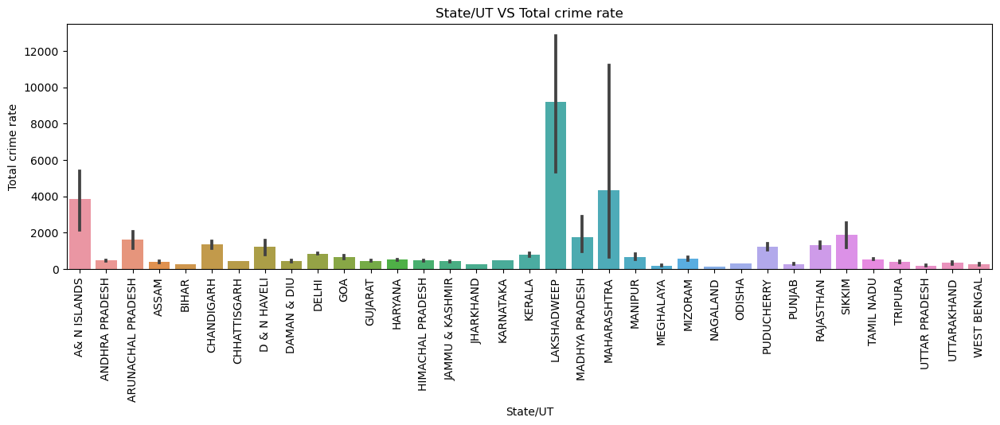

In [42]:
plt.figure(figsize=(15,4))
sns.barplot(x='State/UT',y='Total crime rate',data =df)
plt.title('State/UT VS Total crime rate')
plt.xticks(rotation = 90)
plt.ylabel('Total crime rate')
plt.show()

In Lakshadweep and Maharashtra has the highset crime rates in India

#### Let's check the RAPE over the states

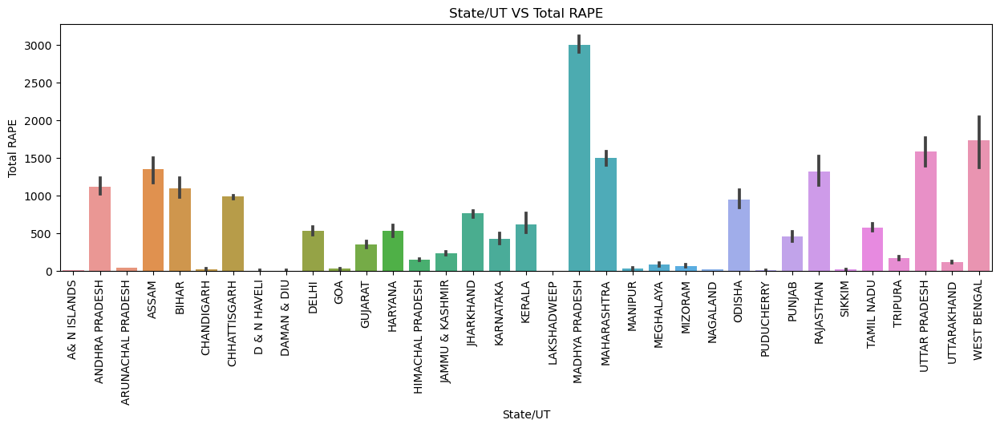

In [44]:
plt.figure(figsize=(15,4))
sns.barplot(x='State/UT',y='RAPE',data =df)
plt.title('State/UT VS Total RAPE')
plt.xticks(rotation = 90)
plt.ylabel('Total RAPE')
plt.show()

First In Madhya Pradesh, secondly West Bengal then Uttar Pradesh and then Maharashtra has the highest RAPE happend in India

#### Let's check the Total crimes over the years

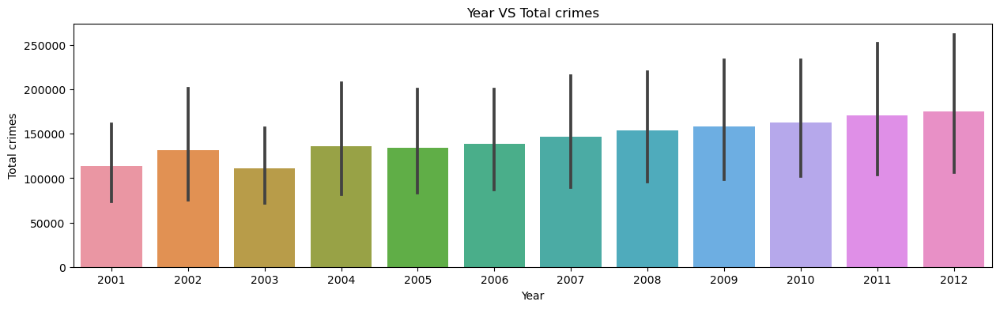

In [46]:
plt.figure(figsize=(15,4))
sns.barplot(x='Year',y='Total crimes',data =df)
plt.title('Year VS Total crimes')
plt.xticks(rotation = 0)
plt.ylabel('Total crimes')
plt.show()

So from the above graph we can see that total crimes is gradually increases over the year But in 2003 crime is the lowest

#### Let's check the Total Population over the years

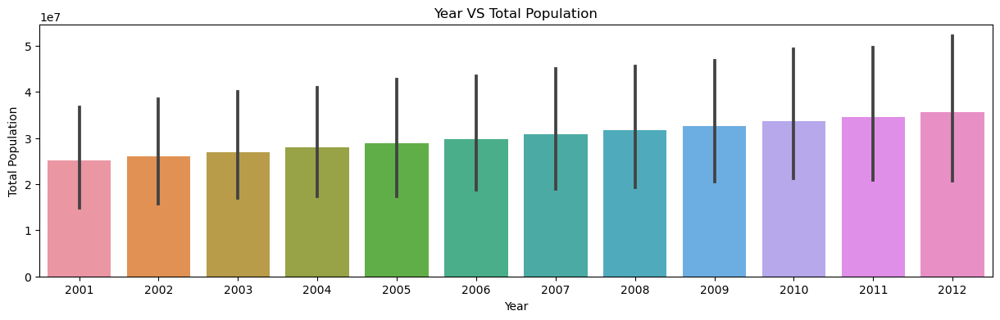

In [48]:
plt.figure(figsize=(15,4))
sns.barplot(x='Year',y='Total Population',data =df)
plt.title('Year VS Total Population')
plt.xticks(rotation = 0)
plt.ylabel('Total Population')
plt.show()

Population is gradually increases over the years 

#### Let's check the Total crime against sc over the years

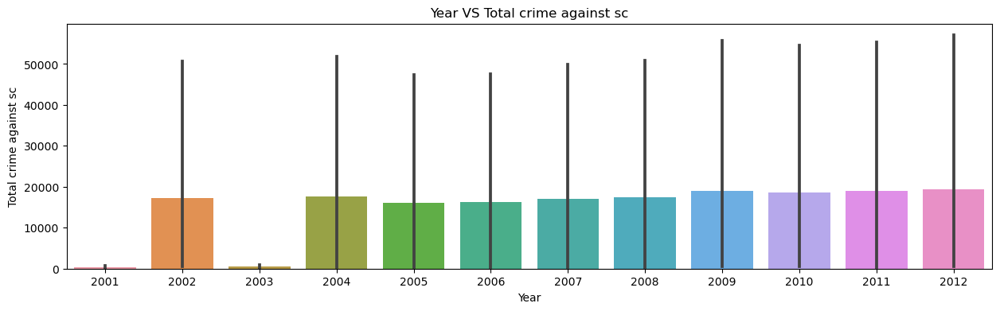

In [49]:
plt.figure(figsize=(15,4))
sns.barplot(x='Year',y='Total crime against sc',data =df)
plt.title('Year VS Total crime against sc')
plt.xticks(rotation = 0)
plt.ylabel('Total crime against sc')
plt.show()

It is constant in nature but in year 2001 and 2003 it is lowest

#### Let's check the Total crime against women over the years

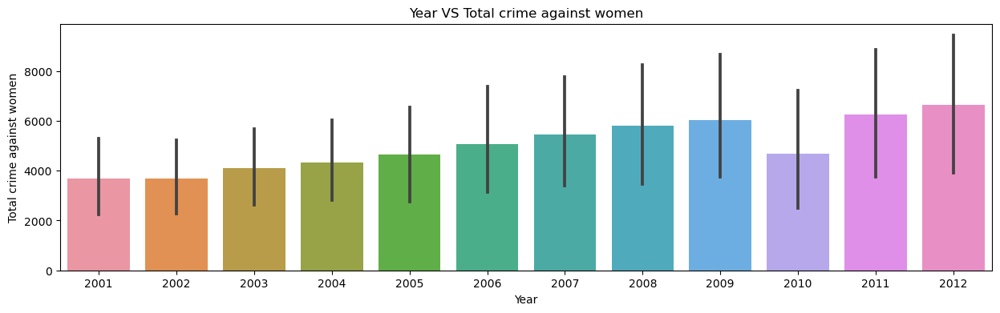

In [50]:
plt.figure(figsize=(15,4))
sns.barplot(x='Year',y='Total crime against women',data =df)
plt.title('Year VS Total crime against women')
plt.xticks(rotation = 0)
plt.ylabel('Total crime against women')
plt.show()

It is also gradually increasing over the year

#### Let's check the Total crime against ST over the years

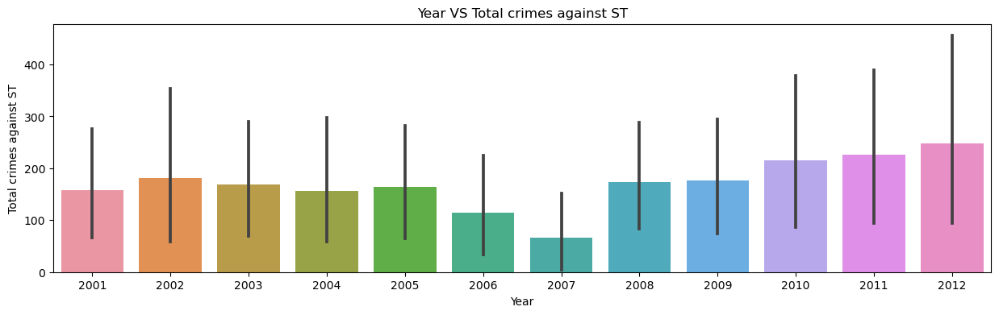

In [52]:
plt.figure(figsize=(15,4))
sns.barplot(x='Year',y='Total crimes against ST',data =df)
plt.title('Year VS Total crimes against ST')
plt.xticks(rotation = 0)
plt.ylabel('Total crimes against ST')
plt.show()

In 2012 it is maximum but in 2007 it is lowest

#### Let's check the Total crime against children over the years

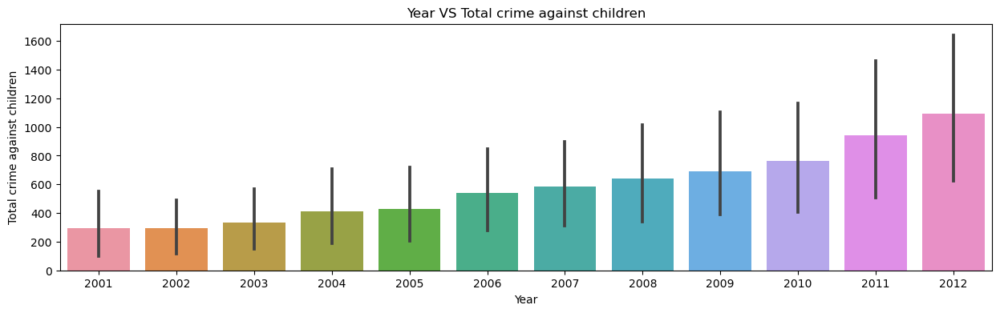

In [54]:
plt.figure(figsize=(15,4))
sns.barplot(x='Year',y='Total crime against children',data =df)
plt.title('Year VS Total crime against children')
plt.xticks(rotation = 0)
plt.ylabel('Total crime against children')
plt.show()

It is gradually increases over the years

# 2.1 --  (Analysis of Literacy Rate vs Total Crimes)

#### Let's check the relation between the Total crimes and the Literacy Rate by scatterplot

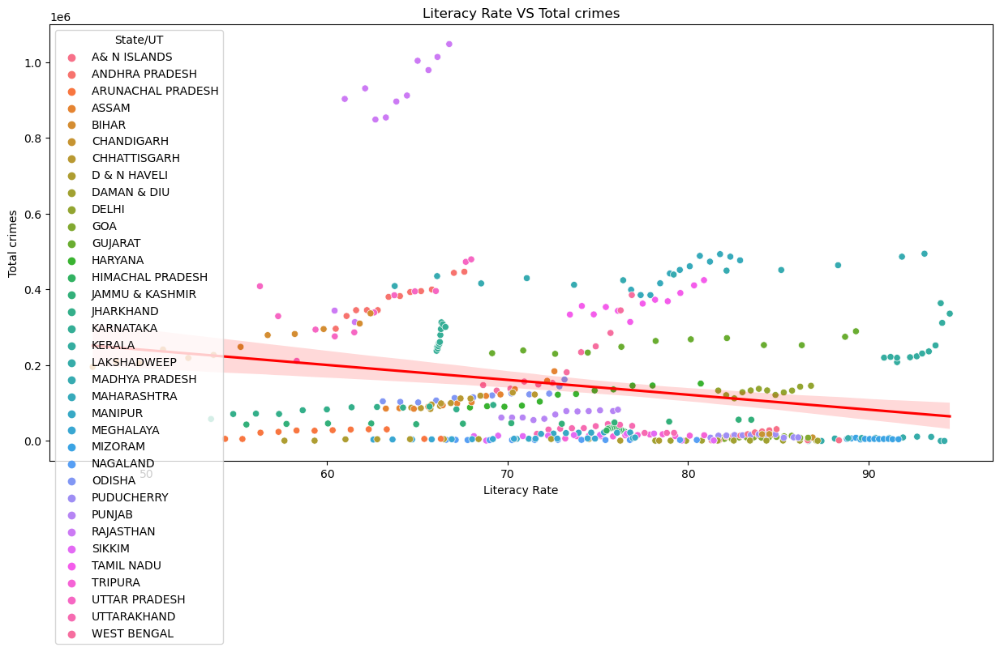

In [10]:
plt.figure(figsize=(15,7))
sns.scatterplot(x='Lit_rate',y='Total crimes',data =df, hue = 'State/UT')
sns.regplot(x='Lit_rate',y='Total crimes',data =df, scatter=False,color = 'red')
plt.title('Literacy Rate VS Total crimes')
plt.xlabel('Literacy Rate')
plt.ylabel('Total crimes')
plt.show()


From the above scatterplot we can see that as the literacy rate increases total crime is decreases

#### Let's check the relation between the Total crimes against sc and the Literacy Rate by scatterplot

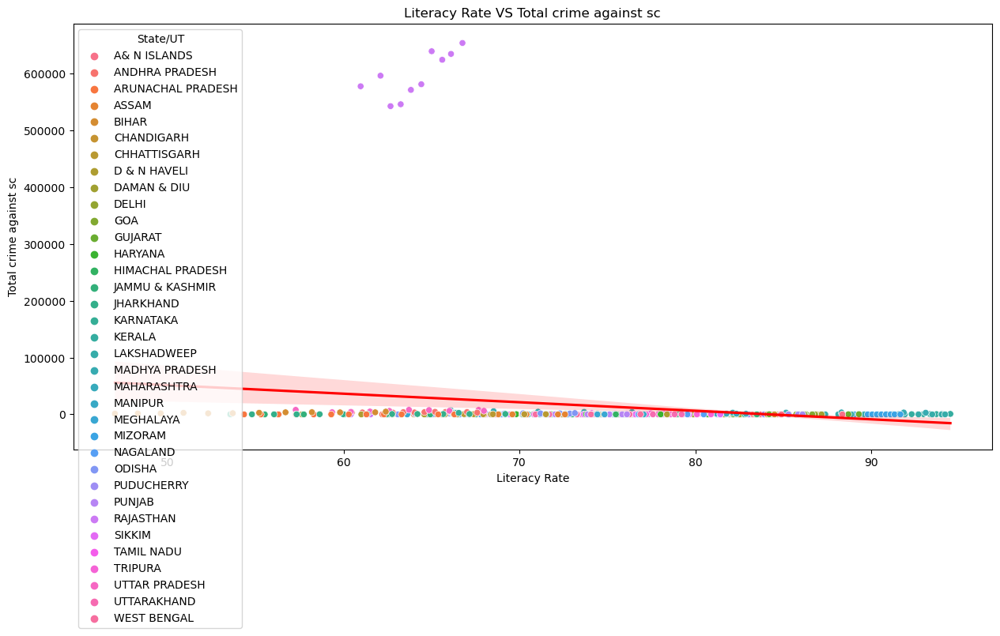

In [11]:
plt.figure(figsize=(15,7))
sns.scatterplot(x='Lit_rate',y='Total crime against sc',data =df, hue = 'State/UT')
sns.regplot(x='Lit_rate',y='Total crime against sc',data =df, scatter=False,color = 'red')
plt.title('Literacy Rate VS Total crime against sc')
plt.xlabel('Literacy Rate')
plt.ylabel('Total crime against sc')
plt.show()

From the above scatterplot we can see that as the increases total crime against sc is somehow decreases

#### Let's check the relation between the Total crimes against ST and the Literacy Rate by scatterplot

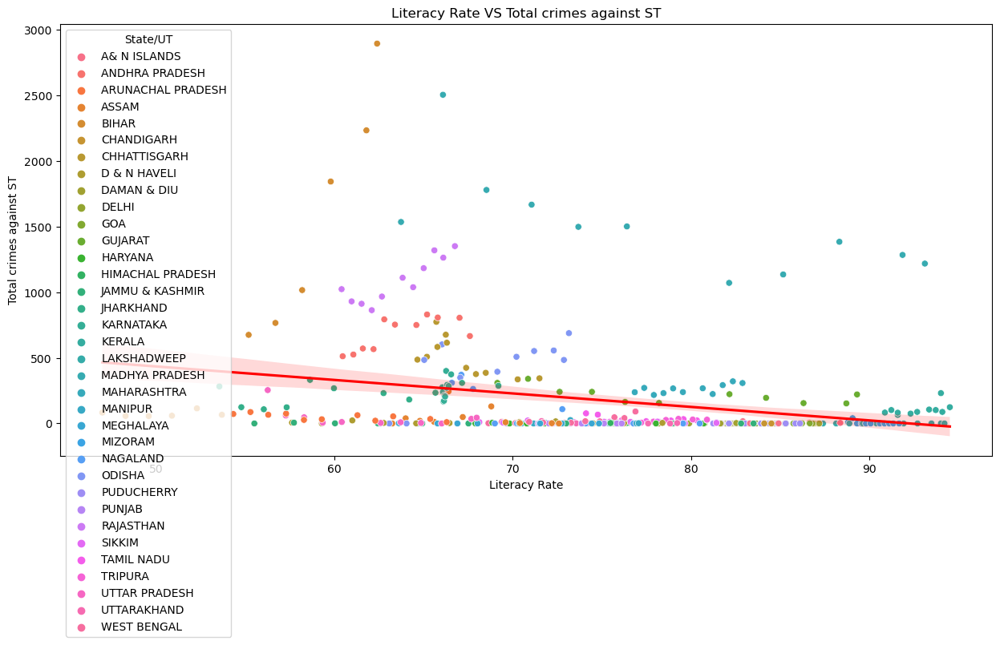

In [12]:
plt.figure(figsize=(15,7))
sns.scatterplot(x='Lit_rate',y='Total crimes against ST',data =df, hue = 'State/UT')
sns.regplot(x='Lit_rate',y='Total crimes against ST',data =df, scatter=False,color = 'red')
plt.title('Literacy Rate VS Total crimes against ST')
plt.xlabel('Literacy Rate')
plt.ylabel('Total crimes against ST')
plt.show()

As the Literacy Rate increases we can see that Total crimes against ST is decreases 

#### Let's check the relation between the Total crimes against women and the Literacy Rate by scatterplot

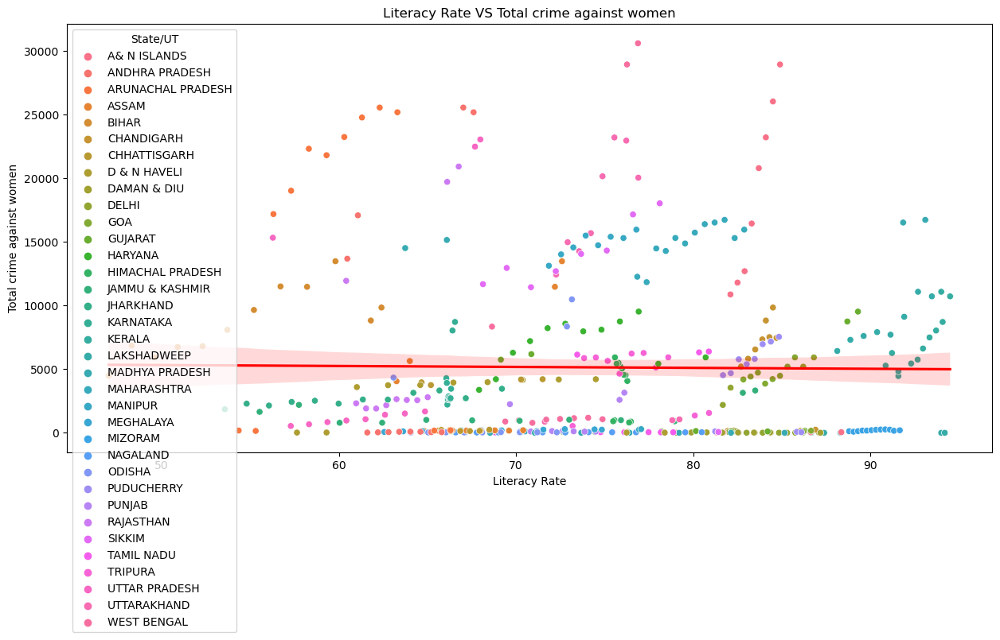

In [13]:
plt.figure(figsize=(15,7))
sns.scatterplot(x='Lit_rate',y='Total crime against women',data =df, hue = 'State/UT')
sns.regplot(x='Lit_rate',y='Total crime against women',data =df, scatter=False,color = 'red')
plt.title('Literacy Rate VS Total crime against women')
plt.xlabel('Literacy Rate')
plt.ylabel('Total crime against women')
plt.show()

As the Literacy rate crosses 85 then total crime against women is decreases but not that much

#### Let's check the relation between the Total crimes against children and the Literacy Rate by scatterplot

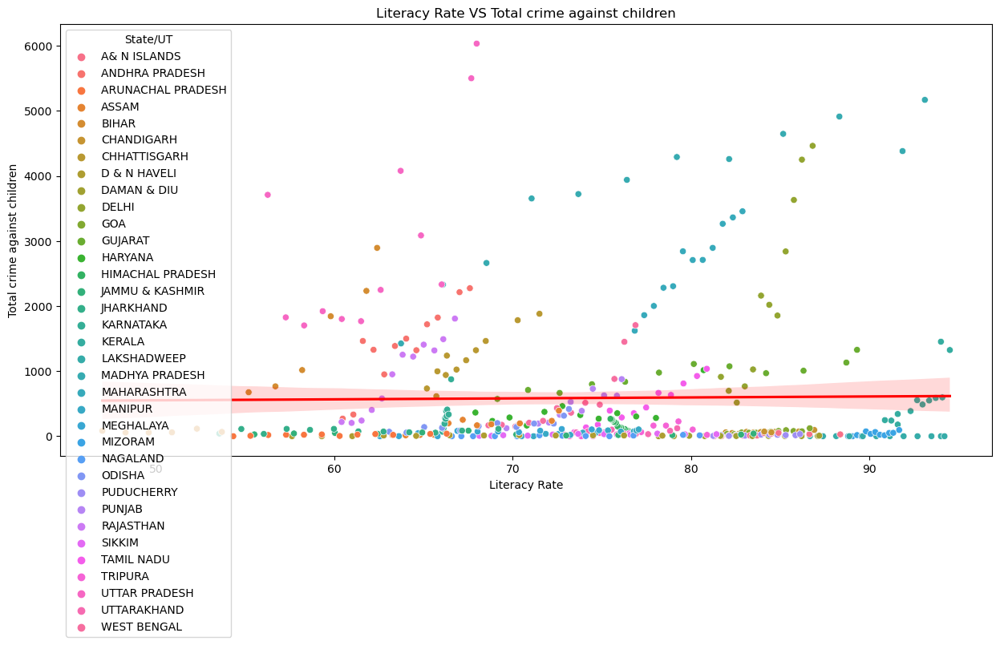

In [14]:
plt.figure(figsize=(15,7))
sns.scatterplot(x='Lit_rate',y='Total crime against children',data =df, hue = 'State/UT')
sns.regplot(x='Lit_rate',y='Total crime against children',data =df, scatter=False,color = 'red')
plt.title('Literacy Rate VS Total crime against children')
plt.xlabel('Literacy Rate')
plt.ylabel('Total crime against children')
plt.show()

As the Literacy Rate increases Total crime against children is decreases but not that much very slightly

#### Let's check the relation between the Total crime rate and the Literacy Rate by scatterplot

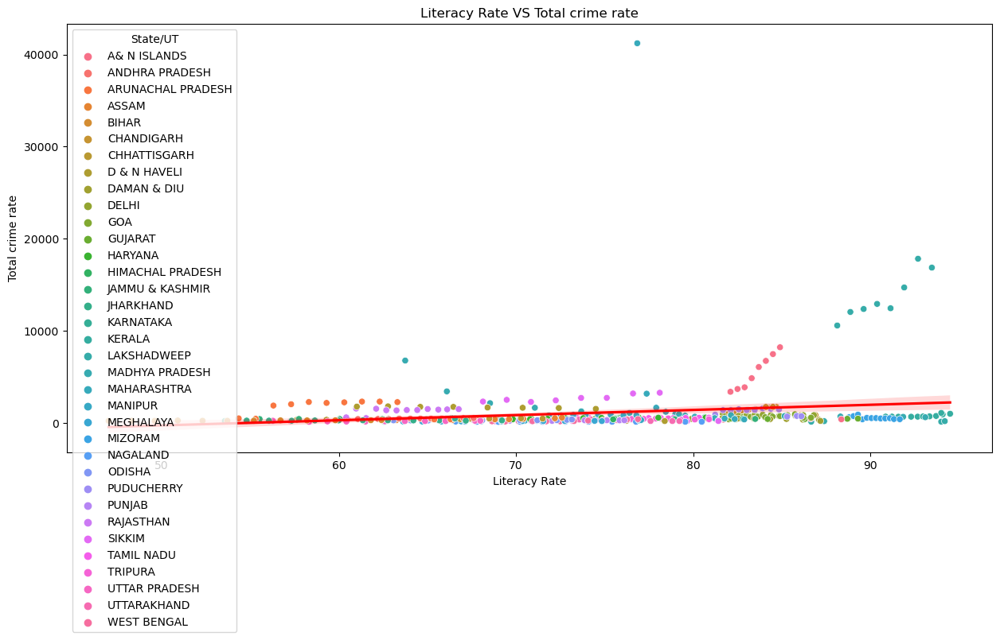

In [15]:
plt.figure(figsize=(15,7))
sns.scatterplot(x='Lit_rate',y='Total crime rate',data =df, hue = 'State/UT')
sns.regplot(x='Lit_rate',y='Total crime rate',data =df, scatter=False,color = 'red')
plt.title('Literacy Rate VS Total crime rate')
plt.xlabel('Literacy Rate')
plt.ylabel('Total crime rate')
plt.show()

Total crime Rate is also decreases when Literacy rate is increases but for few states in increases

#### Let's check the correlation with the Literacy rate for the all related columns

In [80]:
# Making new Dataframes with the related columns

In [72]:
df1 = df[['Year','MURDER','Total crime against sc','Total crime against women','Total crimes against ST','Total crime against children','Total crimes','Lit_rate']]

In [73]:
df1

,Year,MURDER,Total crime against sc,Total crime against women,Total crimes against ST,Total crime against children,Total crimes,Lit_rate
0,2001,13,0,34.0,1.0,0.0,1421,81.30
1,2001,2602,2933,13669.0,512.0,270.0,296366,60.47
2,2001,83,0,180.0,72.0,0.0,5495,54.34
3,2001,1356,6,4048.0,0.0,18.0,85490,63.25
4,2001,3643,1303,4489.0,83.0,83.0,195570,47.00
...,...,...,...,...,...,...,...,...
415,2012,1949,1647,6381.0,27.0,1036.0,424717,80.88
416,2012,124,76,1559.0,29.0,20.0,15145,80.89
417,2012,4966,6202,23033.0,44.0,6033.0,479715,67.98
418,2012,217,33,1055.0,3.0,122.0,21335,79.22


#### Checking for the correlation

In [74]:
cor = df1.corr()

In [75]:
cor

,Year,MURDER,Total crime against sc,Total crime against women,Total crimes against ST,Total crime against children,Total crimes,Lit_rate
Year,1.000000,-0.008060,0.048076,0.132856,0.057724,0.230476,0.100277,0.314890
MURDER,-0.008060,1.000000,0.060491,0.106343,0.392895,0.627394,0.623517,-0.465537
Total crime against sc,0.048076,0.060491,1.000000,0.024885,0.355756,0.084998,0.667224,-0.163993
Total crime against women,0.132856,0.106343,0.024885,1.000000,0.093270,0.174552,0.160302,-0.013862
Total crimes against ST,0.057724,0.392895,0.355756,0.093270,1.000000,0.480263,0.590674,-0.254469
Total crime against children,0.230476,0.627394,0.084998,0.174552,0.480263,1.000000,0.604178,0.016007
Total crimes,0.100277,0.623517,0.667224,0.160302,0.590674,0.604178,1.000000,-0.206705
Lit_rate,0.314890,-0.465537,-0.163993,-0.013862,-0.254469,0.016007,-0.206705,1.000000


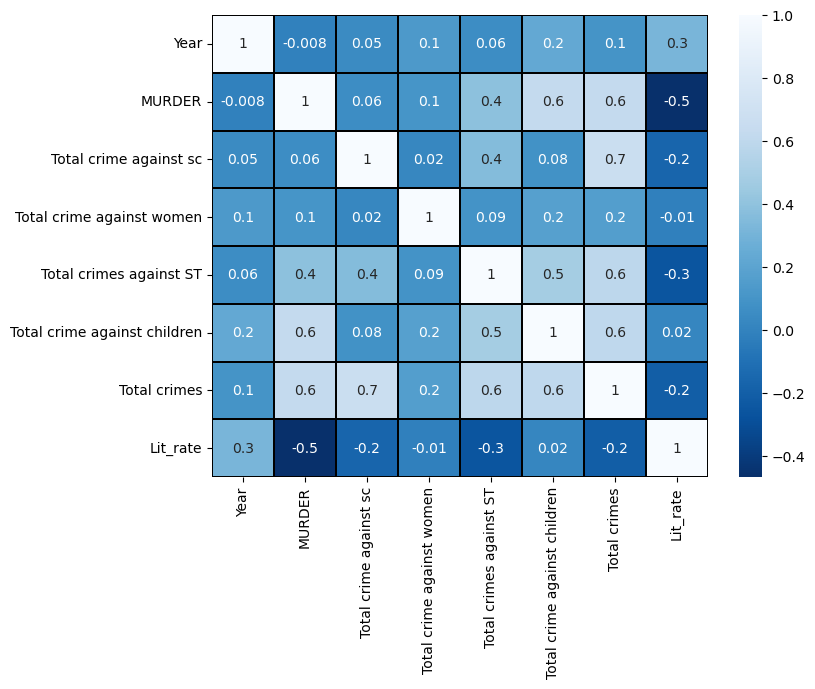

In [78]:
# visualization of correlation by heatmap 
plt.figure(figsize=(8,6))
sns.heatmap(cor,linewidths = .1,fmt='.1g',linecolor = 'black',annot = True,cmap = 'Blues_r')
plt.yticks(rotation =0)
plt.show()

In [81]:
# Checking the correlation of all columns with the Lit_rate column

In [79]:
cor['Lit_rate'].sort_values(ascending=False)

Lit_rate                        1.000000
Year                            0.314890
Total crime against children    0.016007
Total crime against women      -0.013862
Total crime against sc         -0.163993
Total crimes                   -0.206705
Total crimes against ST        -0.254469
MURDER                         -0.465537
Name: Lit_rate, dtype: float64

So as we can see that Literacy rate is in positive correlation with the year, That's mean Literacy Rate is increasing over the years.

And total crime against (women,sc,st),Total crimes and Murder the the negative correlation with the Literacy Rate column that's mean as the literacy rate increases these type of crime is decreases

total crime against children has very less positive correlation with the Literacy Rate.

# 2.2	 (Analysis of the type of crime vs each state vs Literacy rate)

In [84]:
df.columns

Index(['State/UT', 'Year', 'Total Population', 'Rural Population',
       'Urban Population', 'Total Lit', 'Lit_rate', 'Area in km2', 'MURDER',
       'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER',
       'RAPE', 'CUSTODIAL RAPE', 'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES',
       'Total crime against sc', 'Total crime against women',
       'Total crimes against ST'

### Separating the type of crime columns

In [152]:
type_crime=list(df.columns[8:-2])

In [153]:
type_crime

['MURDER',
 'ATTEMPT TO MURDER',
 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER',
 'RAPE',
 'CUSTODIAL RAPE',
 'OTHER RAPE',
 'KIDNAPPING & ABDUCTION',
 'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
 'KIDNAPPING AND ABDUCTION OF OTHERS',
 'DACOITY',
 'PREPARATION AND ASSEMBLY FOR DACOITY',
 'ROBBERY',
 'BURGLARY',
 'THEFT',
 'AUTO THEFT',
 'OTHER THEFT',
 'RIOTS',
 'CRIMINAL BREACH OF TRUST',
 'CHEATING',
 'COUNTERFIETING',
 'ARSON',
 'HURT/GREVIOUS HURT',
 'DOWRY DEATHS',
 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
 'INSULT TO MODESTY OF WOMEN',
 'CRUELTY BY HUSBAND OR HIS RELATIVES',
 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
 'CAUSING DEATH BY NEGLIGENCE',
 'OTHER IPC CRIMES',
 'TOTAL IPC CRIMES',
 'Total crime against sc',
 'Total crime against women',
 'Total crimes against ST',
 'Total crime against children']

These are the unique type of crimes

## Murder vs each state vs Literacy rate

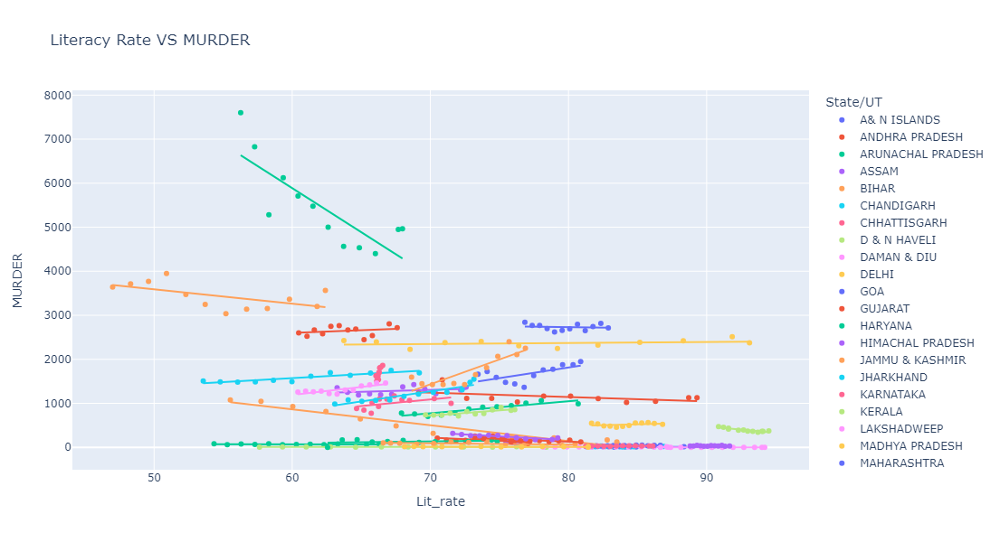

In [3]:
import plotly.express as px
fig = px.scatter(df, x='Lit_rate', y='MURDER', trendline='ols', color='State/UT', title='Literacy Rate VS MURDER')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

From the above plot we can see when literacy rate is 56.27 Uttar pradesh has the highest no of murders of around 7601 then over the time it decreases.

Lakshadweep has the lowest no of murders of around 1. Madhya pradesh has around constant no of murders like 2227 to 2500 when the literacy rate is around 93.1.

## Rape vs each state vs Literacy rate

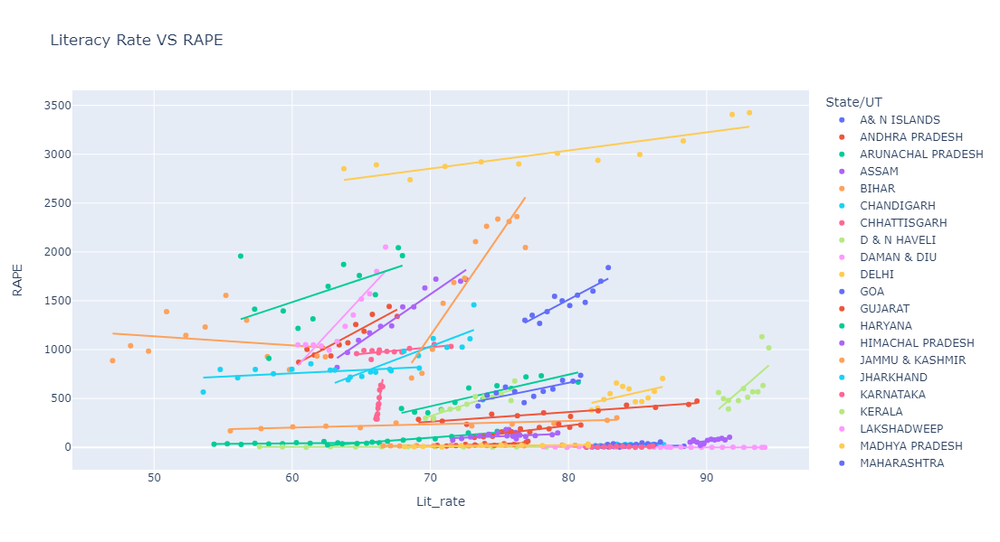

In [132]:
fig = px.scatter(df, x='Lit_rate', y='RAPE', trendline='ols', color='State/UT', title='Literacy Rate VS RAPE')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Madhya Pradesh has the highest no of rapes around 3425 when the literacy rate is 93.1. West bengal has very steep trendline from Literacy rate 68.64 to 76.26 and the rapes are 709 and 2363 respectively. Lakshadweep has negligible no of rapes 

## KIDNAPPING & ABDUCTION vs each state vs Literacy rate

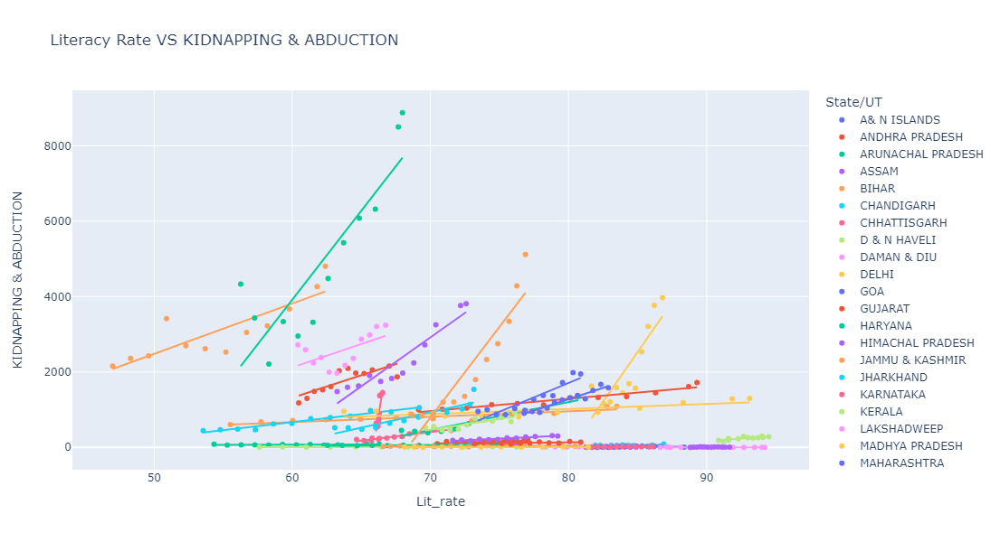

In [133]:
fig = px.scatter(df, x='Lit_rate', y='KIDNAPPING & ABDUCTION', trendline='ols', color='State/UT', title='Literacy Rate VS KIDNAPPING & ABDUCTION')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Uttar pradesh has highest no of kidnapping & abduction of 8878 when lit rate is 67.98. Lakshadweep has the lowest around 0 when lit rate is 94.2

## ROBBERY vs each state vs Literacy rate

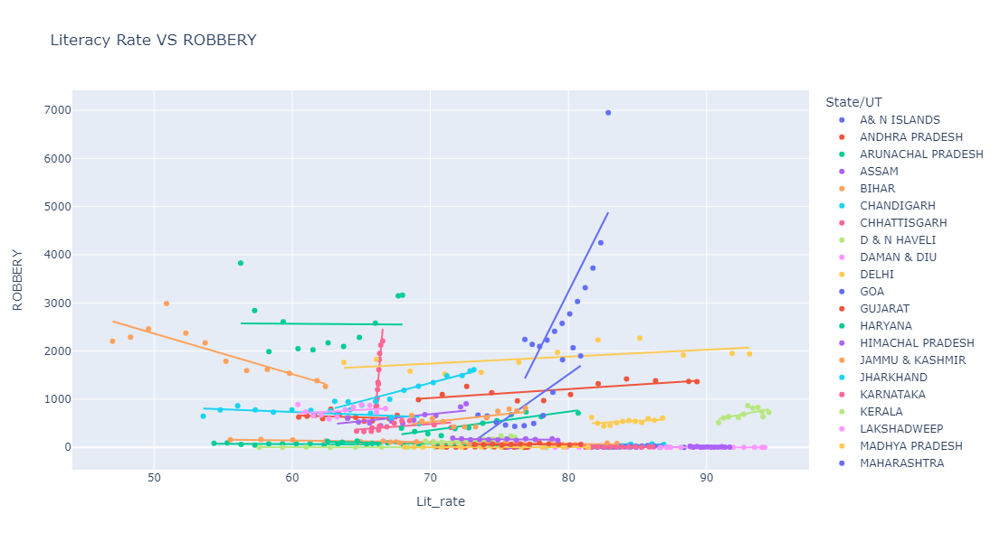

In [134]:
fig = px.scatter(df, x='Lit_rate', y='ROBBERY', trendline='ols', color='State/UT', title='Literacy Rate VS ROBBERY')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Maharashtra has the highest no of robbery cases around 6949 with lit rate 82.88 and again Lakshadweep has around 0

## BURGLARY vs each state vs Literacy rate

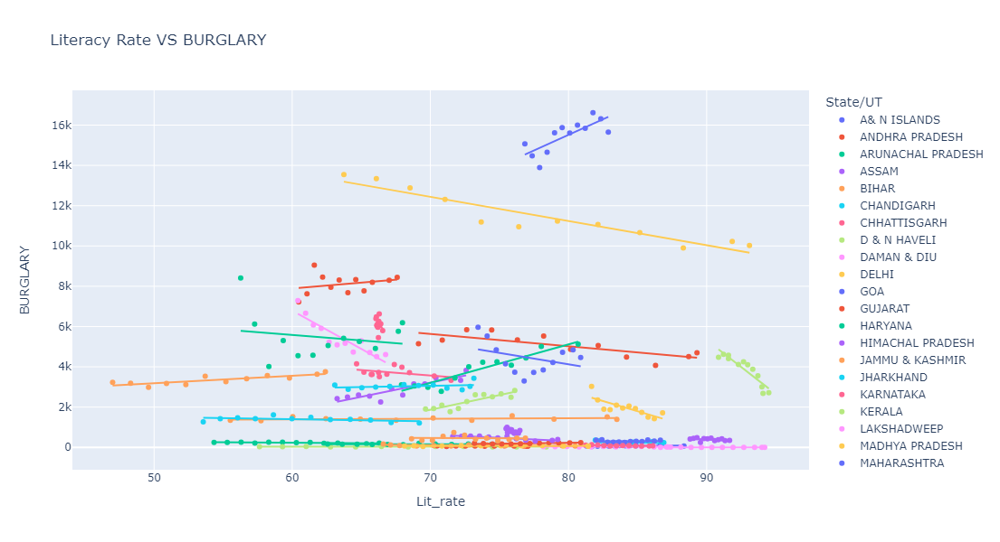

In [135]:
fig = px.scatter(df, x='Lit_rate', y='BURGLARY', trendline='ols', color='State/UT', title='Literacy Rate VS BURGLARY')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Maharashtra has the highest burglary around 16.617k with lit rate 81.77. Madhya pradesh has 13.549k with lit rate 63.74 and in Lakshadweep has 5 when lit rate is 93.4

## THEFT vs each state vs Literacy rate

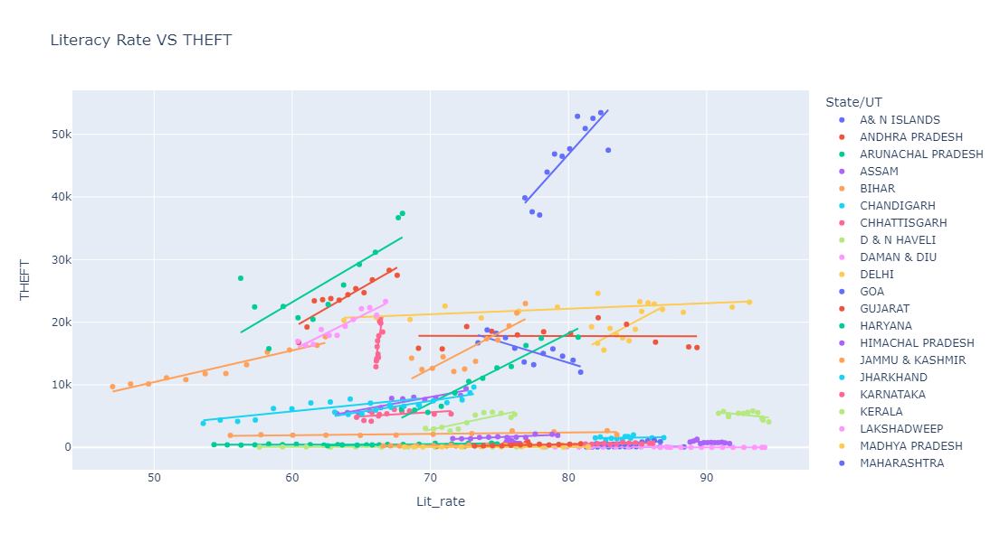

In [136]:
fig = px.scatter(df, x='Lit_rate', y='THEFT', trendline='ols', color='State/UT', title='Literacy Rate VS THEFT')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Highest theft in Maharashtra around 53.449k cases with lit rate 82.34 and Lowest in Lakshadweep around 20 with lit rate 91.14

## RIOTS vs each state vs Literacy rate

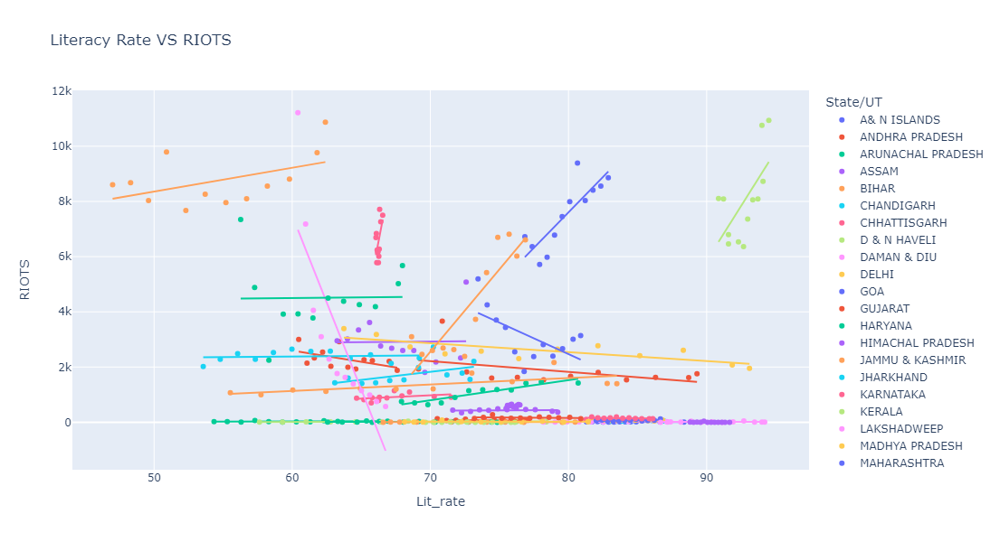

In [137]:
fig = px.scatter(df, x='Lit_rate', y='RIOTS', trendline='ols', color='State/UT', title='Literacy Rate VS RIOTS')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Highest Riots in rajasthan around 11.2k cases with lit rate 60.41 and then kerala around 11k with lit rate 94.5 and Mizoram has the lowest around 0 with lit rate 91.33

## CHEATING vs each state vs Literacy rate

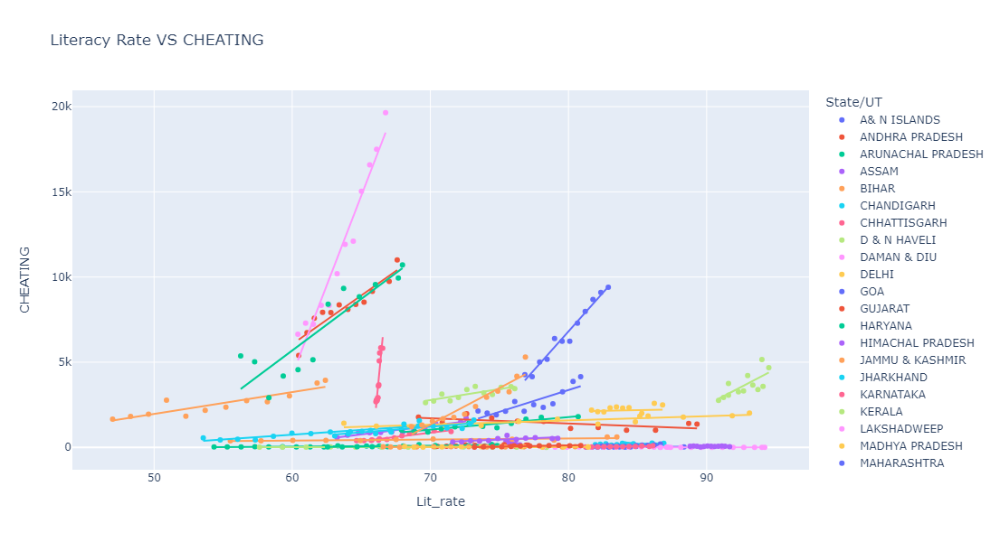

In [138]:
fig = px.scatter(df, x='Lit_rate', y='CHEATING', trendline='ols', color='State/UT', title='Literacy Rate VS CHEATING')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Rajasthan has the highest cheating cases around 19.646k cases with lit rate 66.76 and Lakshadweep has the Lowest cases 

## ARSON vs each state vs Literacy rate

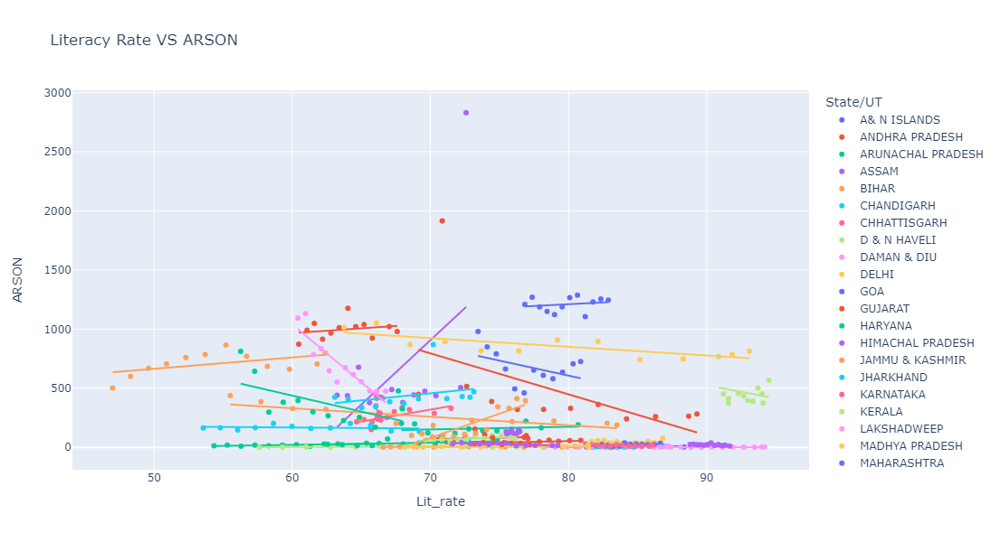

In [139]:
fig = px.scatter(df, x='Lit_rate', y='ARSON', trendline='ols', color='State/UT', title='Literacy Rate VS ARSON')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Assam has the highest arson cases around 2830 with lit rate 72.59 and Lakshadweep has around 3 cases

## HURT/GREVIOUS HURT vs each state vs Literacy rate

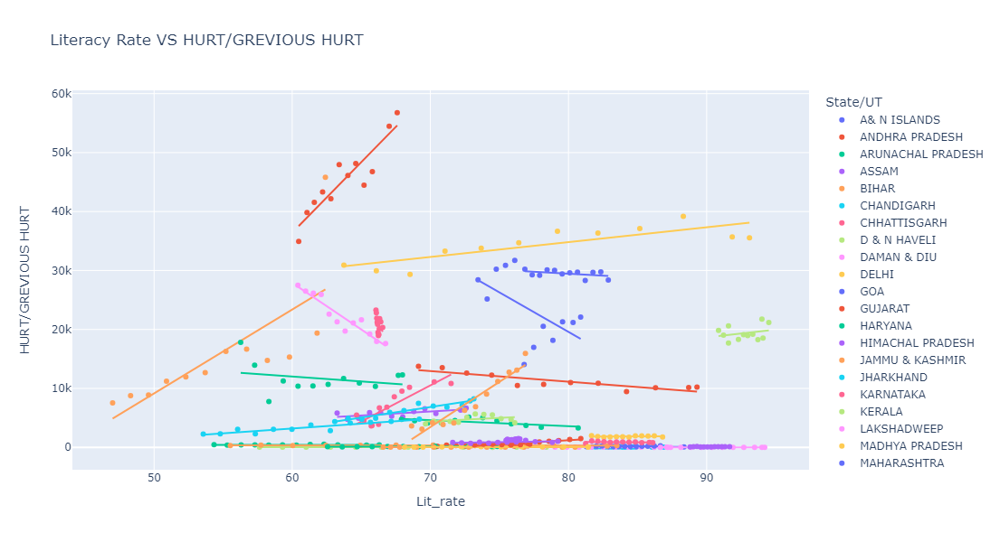

In [140]:
fig = px.scatter(df, x='Lit_rate', y='HURT/GREVIOUS HURT', trendline='ols', color='State/UT', title='Literacy Rate VS HURT/GREVIOUS HURT')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Andhra Pradesh has the highest HURT/GREVIOUS HURT cases around 56.7k with lit rate 67.6 and Lakshadweep has around 3 cases with lit rate 94.2

## DOWRY DEATHS vs each state vs Literacy rate

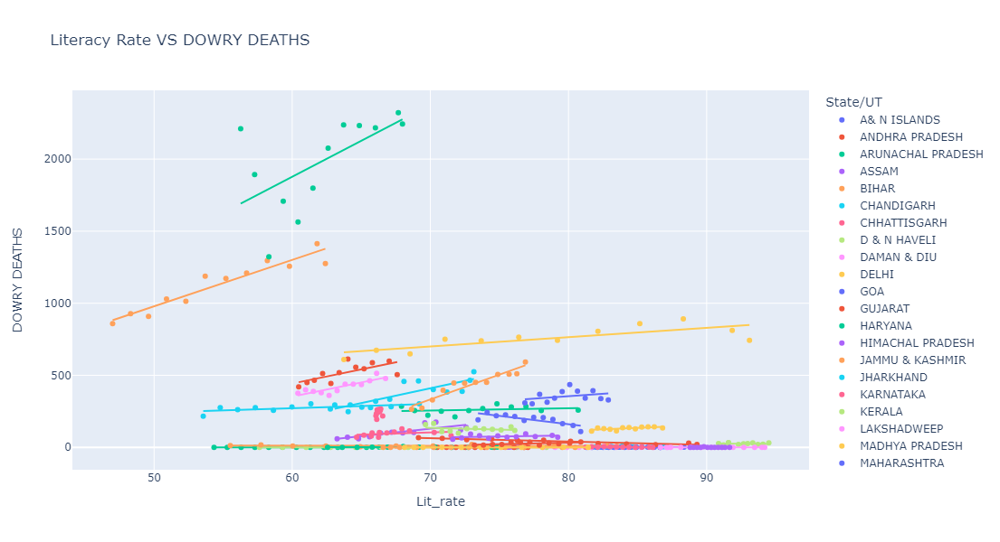

In [142]:
fig = px.scatter(df, x='Lit_rate', y='DOWRY DEATHS', trendline='ols', color='State/UT', title='Literacy Rate VS DOWRY DEATHS')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Uttar Pradesh has the highest Dowry death cases around 2322 with lit rate 67.68 and Lakshadweep has 0 cases with lit rate 94.2

## COUNTERFIETING vs each state vs Literacy rate

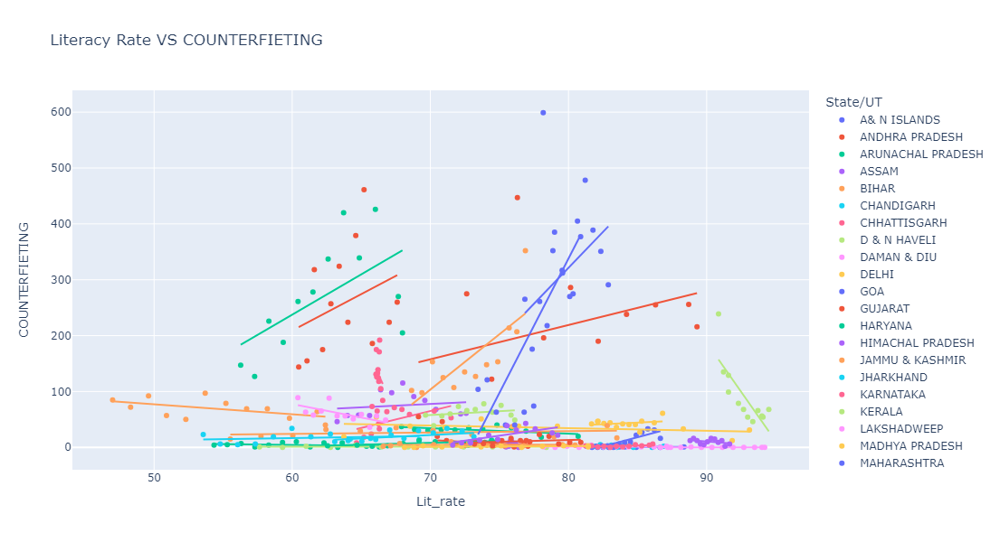

In [143]:
fig = px.scatter(df, x='Lit_rate', y='COUNTERFIETING', trendline='ols', color='State/UT', title='Literacy Rate VS COUNTERFIETING')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Highest no of COUNTERFIETING cases happend in Tamil Nadu around 599 with lit rate 78.17 ans Lakshadweep has around 0 cases 

## Total crime against sc vs each state vs Literacy rate

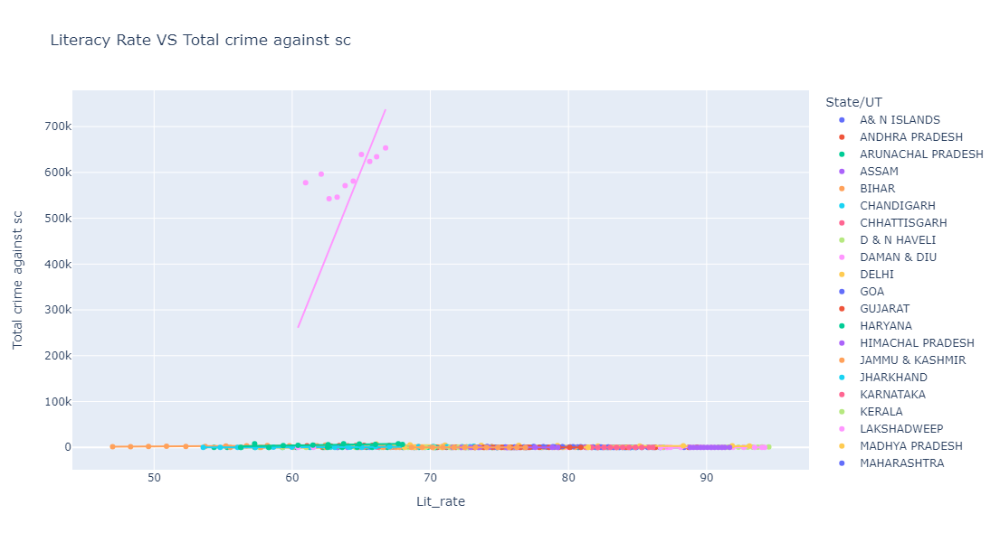

In [144]:
fig = px.scatter(df, x='Lit_rate', y='Total crime against sc', trendline='ols', color='State/UT', title='Literacy Rate VS Total crime against sc')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Rajasthan has the highest cases against SCs around 653.743k with lit rate 66.76 and Lakshadweep has around 0 cases

## Total crime against women vs each state vs Literacy rate

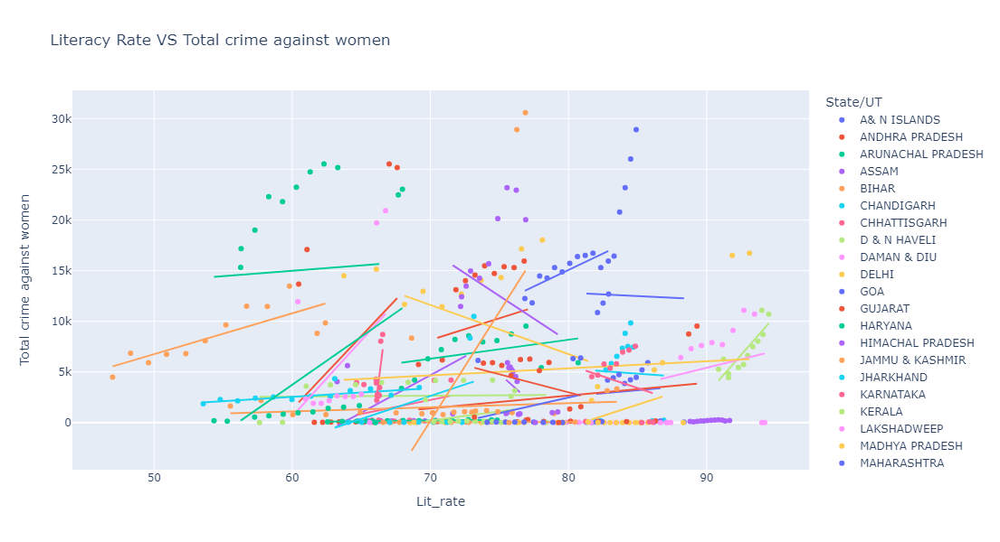

In [145]:
fig = px.scatter(df, x='Lit_rate', y='Total crime against women', trendline='ols', color='State/UT', title='Literacy Rate VS Total crime against women')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

west bengal has the highest crimes against women of around 30.585k with lit rate 76.88 and Lakshadweep has 2 cases with 94.2 lit rate

## Total crimes against ST vs each state vs Literacy rate

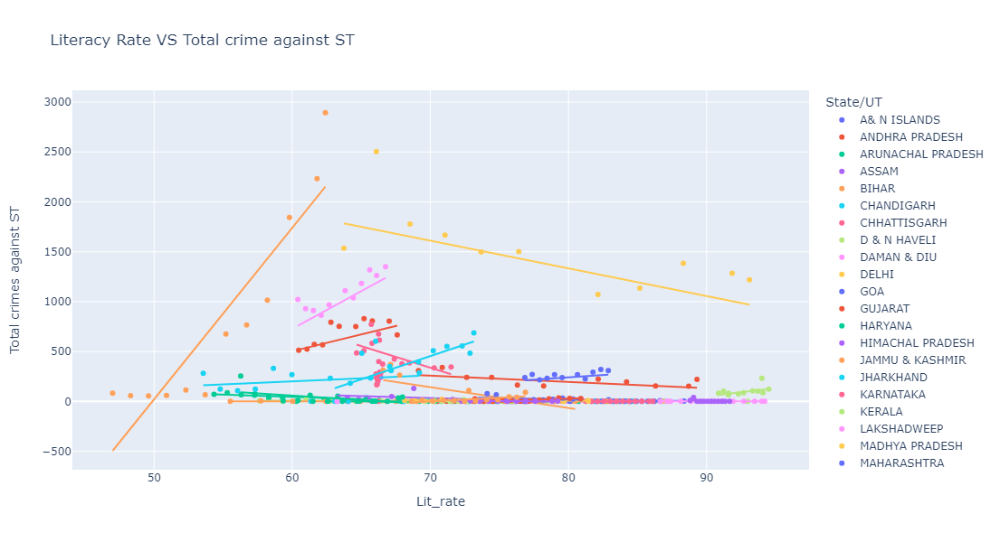

In [146]:
fig = px.scatter(df, x='Lit_rate', y='Total crimes against ST', trendline='ols', color='State/UT', title='Literacy Rate VS Total crime against ST')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Bihar has the highest crimes against STs of around 2894 cases with lit rate 62.4 and Lakshadweep has 0 cases

## Total crime against children vs each state vs Literacy rate

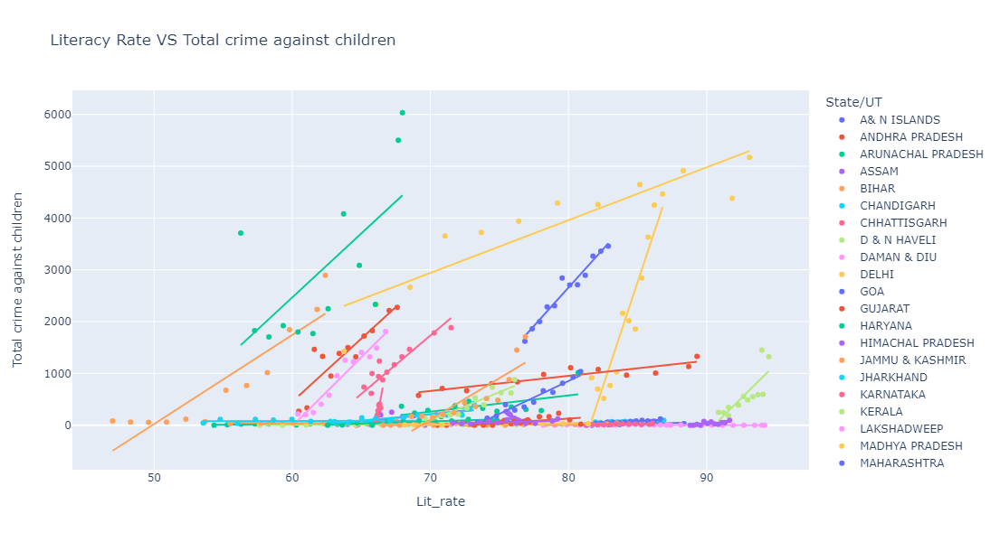

In [147]:
fig = px.scatter(df, x='Lit_rate', y='Total crime against children', trendline='ols', color='State/UT', title='Literacy Rate VS Total crime against children')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Uttar-Pradesh has the highest crimes against children os around 6033 cases with lit rate 67.98 then Madhya Pradesh has around 5168 cases with lit rate 93.1 and Lakshadweep has around 0 cases which is the lowest 

## ATTEMPT TO MURDER vs each state vs Literacy rate

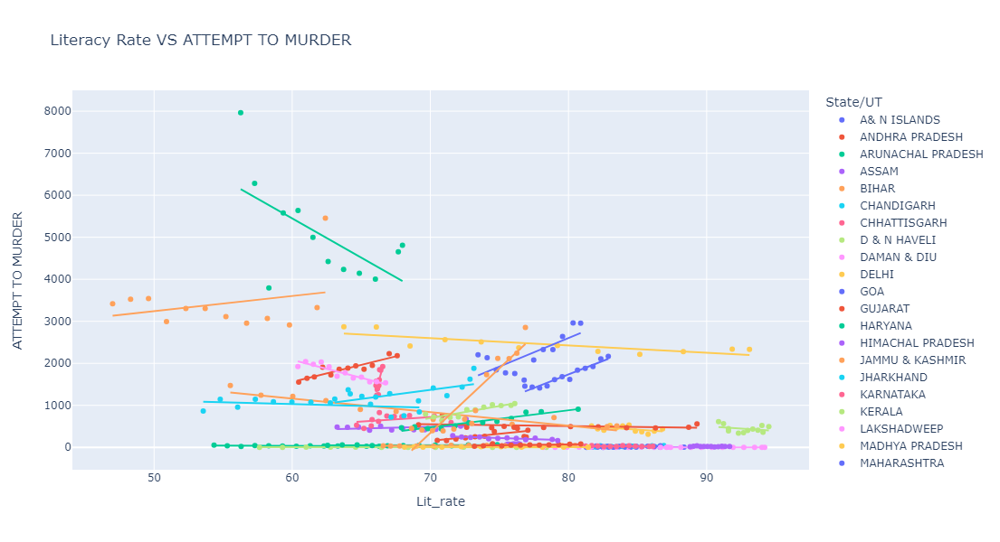

In [155]:
fig = px.scatter(df, x='Lit_rate', y='ATTEMPT TO MURDER', trendline='ols', color='State/UT', title='Literacy Rate VS ATTEMPT TO MURDER')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

So In Uttar Pradesh there is a huge cases of attemp to murder around 7964 with lit rate 56.27 and In Lakshadweep there is 0 cases with lit rate 94.2

## CULPABLE HOMICIDE NOT AMOUNTING TO MURDER vs each state vs Literacy rate

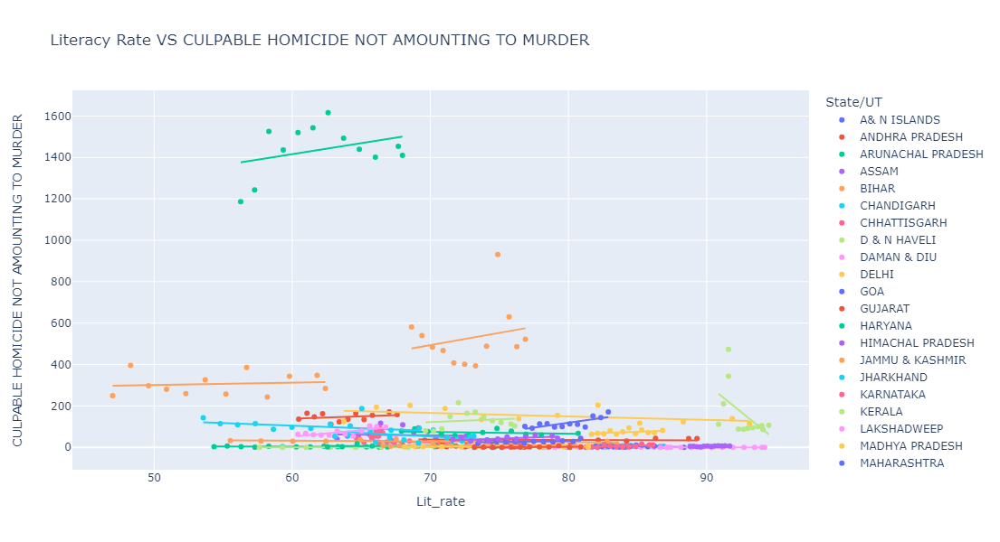

In [156]:
fig = px.scatter(df, x='Lit_rate', y='CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', trendline='ols', color='State/UT', title='Literacy Rate VS CULPABLE HOMICIDE NOT AMOUNTING TO MURDER')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

In Uttar Pradesh there is huge cases of CULPABLE HOMICIDE NOT AMOUNTING TO MURDER around 1616 cases with lit rate 62.6 and again Lakshadweep has 0 cases

## CUSTODIAL RAPE vs each state vs Literacy rate

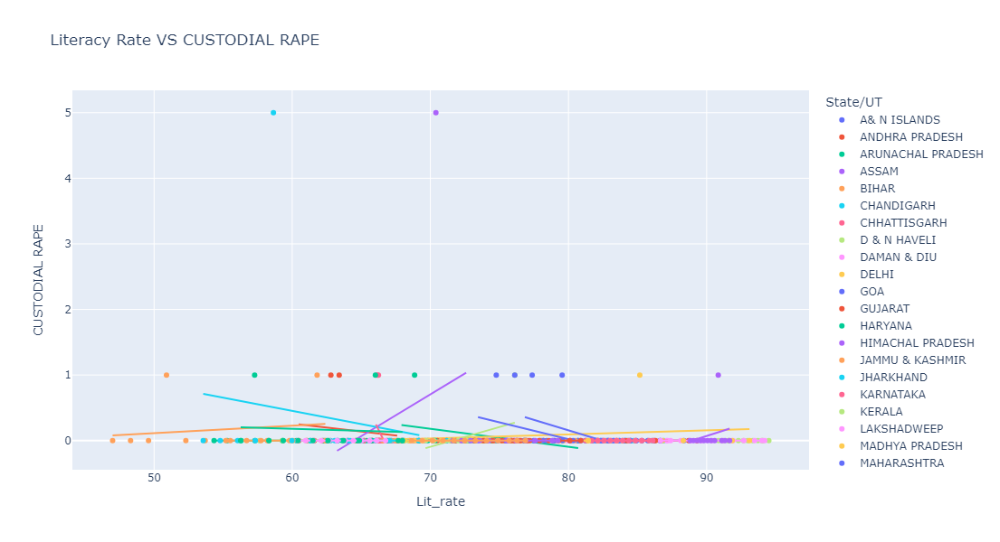

In [157]:
fig = px.scatter(df, x='Lit_rate', y='CUSTODIAL RAPE', trendline='ols', color='State/UT', title='Literacy Rate VS CUSTODIAL RAPE')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

In Assam with lit rate 70.4 and Jharkhand with lit rate 58.64 has the highest cases of CUSTODIAL RAPE around 5 cases and Lakshadweep has 0 cases

## KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS vs each state vs Literacy rate

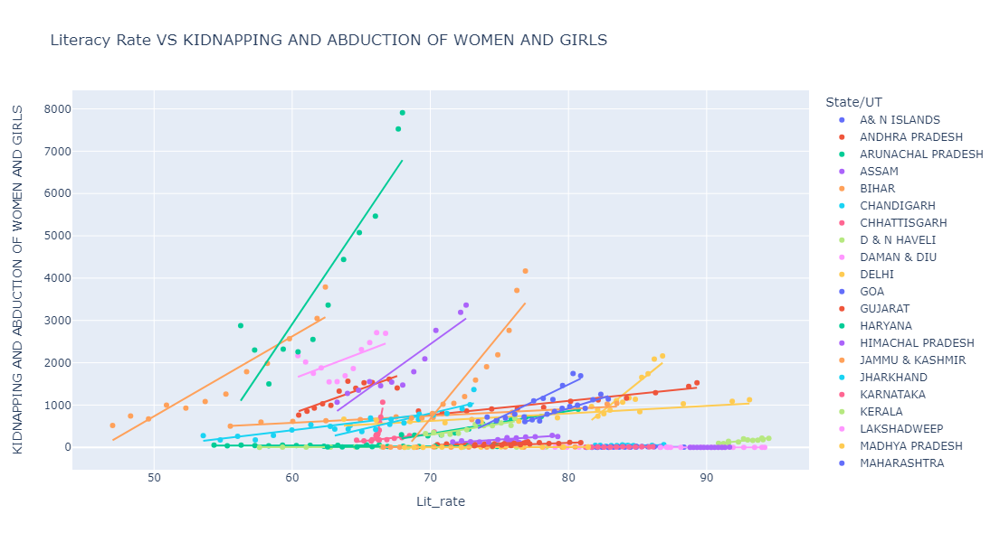

In [159]:
fig = px.scatter(df, x='Lit_rate', y='KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS', trendline='ols', color='State/UT', title='Literacy Rate VS KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

In Uttar Pradesh with lit rate 67.98 has KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS cases around 7910 and Lakshadweep has 0 cases 

## DACOITY vs each state vs Literacy rate

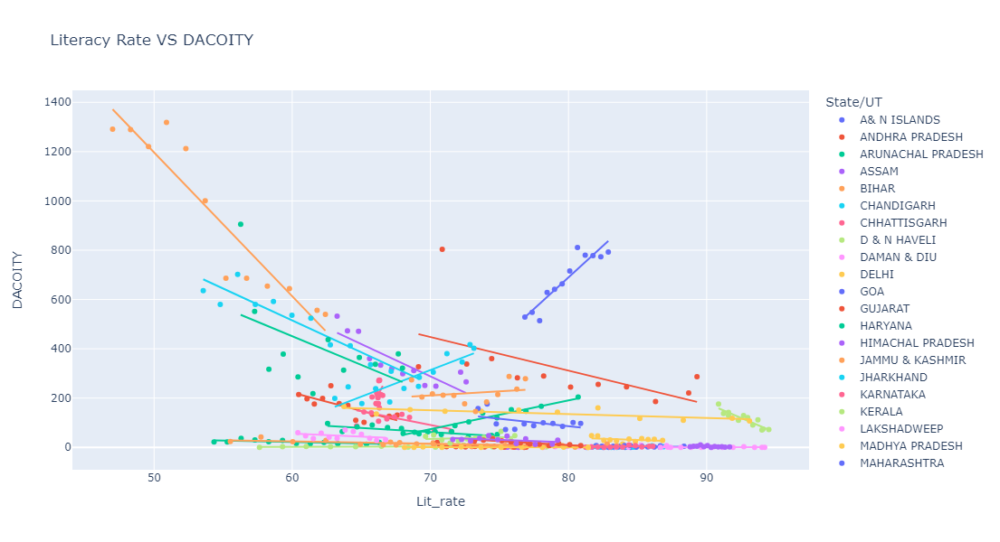

In [160]:
fig = px.scatter(df, x='Lit_rate', y='DACOITY', trendline='ols', color='State/UT', title='Literacy Rate VS DACOITY')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Bihar has the highest cases of DACOITY around 1319 with lit rate 50.9 and Lakshadweep has 0 cases UP has also good no of cases around 905 cases 

## CRIMINAL BREACH OF TRUST vs each state vs Literacy rate

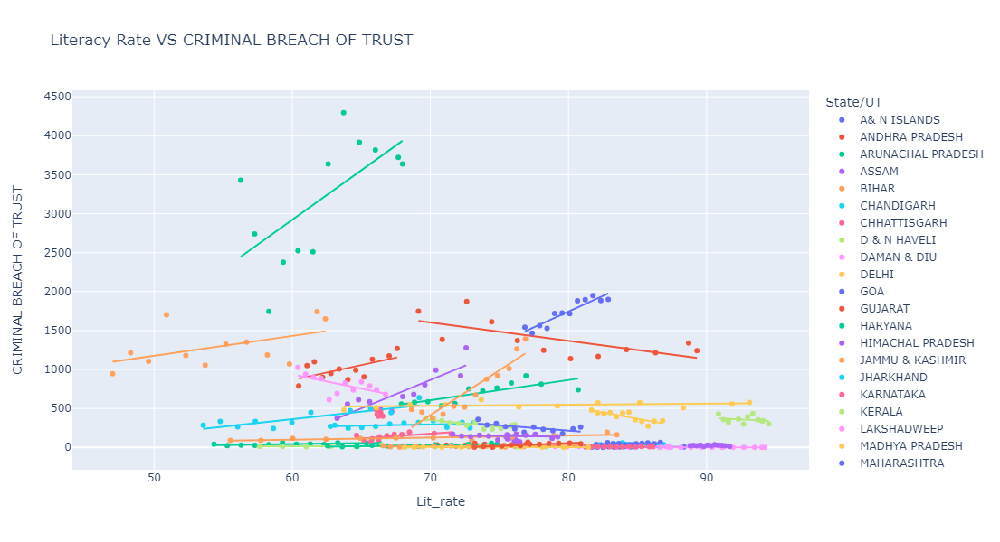

In [161]:
fig = px.scatter(df, x='Lit_rate', y='CRIMINAL BREACH OF TRUST', trendline='ols', color='State/UT', title='Literacy Rate VS CRIMINAL BREACH OF TRUST')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Uttar Pradesh has CRIMINAL BREACH OF TRUST cases around 4296 with lit rate 63.72 and Lakshadweep has maximum 1 case with lit rate 86.66

## ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY vs each state vs Literacy rate

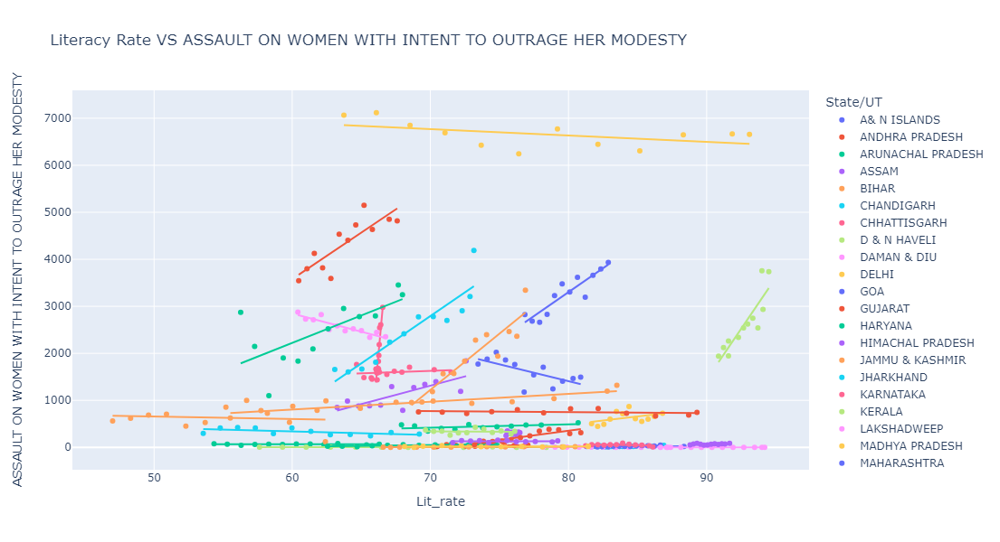

In [162]:
fig = px.scatter(df, x='Lit_rate', y='ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', trendline='ols', color='State/UT', title='Literacy Rate VS ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Madhya Pradesh has ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY cases around 7063 with lit rate 63.74 and for the lit rate 93.1 cases are 6655. Lakshadweep has 2 cases with lit rate 91.14

## CRUELTY BY HUSBAND OR HIS RELATIVES vs each state vs Literacy rate

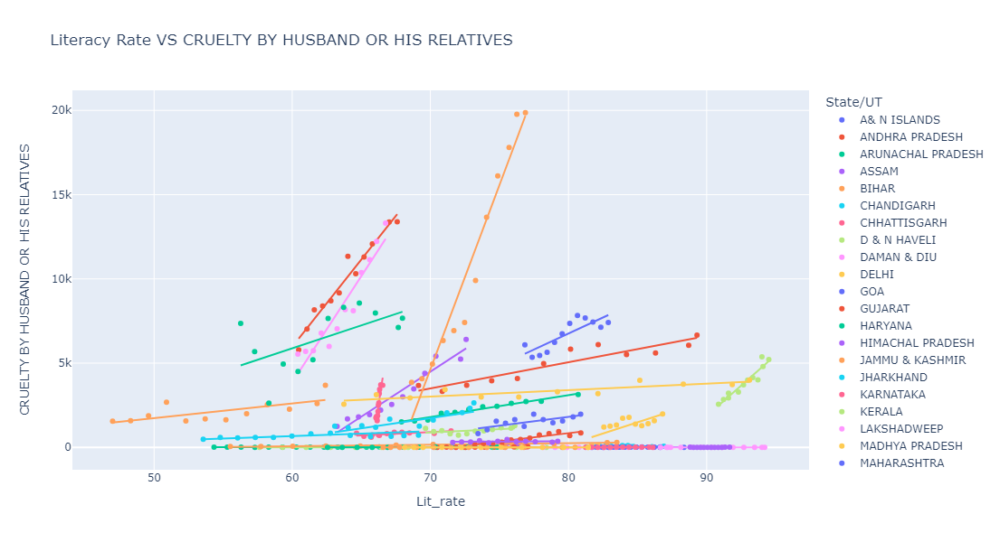

In [163]:
fig = px.scatter(df, x='Lit_rate', y='CRUELTY BY HUSBAND OR HIS RELATIVES', trendline='ols', color='State/UT', title='Literacy Rate VS CRUELTY BY HUSBAND OR HIS RELATIVES')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

West bengal has CRUELTY BY HUSBAND OR HIS RELATIVES cases around 19.865k with lit rate 76.88 and for the lit rate 76.26 cases are 19.772k cases and Lakshadweep has 1 case with lit rate 91.91

## IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES vs each state vs Literacy rate

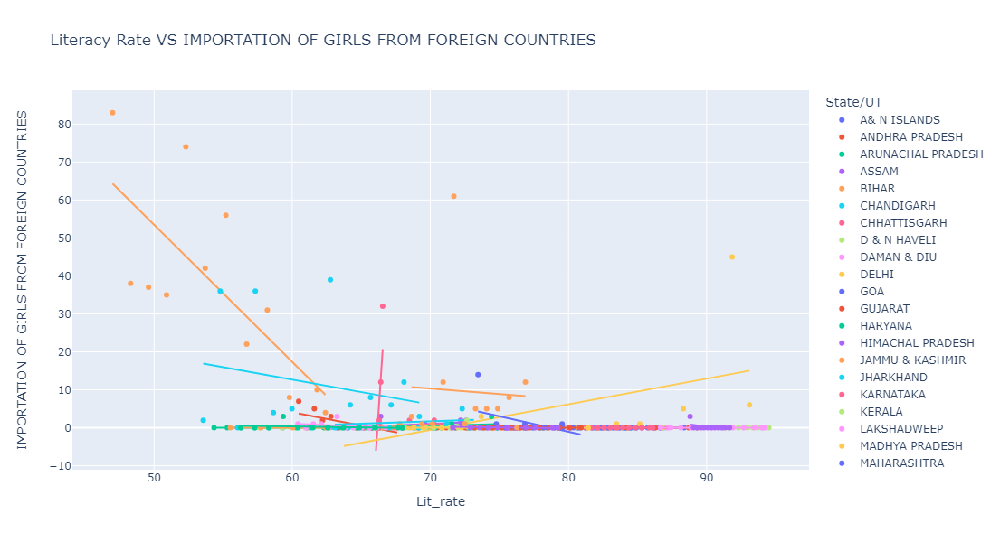

In [164]:
fig = px.scatter(df, x='Lit_rate', y='IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', trendline='ols', color='State/UT', title='Literacy Rate VS IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Bihar has the highest cases of IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES around 83 with lit rate 47. WB has 61 with lit rate 71.7 and Lakshadweep has 0 cases with lit rate 93.47

## CAUSING DEATH BY NEGLIGENCE vs each state vs Literacy rate

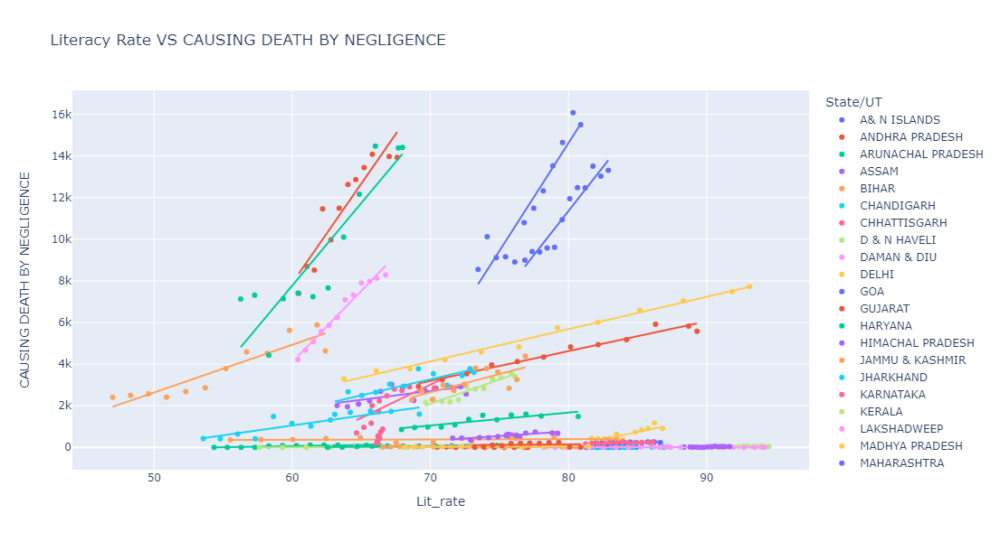

In [165]:
fig = px.scatter(df, x='Lit_rate', y='CAUSING DEATH BY NEGLIGENCE', trendline='ols', color='State/UT', title='Literacy Rate VS CAUSING DEATH BY NEGLIGENCE')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Tamil Nadu has the highest cases of CAUSING DEATH BY NEGLIGENCE around 16.076k cases with lit rate 80.33 then Uttar Pradesh with cases 14.472k cases with lit rate 66.02 and Lakshadweep has 0 cases

## TOTAL IPC CRIMES vs each state vs Literacy rate

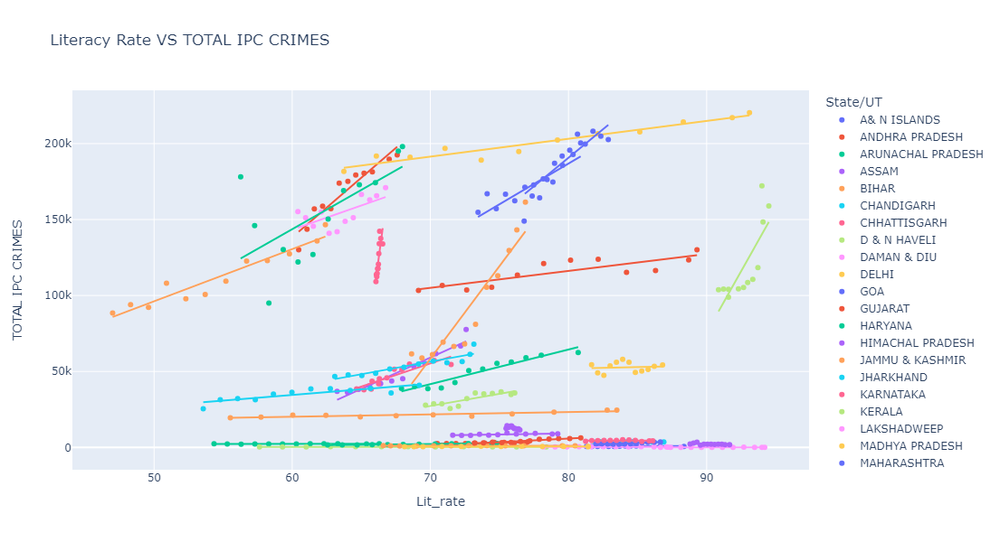

In [166]:
fig = px.scatter(df, x='Lit_rate', y='TOTAL IPC CRIMES', trendline='ols', color='State/UT', title='Literacy Rate VS TOTAL IPC CRIMES')
fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

Madhya Pradesh has TOTAL IPC CRIMES cases around 220.335k with lit rate 93.1 and at the year 2012 Lakshadweep has 60 cases

# 2.3	(Analysis of year-on-year total crime rate)

#### So the Formula I have used to calculate total crime rate is (Total crime / Total Population)*100000

In [5]:
#Let's check the year wise crime rate for each state

In [16]:
#Checking for the no of columns

In [6]:
df['State/UT'].value_counts()

State/UT
A& N ISLANDS         12
PUDUCHERRY           12
MAHARASHTRA          12
MANIPUR              12
MEGHALAYA            12
MIZORAM              12
NAGALAND             12
ODISHA               12
PUNJAB               12
LAKSHADWEEP          12
RAJASTHAN            12
SIKKIM               12
TAMIL NADU           12
TRIPURA              12
UTTAR PRADESH        12
UTTARAKHAND          12
MADHYA PRADESH       12
KERALA               12
ANDHRA PRADESH       12
DAMAN & DIU          12
ARUNACHAL PRADESH    12
ASSAM                12
BIHAR                12
CHANDIGARH           12
CHHATTISGARH         12
D & N HAVELI         12
DELHI                12
KARNATAKA            12
GOA                  12
GUJARAT              12
HARYANA              12
HIMACHAL PRADESH     12
JAMMU & KASHMIR      12
JHARKHAND            12
WEST BENGAL          12
Name: count, dtype: int64

In [23]:
states = df['State/UT'].unique()

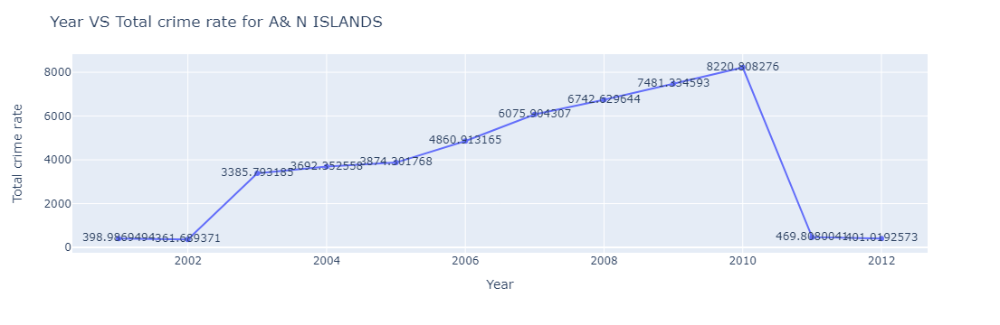

In [69]:
fig = px.line(df.loc[df['State/UT'] == states[0]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[0]}')
fig.show()

##### From the above plot we can see that crime rate is increasing upto year 2010 with no of 8220.808276 but after that there is sudden huge drop at the year 2011 with no of 469.808 then it decreases 

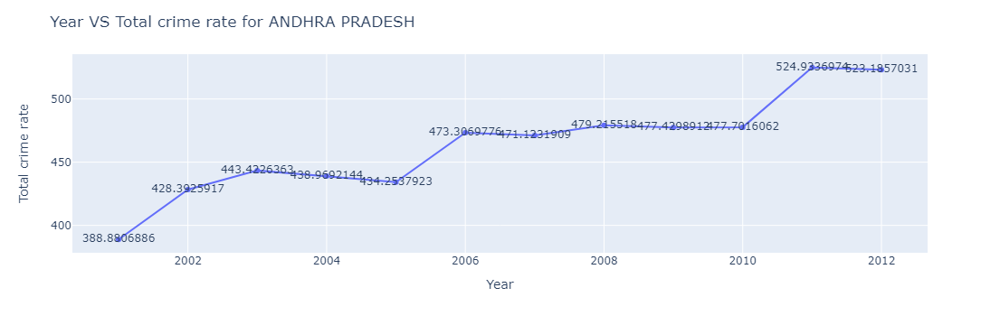

In [68]:
fig = px.line(df.loc[df['State/UT'] == states[1]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[1]}')
fig.show()

##### Here crime rate is lowest at the year 2001 when the crime rate is 388.88 then it continously incerases upto 2012 when the crime rate is 524.933

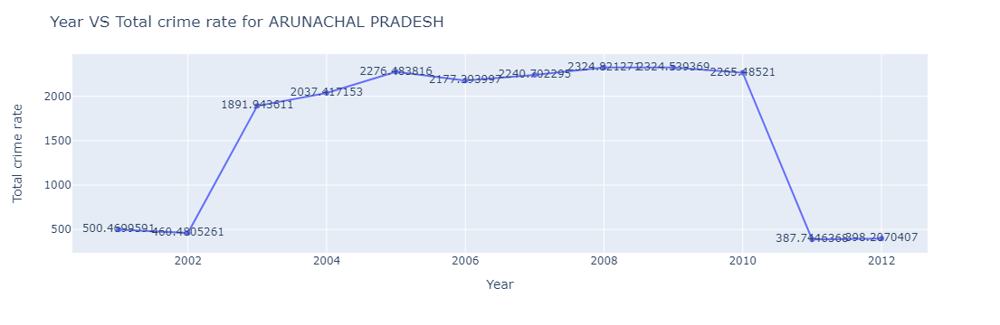

In [67]:
fig = px.line(df.loc[df['State/UT'] == states[2]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[2]}')
fig.show()

##### crime rate is lowest at 2001 with 500.469 then it increases almost 3.5 times at the year 2003 then it almost constant for upto 2010 then there is a sudden huge drop at the year 2011 with no 387.74

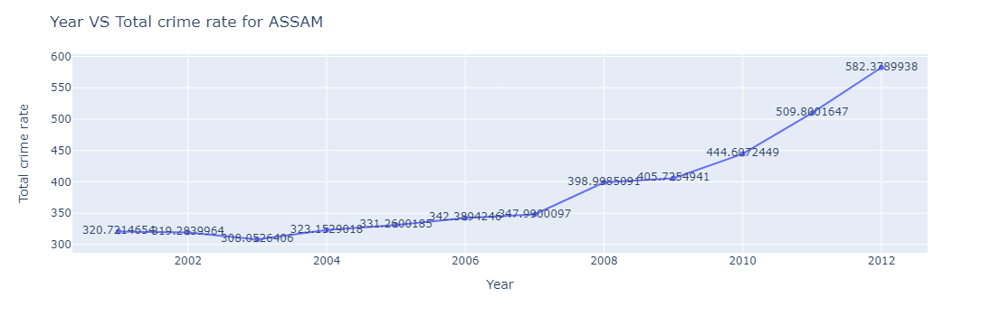

In [66]:
fig = px.line(df.loc[df['State/UT'] == states[3]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[3]}')
fig.show()

##### For Assam crime rate is continously increases from the year 2001 when the crime rate is 320.73 to 2012 and the crime rate is 582.37

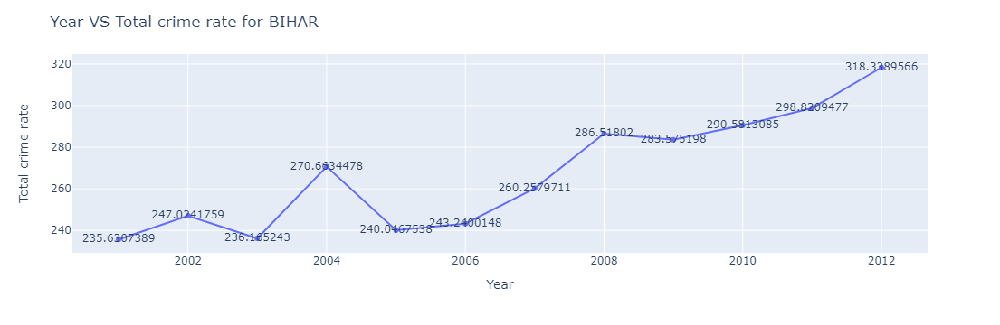

In [65]:
fig = px.line(df.loc[df['State/UT'] == states[4]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[4]}')
fig.show()

##### In Bihar there is some ups and down of crime rate for the years(2003-2004-2005) then it continously increases till 2012 and now crime rate is 318.33

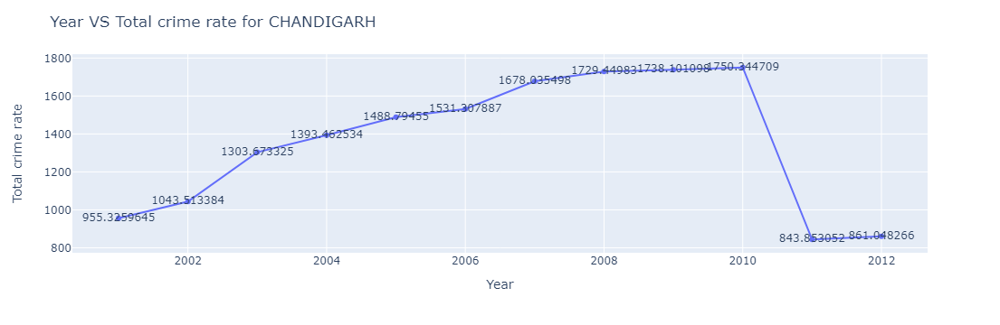

In [64]:
fig = px.line(df.loc[df['State/UT'] == states[5]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[5]}')
fig.show()

##### Here crime rate starts from 955.325 at the year 2001 then it continously increases till 2010 with no 1750.344 then it decreases at the year 2011 with no 843.85

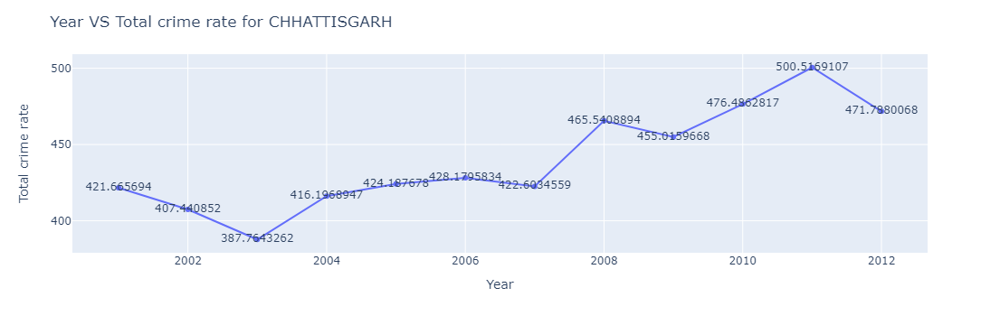

In [63]:
fig = px.line(df.loc[df['State/UT'] == states[6]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[6]}')
fig.show()

##### Here crime rate starts from 421.66 in the year 2001 then it decreases in the year 2003(387.764) then it continuously increases upto 2011(500.51) then rate decreases at the year 2012

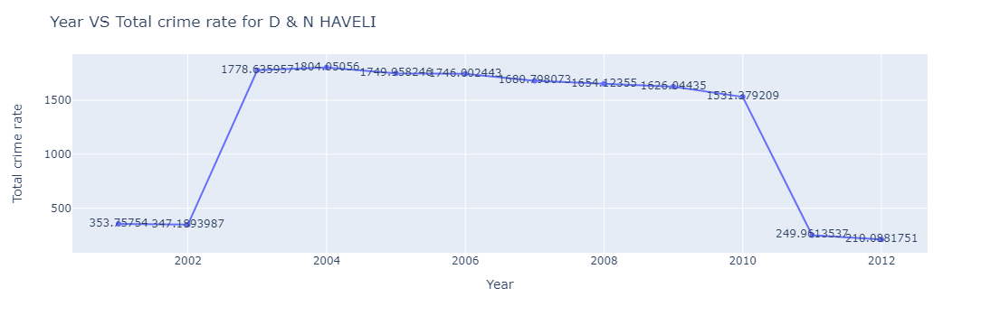

In [62]:
fig = px.line(df.loc[df['State/UT'] == states[7]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[7]}')
fig.show()

##### in the year 2001 and 2002 rate is constant (353.75-347.18) then it increases in the year 2003(1778.63) then it almost constant till 2010 then it decreases in 2011

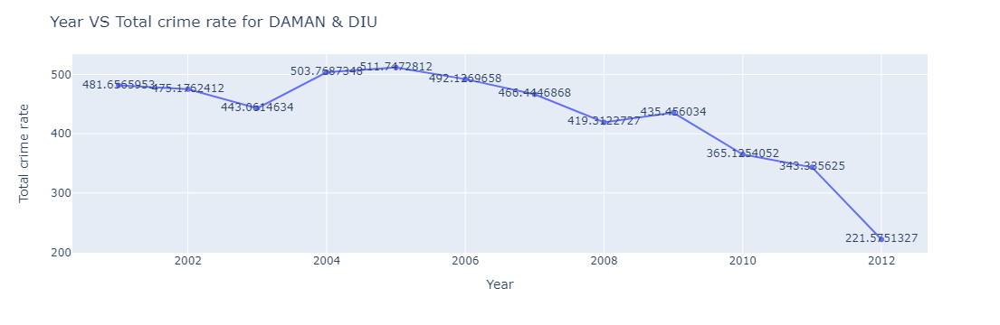

In [61]:
fig = px.line(df.loc[df['State/UT'] == states[8]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[8]}')
fig.show()

##### Here crime rate starts from 2001(481.65) then it continously decreases till 2012(221.57)

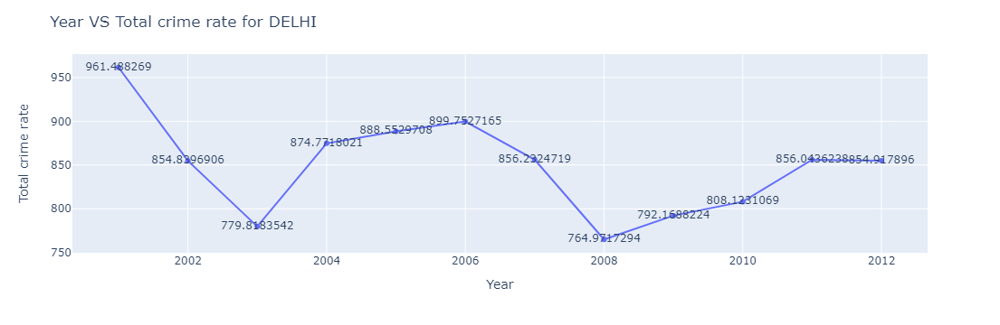

In [60]:
fig = px.line(df.loc[df['State/UT'] == states[9]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[9]}')
fig.show()

##### For Delhi in the year 2001 crime rate is 961.488 but over the years it improves and now in the year 2012 it becomes 854.917. In the year 2008 the rate is lowest is about 764.97

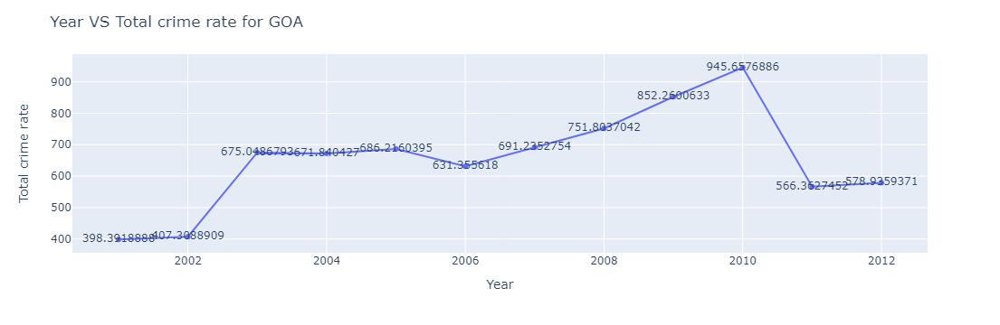

In [59]:
fig = px.line(df.loc[df['State/UT'] == states[10]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[10]}')
fig.show()

##### In Goa crime is continously increases till 2010 but then it decreases in the year 2011(566.36)

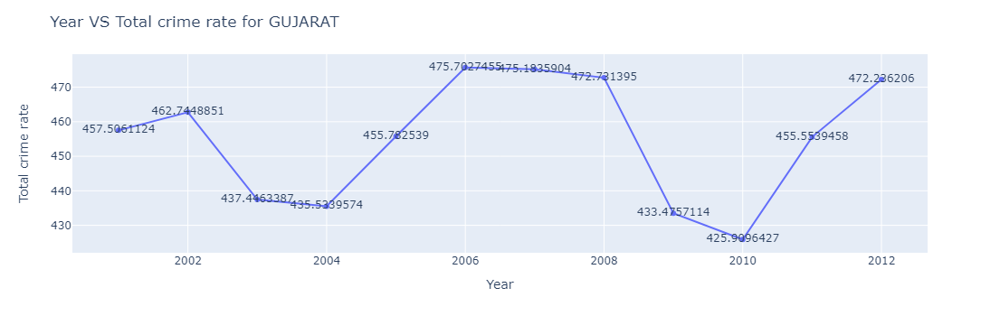

In [58]:
fig = px.line(df.loc[df['State/UT'] == states[11]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[11]}')
fig.show()

##### Here at the year 2010 crime rate is the lowest around 425.90 and then it becomes 472.22 in the year 2012

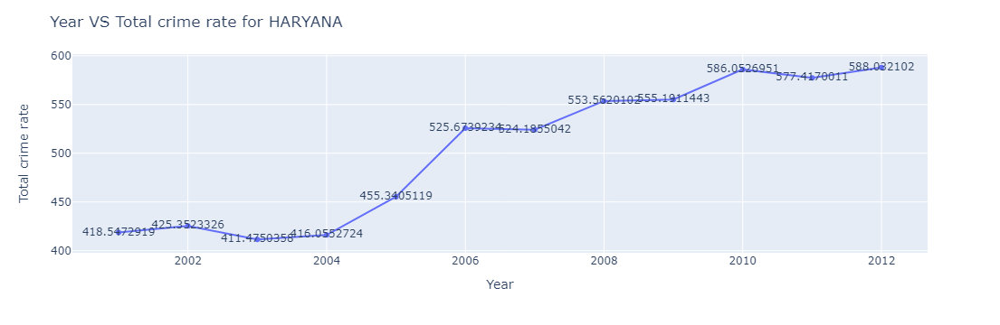

In [57]:
fig = px.line(df.loc[df['State/UT'] == states[12]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[12]}')
fig.show()

##### Here crime rate is continously increases from 2001(418.54) to 2012(588.032)

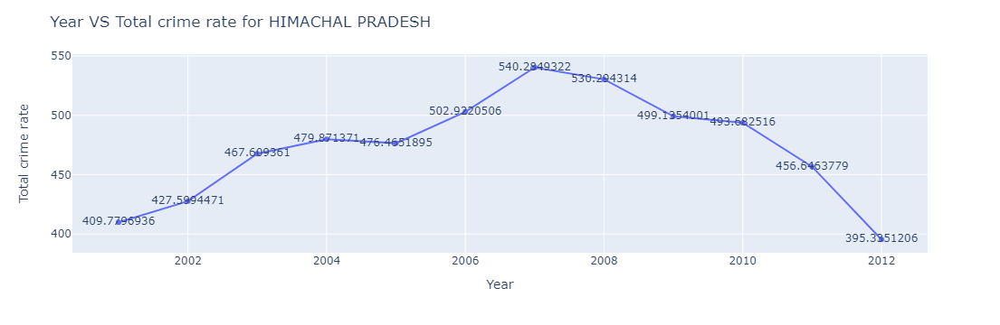

In [56]:
fig = px.line(df.loc[df['State/UT'] == states[13]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[13]}')
fig.show()

In Himachal the highest crime rate in the year 2007(540.28) and then it continouosly decreases till 2012(395.33)

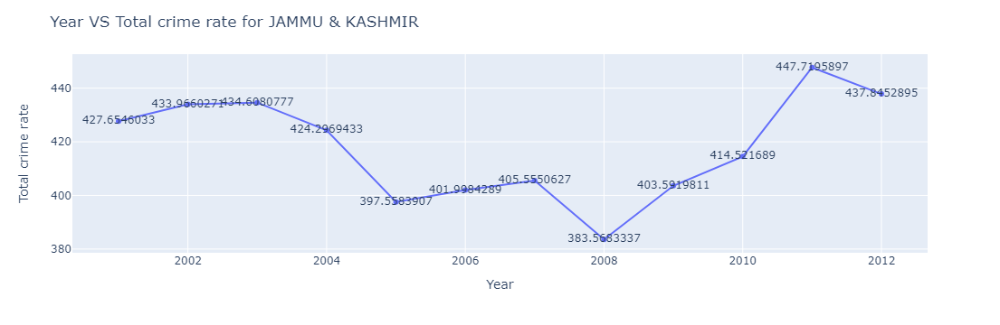

In [55]:
fig = px.line(df.loc[df['State/UT'] == states[14]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[14]}')
fig.show()

##### Here from the year 2008 to 2011 there is sudden increase in crime rate is about 383.56-447.71 then somehow it decreases at 2012

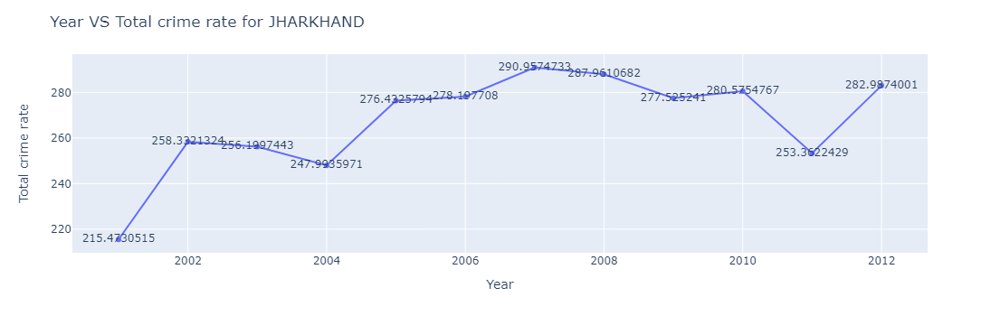

In [54]:
fig = px.line(df.loc[df['State/UT'] == states[15]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[15]}')
fig.show()

##### In Jharkhand from the year 2005 to 2012 there is constant crime rate is about 282.987

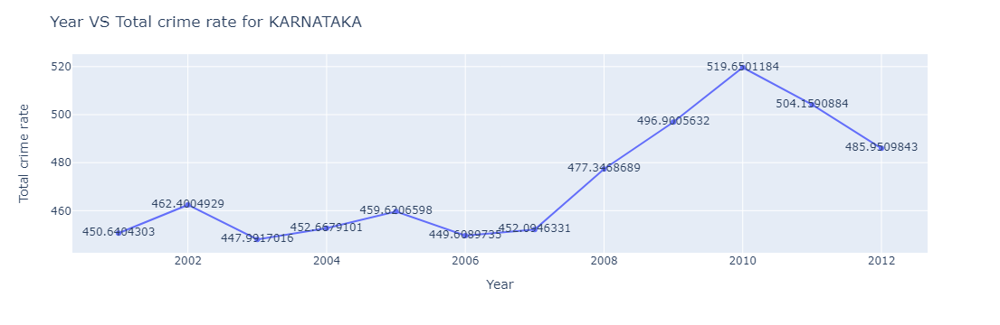

In [53]:
fig = px.line(df.loc[df['State/UT'] == states[16]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[16]}')
fig.show()

##### So we can see that from the year 2007(452.094) there is a continuously increase in crime rate till 2010(519.65) then it decreases till 2012(485.95)

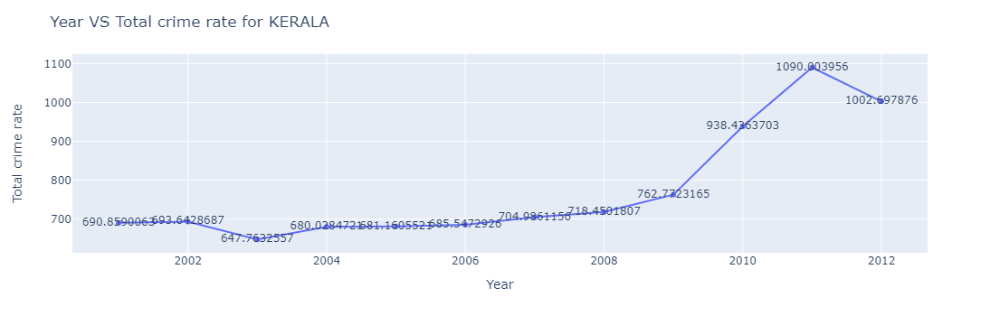

In [52]:
fig = px.line(df.loc[df['State/UT'] == states[17]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[17]}')
fig.show()

##### In Kerala in the year 2001 there is 690.85 crime rate but then it continously increases till 2011(1090.003)

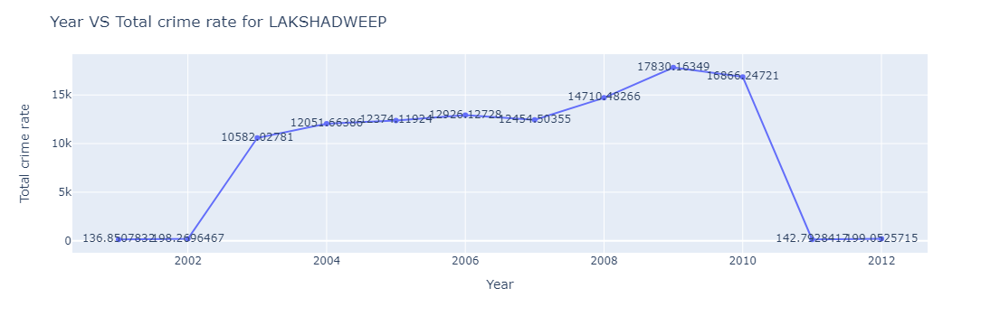

In [51]:
fig = px.line(df.loc[df['State/UT'] == states[18]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[18]}')
fig.show()

##### In the year 2001 crime rate was 136.85 but then there is a huge steep in crime rate till 2010(17830.16) then it decreases at the year 2011(142.79)

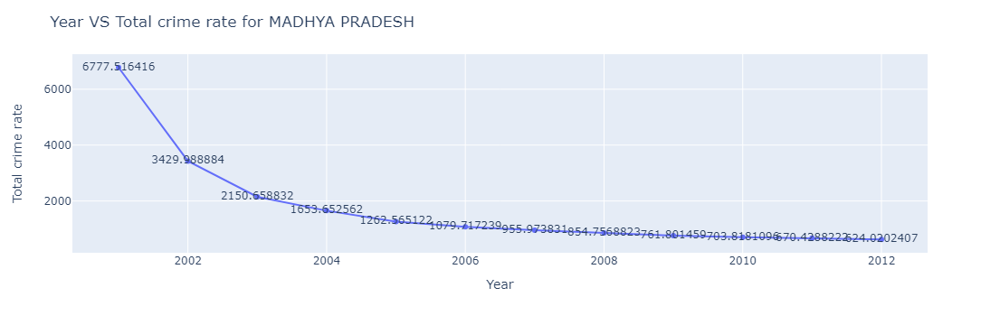

In [50]:
fig = px.line(df.loc[df['State/UT'] == states[19]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[19]}')
fig.show()

##### In Madhya Pradesh in the year 2001 there is a huge crime rate around 6777.516 but after that it continously decreases till 2012 now the crime rate is about 624

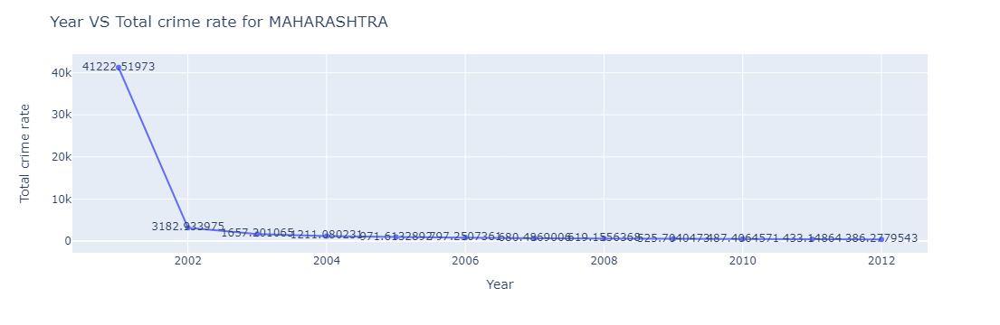

In [70]:
fig = px.line(df.loc[df['State/UT'] == states[20]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[20]}')
fig.show()

##### Here in the year 2001 crime rate was 41222.519 that was huge. then there was sudden decrease in the year 2002(3182.93) then it remains constant upto 2012(386.277)

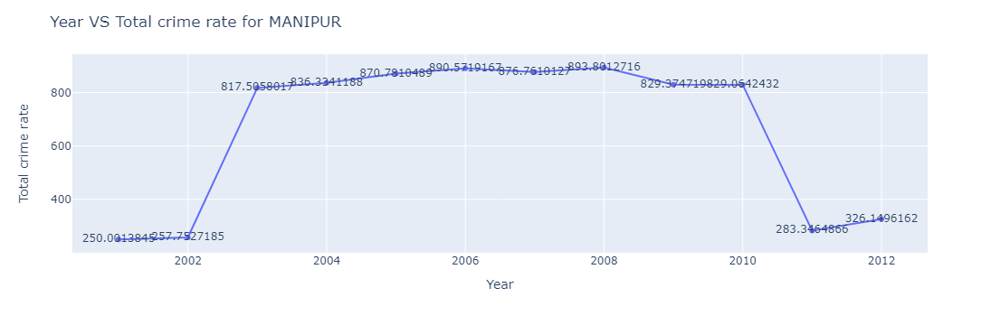

In [71]:
fig = px.line(df.loc[df['State/UT'] == states[21]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[21]}')
fig.show()

##### In the year 2002 crime rate was 257.75 then it increases in the year 2003(817.505) then there is a constant movement of crime rate till 2010 then it decreases in the year 2011(283.34)

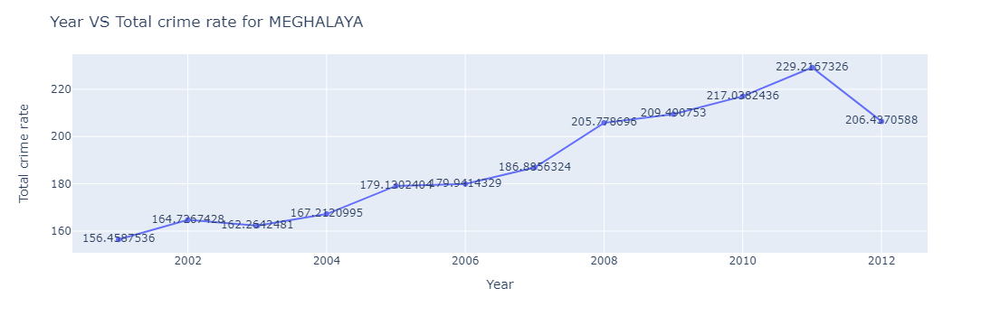

In [72]:
fig = px.line(df.loc[df['State/UT'] == states[22]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[22]}')
fig.show()

##### In Meghalaya crime rate is increased since 2001(156.45) upto 2012(206.43)

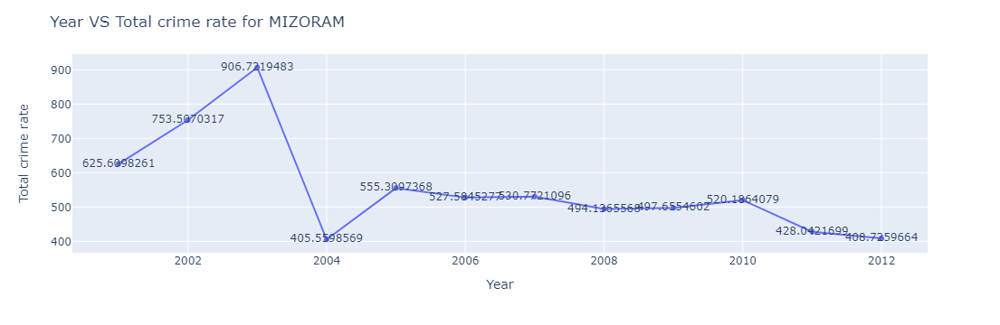

In [73]:
fig = px.line(df.loc[df['State/UT'] == states[23]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[23]}')
fig.show()

##### In 2003 crime rate was 906.72 but now in the year 2012 it is 408.72

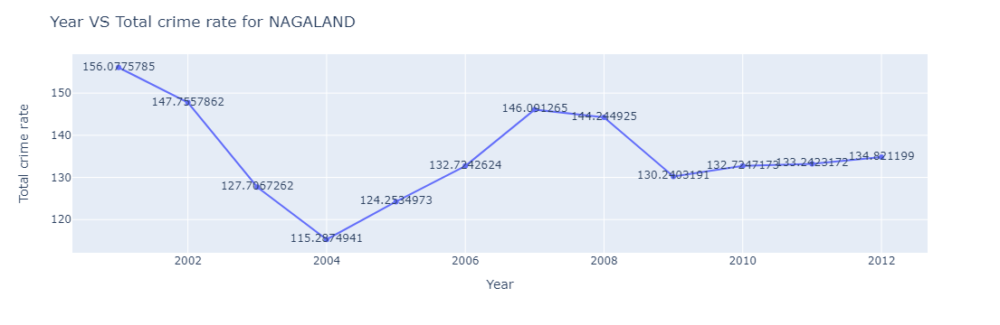

In [74]:
fig = px.line(df.loc[df['State/UT'] == states[24]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[24]}')
fig.show()

##### Here crime rate is 156.077 in the year 2001 but in the year 2004 it decreases at 115 and now in 2012 it is 134.86

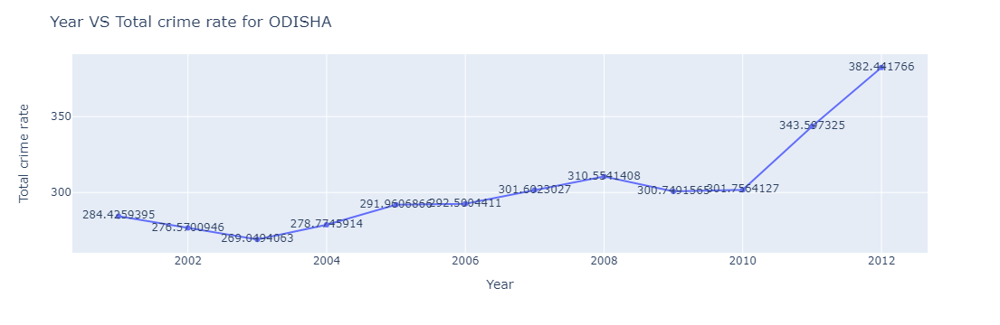

In [75]:
fig = px.line(df.loc[df['State/UT'] == states[25]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[25]}')
fig.show()

##### In Odisha crime rate is continuously increases since 2001(284.42) to 2012(382.44)

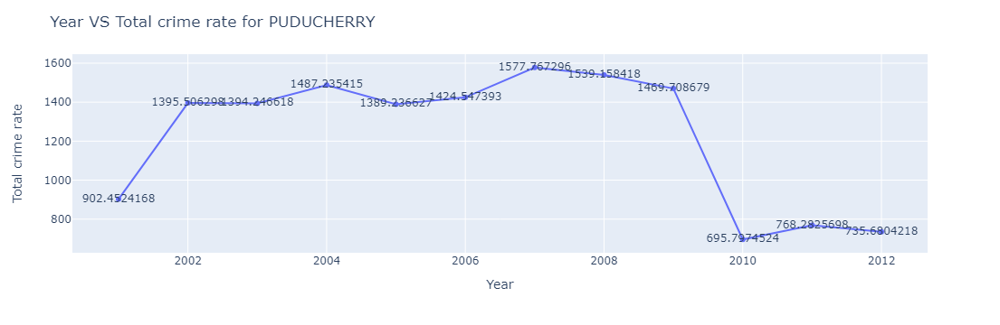

In [76]:
fig = px.line(df.loc[df['State/UT'] == states[26]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[26]}')
fig.show()

##### Here maximum crime rate is 1577.76 in the year 2007 and now in 2012 it is 735.68

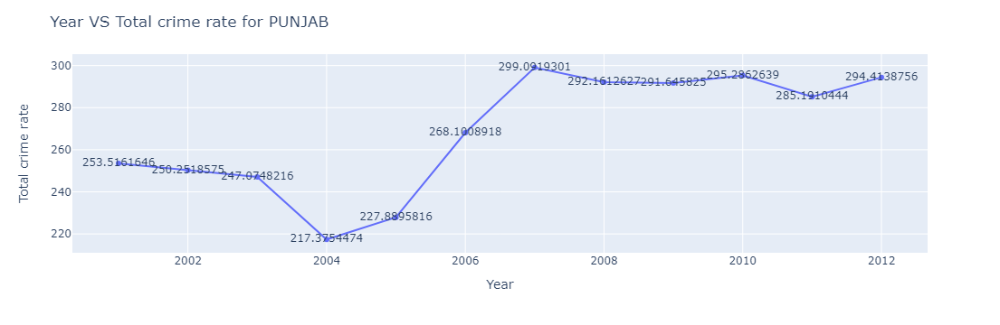

In [77]:
fig = px.line(df.loc[df['State/UT'] == states[27]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[27]}')
fig.show()

##### Here crime rate is very low but it continuously increases over the year. Now in 2012 it is 294.41

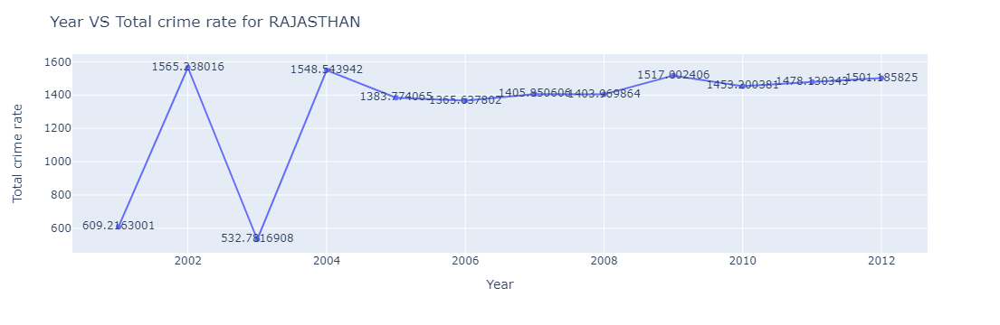

In [78]:
fig = px.line(df.loc[df['State/UT'] == states[28]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[28]}')
fig.show()

##### In Rajasthan in the year 2002 and 2004 crime rate is maximum about 1565 but in the year 2003 crime rate was 532.78 and in the year 2012 crime rate is around 1501

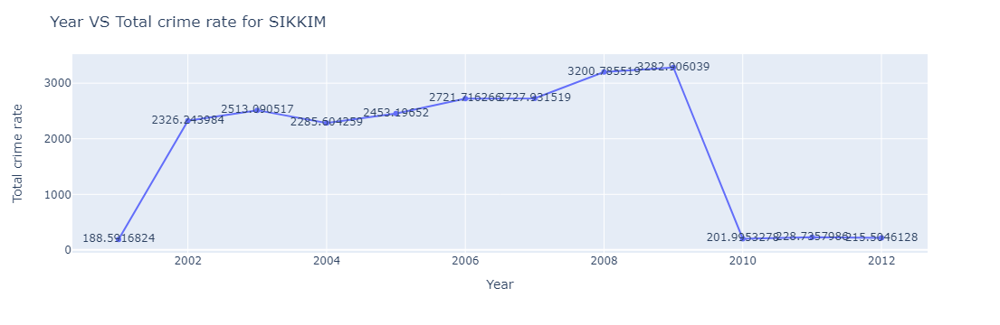

In [79]:
fig = px.line(df.loc[df['State/UT'] == states[29]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[29]}')
fig.show()

##### In Sikkim lowest crime rate was in 2001(188.59) then it increases over the year till 2009 then it decreases in the year 2010(201)

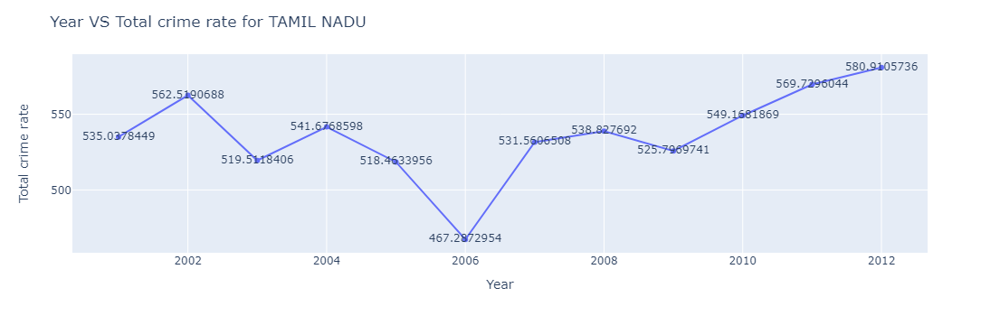

In [80]:
fig = px.line(df.loc[df['State/UT'] == states[30]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[30]}')
fig.show()

##### Here Lowest crime rate observed in the year 2006 and then it increases till 2012(580)

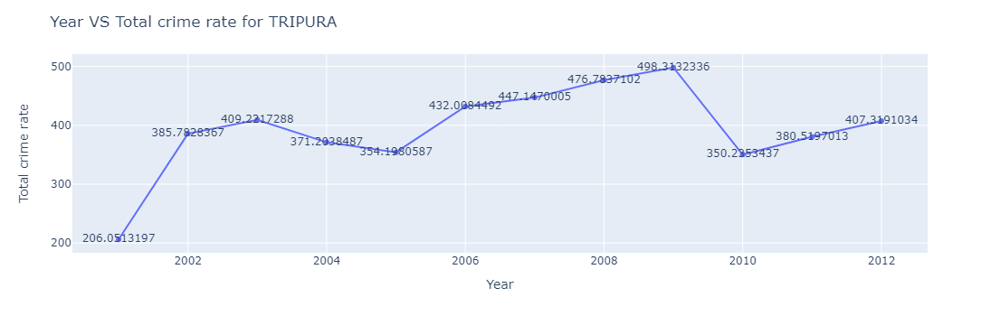

In [81]:
fig = px.line(df.loc[df['State/UT'] == states[31]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[31]}')
fig.show()

##### Here Lowest crime rate was observed in the year 2001(206.05) and highest observed in 2009(498.31)

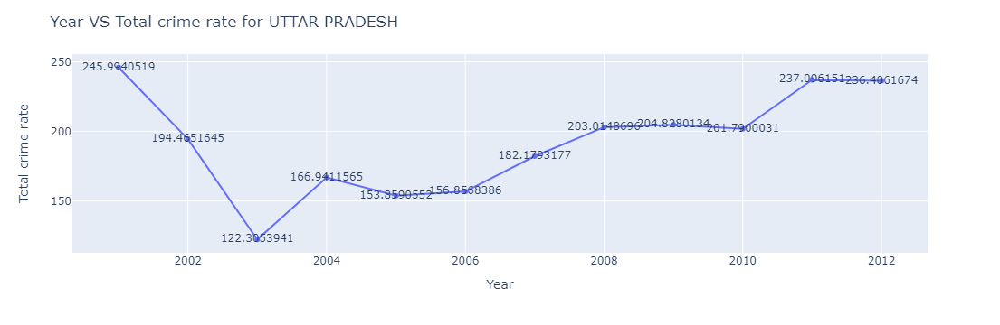

In [82]:
fig = px.line(df.loc[df['State/UT'] == states[32]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[32]}')
fig.show()

##### Here we can see that in between the years from 2001 to 2012 there are some ups and down of crime rate but now in 2012 crime rate is almost same as in the year 2001(245)

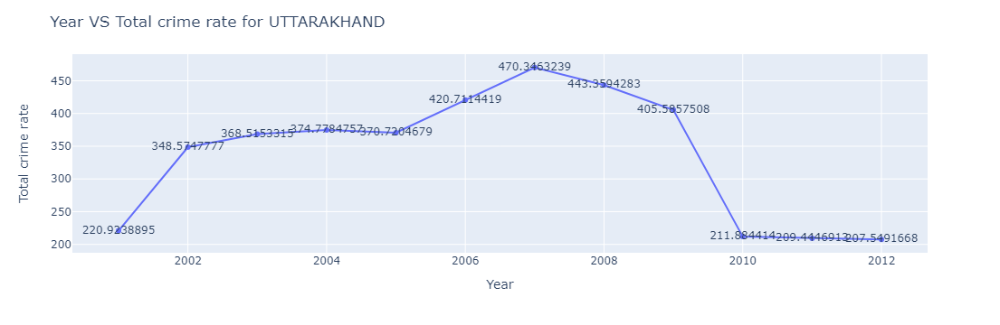

In [83]:
fig = px.line(df.loc[df['State/UT'] == states[33]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[33]}')
fig.show()

##### Here highest crime rate was observed in the year 2007(470.34) then it decreases till 2012(207.54)

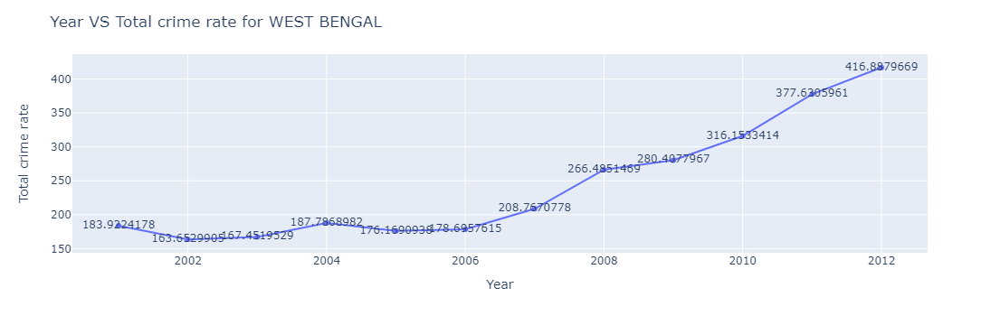

In [84]:
fig = px.line(df.loc[df['State/UT'] == states[34]], x='Year', y='Total crime rate', markers=True,text='Total crime rate')
fig.update_layout(title=f'Year VS Total crime rate for {states[34]}')
fig.show()

##### Here in West Bengal crime rate is continously increases from the year 2001(183.92) now in 2012 it becomes 416.88

# 2.4	 (Analysis of area vs overall crime)

##### Using groupby to match overall crime rate for all the states 

In [51]:
total_crime_rate = df.groupby('State/UT').agg({'Total crime rate': 'sum', 'Area in km2': 'first'})
print(total_crime_rate.sort_values('Total crime rate',ascending=False))

                   Total crime rate  Area in km2
State/UT                                        
LAKSHADWEEP           110472.300943           32
MAHARASHTRA            52174.778662       307713
A& N ISLANDS           45965.541078         8249
SIKKIM                 22346.302045         7096
MADHYA PRADESH         20924.898400       308245
ARUNACHAL PRADESH      19285.688885        83743
CHANDIGARH             16316.910098          114
RAJASTHAN              15764.531241       342239
PUDUCHERRY             14779.619605          479
D & N HAVELI           14731.988855          491
DELHI                  10191.681454        16579
KERALA                  9296.348263        38863
MANIPUR                 7961.444338        22327
GOA                     7856.416957         3702
MIZORAM                 6653.811598        21081
TAMIL NADU              6440.489987       130058
HARYANA                 6036.884825        44212
HIMACHAL PRADESH        5679.625774        55673
KARNATAKA           

##### So even though we can see that Lakshadweep has very less area about 32 km2 but the crime rate is very high and Nagaland has very less crime rate with area is 1483 km2

#### Ploting barplot for Total Crime Rate for Each State in India with respect to area

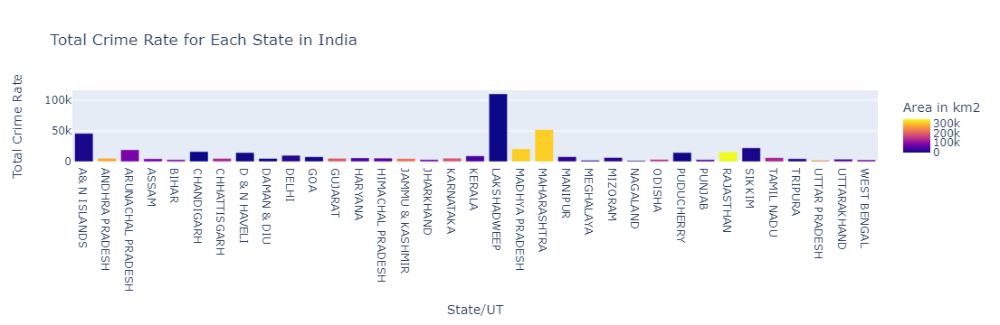

In [45]:
total_crime_rate = df.groupby(['State/UT', 'Area in km2'])['Total crime rate'].sum().reset_index()

fig = px.bar(total_crime_rate, x='State/UT', y='Total crime rate', color='Area in km2', labels={'State/UT':'State/UT', 'Total crime rate':'Total Crime Rate'}, title='Total Crime Rate for Each State in India')
fig.show()

##### So Here we can see that Lakshadweep and A & N Islands has very high crime rate even though area is less. Because crime rate is inversely proportional with the population. Maharashtra has second highest crime rate with area 307713 km2

#### Total sum of total crimes from the year 2001 to 2012 for each state 

In [37]:
df_total_crime= df[(df['Year'] >= 2001) & (df['Year'] <= 2012)]
total_crimes = df_total_crime.groupby('State/UT')['Total crimes'].sum()
print(total_crimes.sort_values(ascending=False))


State/UT
RAJASTHAN            10051781
MAHARASHTRA           5361919
MADHYA PRADESH        5314100
ANDHRA PRADESH        4506098
TAMIL NADU            4368016
UTTAR PRADESH         4275418
KARNATAKA             3254934
GUJARAT               3058474
BIHAR                 3052975
KERALA                3046552
WEST BENGAL           2559176
DELHI                 1571711
ODISHA                1445623
HARYANA               1427663
ASSAM                 1364290
CHHATTISGARH          1241552
JHARKHAND              973242
PUNJAB                 846966
JAMMU & KASHMIR        574750
UTTARAKHAND            378606
HIMACHAL PRADESH       369750
ARUNACHAL PRADESH      242296
MANIPUR                197133
A& N ISLANDS           170660
PUDUCHERRY             164361
TRIPURA                163863
CHANDIGARH             161003
SIKKIM                 128155
GOA                    110990
LAKSHADWEEP             69448
MIZORAM                 65749
MEGHALAYA               61132
D & N HAVELI            42065
N

##### So we can see that total crimes from the year 2001 to 2012 is maximum in the state Rajasthan is around 10051781 and Daman & Diu has the lowest no of total crimes around 10343 cases

#### Ploting barplot for Total Crimes for Each State in India with respect to area

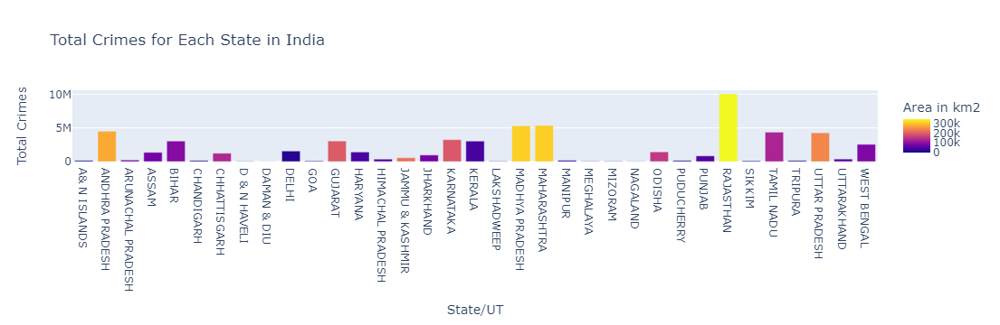

In [73]:
total_crime= df.groupby(['State/UT', 'Area in km2'])['Total crimes'].sum().reset_index()

fig = px.bar(total_crime, x='State/UT', y='Total crimes', color='Area in km2', labels={'State/UT':'State/UT', 'Total crimes':'Total Crimes'}, title='Total Crimes for Each State in India')
fig.show()

##### So here we can see that Rajasthan has the highest crimes around 10.05178M with area 342239 and Daman & Diu has the lowest crimes in India from 2001 to 2012

# 2.5	 (Analysis of Population vs overall Crime)

#### Let's check the total crimes for each state from the year 2001 to 2012

In [118]:
total_crimes = df.groupby('State/UT')['Total crimes'].sum()
print(total_crimes.sort_values(ascending=False))

State/UT
RAJASTHAN            10051781
MAHARASHTRA           5361919
MADHYA PRADESH        5314100
ANDHRA PRADESH        4506098
TAMIL NADU            4368016
UTTAR PRADESH         4275418
KARNATAKA             3254934
GUJARAT               3058474
BIHAR                 3052975
KERALA                3046552
WEST BENGAL           2559176
DELHI                 1571711
ODISHA                1445623
HARYANA               1427663
ASSAM                 1364290
CHHATTISGARH          1241552
JHARKHAND              973242
PUNJAB                 846966
JAMMU & KASHMIR        574750
UTTARAKHAND            378606
HIMACHAL PRADESH       369750
ARUNACHAL PRADESH      242296
MANIPUR                197133
A& N ISLANDS           170660
PUDUCHERRY             164361
TRIPURA                163863
CHANDIGARH             161003
SIKKIM                 128155
GOA                    110990
LAKSHADWEEP             69448
MIZORAM                 65749
MEGHALAYA               61132
D & N HAVELI            42065
N

In [57]:
states = df['State/UT'].unique()

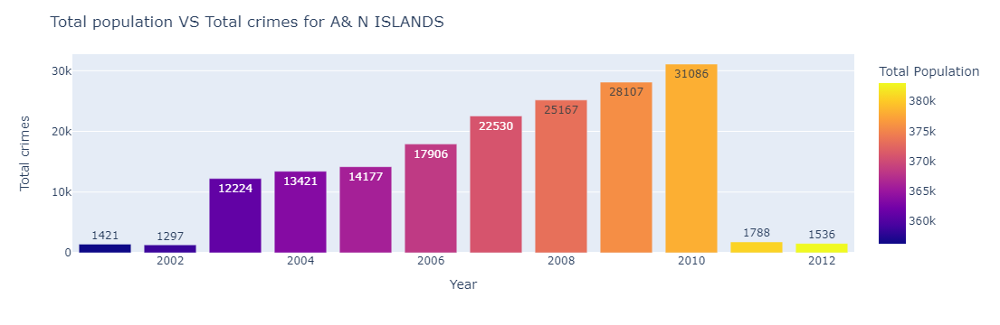

In [70]:
fig = px.bar(df.loc[df['State/UT']  == states[0]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[0]}')
fig.show()


##### So For A&N Islands Total crimes was increases as the population increases from the year 2002(1297) to 2010(31086) then there is a sudden drop of total crimes at the year 2011(1788) and then for 2012 it is about 1536

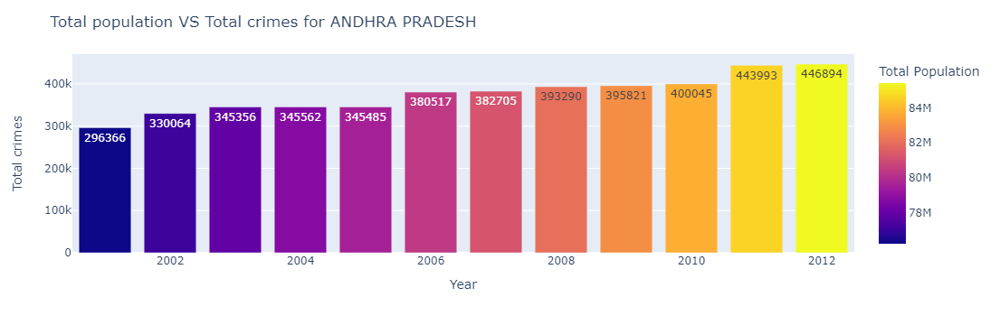

In [81]:
fig = px.bar(df.loc[df['State/UT']  == states[1]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[1]}')
fig.show()

##### In Andhra Pradesh Total crimes is increases as the polpulation is increases from the year 2001(296366) to 2012(446894).

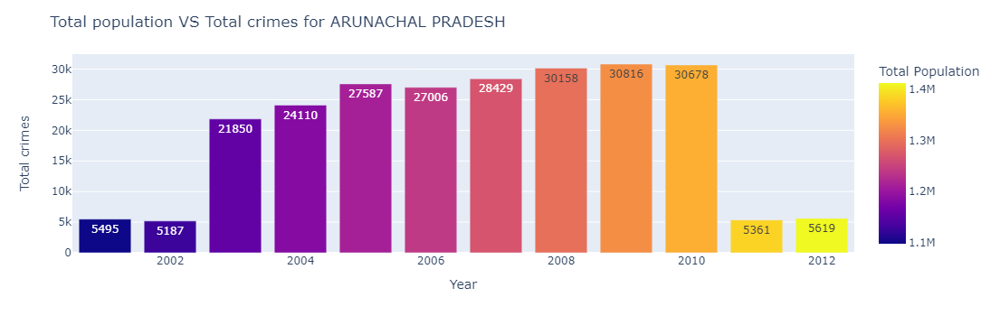

In [82]:
fig = px.bar(df.loc[df['State/UT']  == states[2]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[2]}')
fig.show()

##### In Arunachal Pradesh Total crimes is increases upto 5 times at the year 2003 than 2002 then it continously increases upto 2010 then there is a sudden drop in total crimes of about 5361 when the population is 1382611 at the year 2011

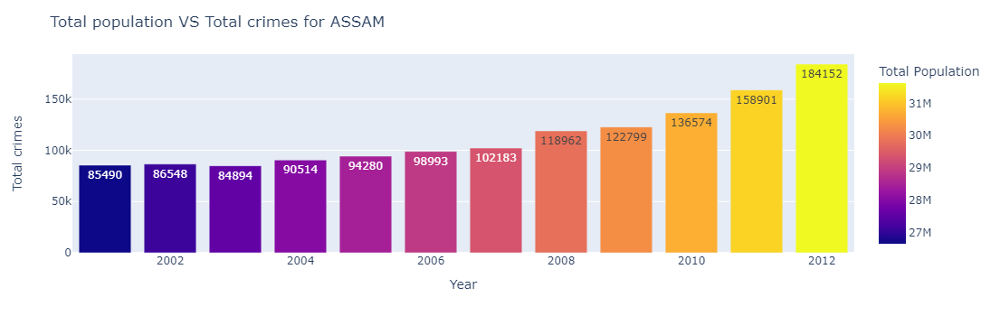

In [83]:
fig = px.bar(df.loc[df['State/UT']  == states[3]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[3]}')
fig.show()

##### For Assam as the population is increases total crimes is also increases from the year 2001(85490) to 2012(184152)

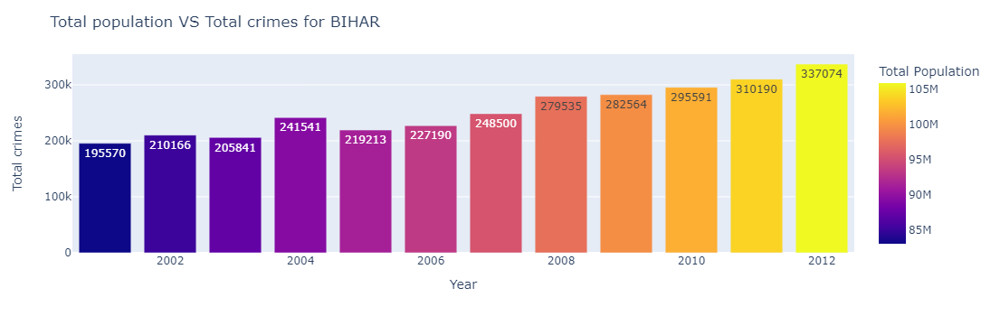

In [84]:
fig = px.bar(df.loc[df['State/UT']  == states[4]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[4]}')
fig.show()

##### For Bihar as the population is increases total crimes is also increases from the year 2001(195570) to 2012(337074)

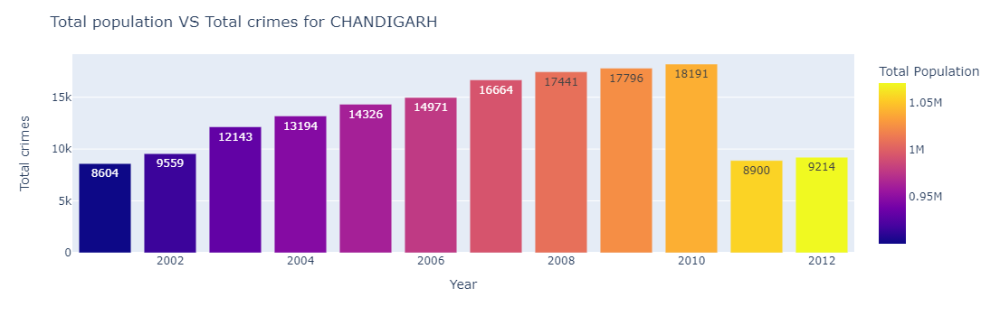

In [85]:
fig = px.bar(df.loc[df['State/UT']  == states[5]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[5]}')
fig.show()

##### In Chandigarh total crimes was increases from the year 2001(8604) to 2010(18191) as the population increases and then it decreases in year 2011(8900)

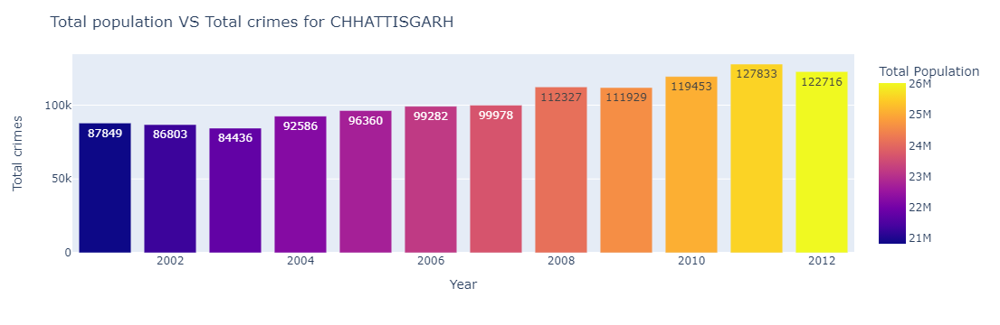

In [86]:
fig = px.bar(df.loc[df['State/UT']  == states[6]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[6]}')
fig.show()

##### For CHHATTISGARH as the population is increases total crimes is also increases from the year 2001(87849) to 2011(127833)

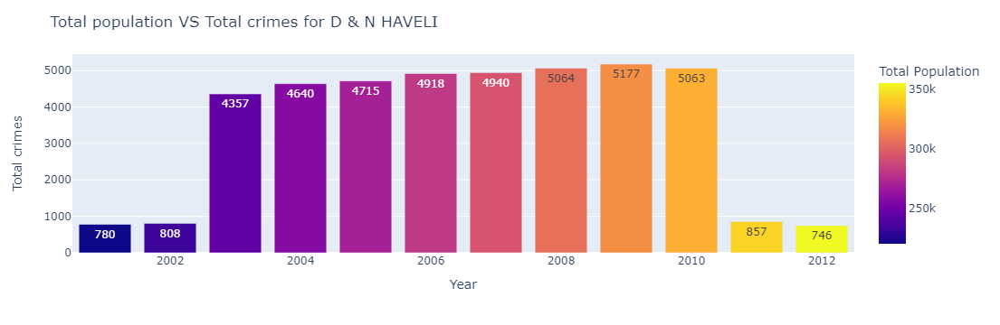

In [88]:
fig = px.bar(df.loc[df['State/UT']  == states[7]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[7]}')
fig.show()

##### For D&N Haveli at the year 2001 and 2002 total crimes around 780 and 808 respectively then it increases in the year 2003(4357) then it maintains a constant motion till 2010(5063) then there is a sudden drop in the year 2011(857) with the population 342853 and in year 2012 it is about 746 when the population 355089

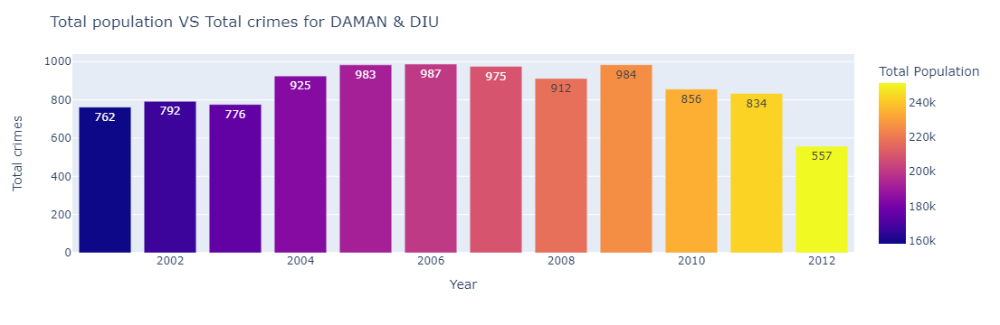

In [89]:
fig = px.bar(df.loc[df['State/UT']  == states[8]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[8]}')
fig.show()

##### Here total crimes was increases as the population increases but very less upto the year 2006 then it decreases at the year 2012(557)

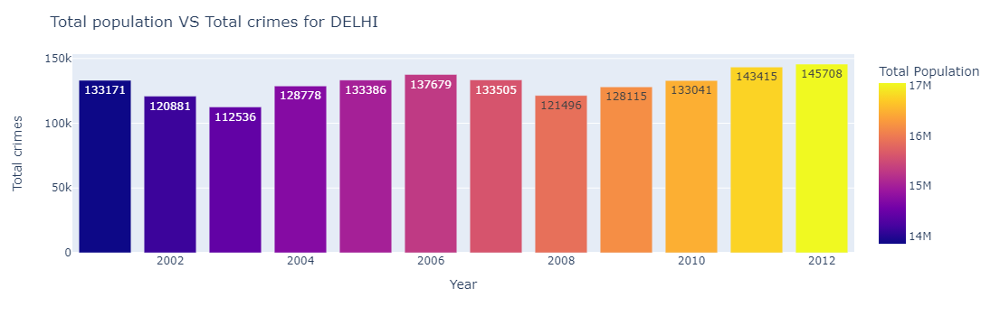

In [90]:
fig = px.bar(df.loc[df['State/UT']  == states[9]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[9]}')
fig.show()

##### For Delhi we can see that Total crime is almost constant for all the year a little bit fluctuation is there. In the year 2001 total crime is around 133171 and for the year 2012 it is about 145708 and it is maximum

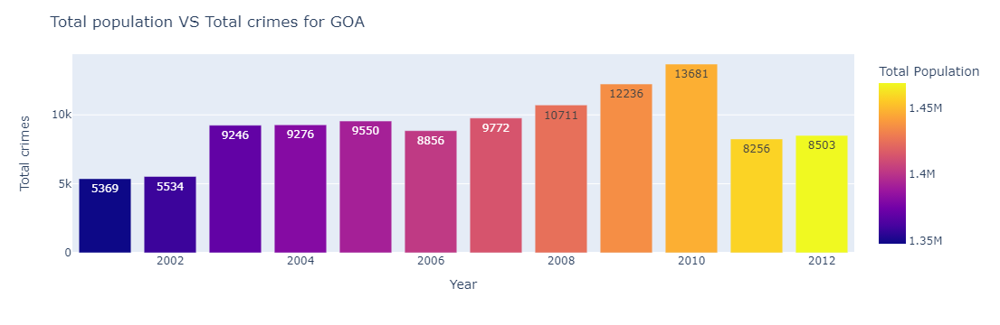

In [91]:
fig = px.bar(df.loc[df['State/UT']  == states[10]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[10]}')
fig.show()

##### In GOA highest Total crime observed in the year 2010 is about 13681 then it decreases in the year 2011 and 2012. Lowest total crime observed in the year 2001(5369)

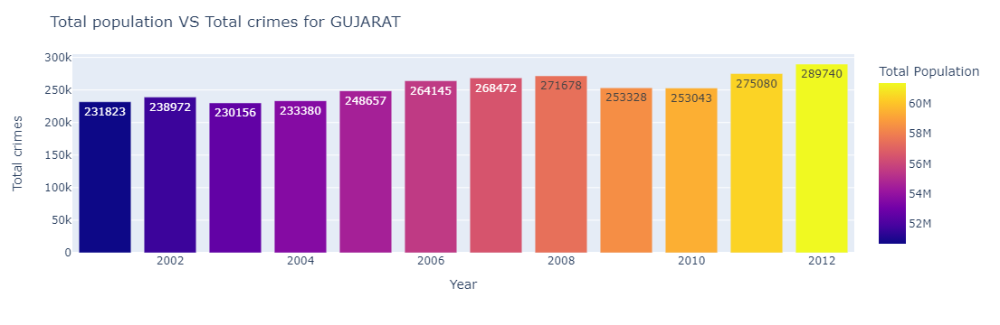

In [92]:
fig = px.bar(df.loc[df['State/UT']  == states[11]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[11]}')
fig.show()

##### For Gujarat total crime is maximum in the year 2012(289740) when the population is 61354889 and the lowest in the year 2001(231823) when the population is 50671017. So total crime increases as the population increases 

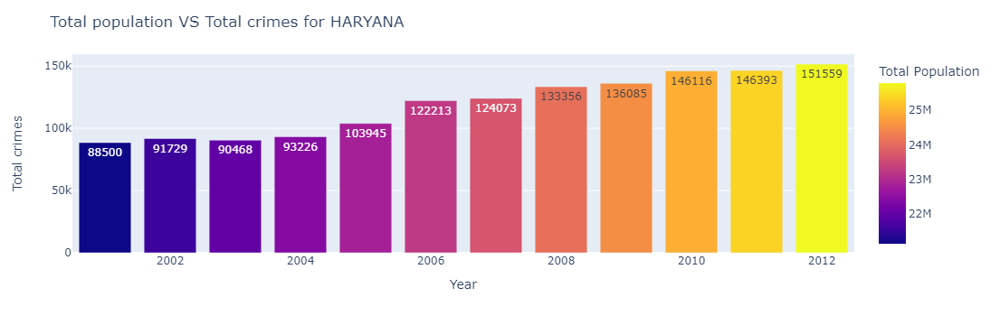

In [93]:
fig = px.bar(df.loc[df['State/UT']  == states[12]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[12]}')
fig.show()

##### In Haryana the lowest Total crime is 88500 in the year 2001 when the population is 21144564 and the highest Total crime is observed in the year 2012 is 151559 when the population is 25773933. So we can see that as the population is increases total crime is also increases 

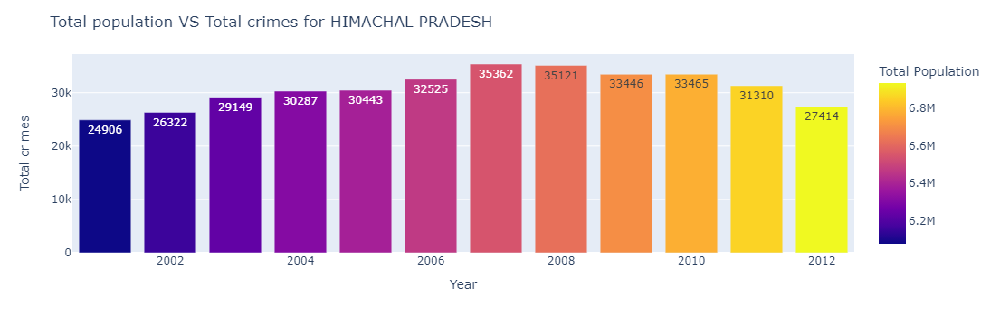

In [94]:
fig = px.bar(df.loc[df['State/UT']  == states[13]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[13]}')
fig.show()

##### Here in Himachal Pradesh we can see that in the year 2007 total crime is the highest around 35362 then it start decreasing till 2012(27414). At the start it starts increasing from 2001 to 2007 from 24906 to 26322

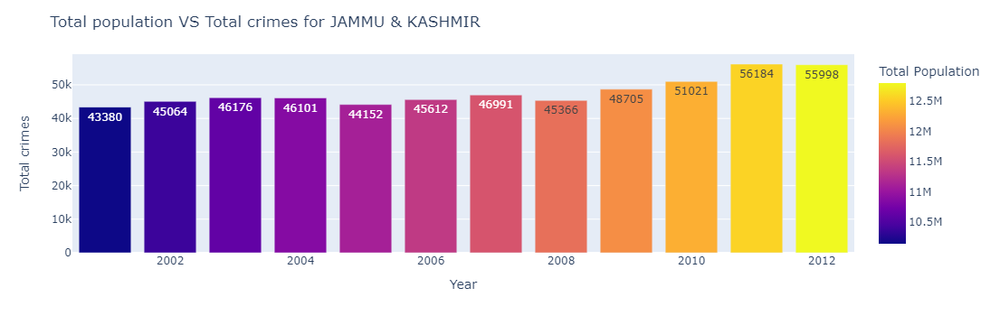

In [95]:
fig = px.bar(df.loc[df['State/UT']  == states[14]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[14]}')
fig.show()

##### For Jammu and Kashmir total crime is almost constant from the year 2001(43380) to 2008(45366) then it starts increasing as the population increases till 2012(55998)

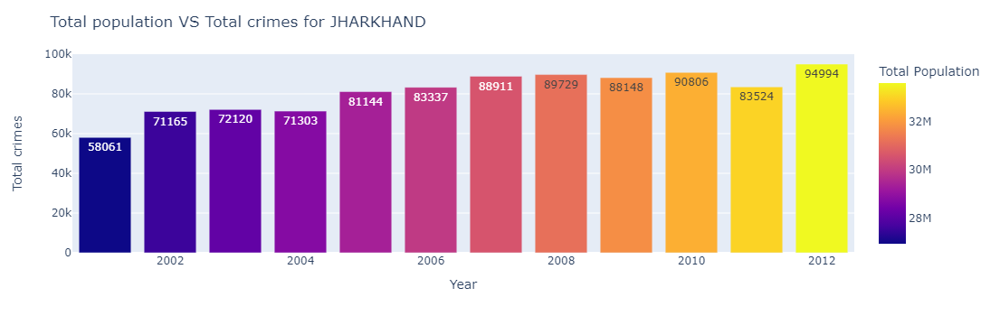

In [96]:
fig = px.bar(df.loc[df['State/UT']  == states[15]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[15]}')
fig.show()

##### Here we can see that as the population increases total crimes is also increases. Lowest crimes in 2001 its about 58061 and now in 2012 its about 94994

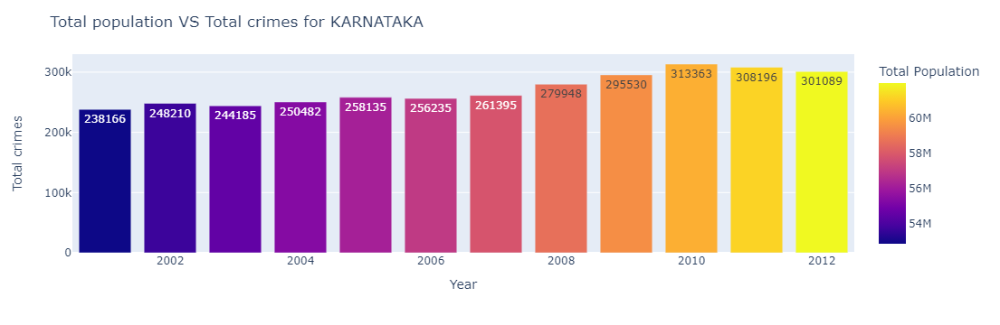

In [97]:
fig = px.bar(df.loc[df['State/UT']  == states[16]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[16]}')
fig.show()

##### For Karnataka total crimes is increases as the population increases In 2001 total crimes was 238166 and in 2012 its about 301089

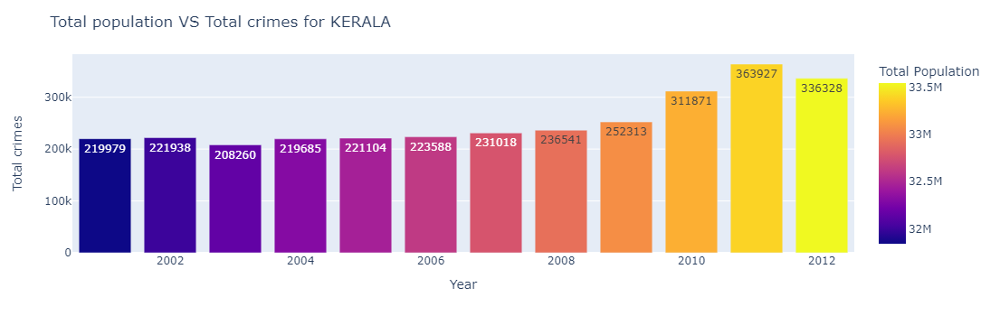

In [98]:
fig = px.bar(df.loc[df['State/UT']  == states[17]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[17]}')
fig.show()

##### In Kerala Total crimes is almost constant from the year 2001(219979) to 2008(236541) then it starts increases for the rest years

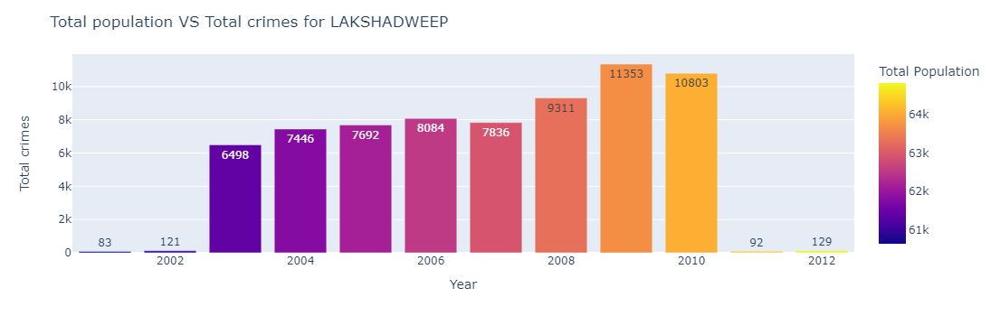

In [99]:
fig = px.bar(df.loc[df['State/UT']  == states[18]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[18]}')
fig.show()

##### The Lowest total crimes observed in the year 2001 its about 83 with population 60650 and the maximum crimes observed in the year 2009 which is about 11353 with population 63673 and then there is a sudden decrease in crimes in the year 2011 which is about 90 with the population 64429

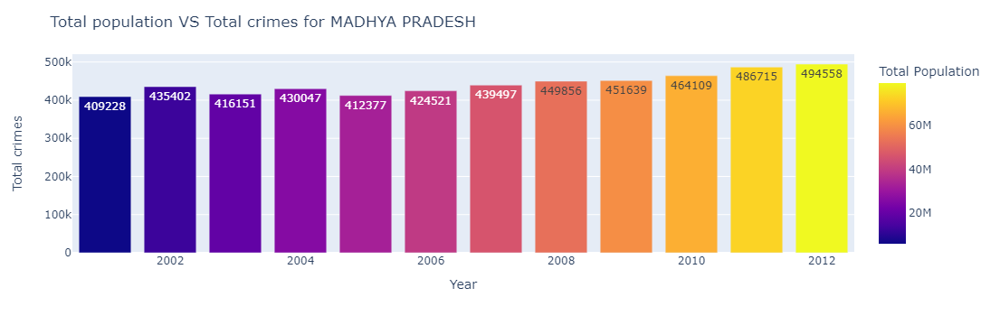

In [100]:
fig = px.bar(df.loc[df['State/UT']  == states[19]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[19]}')
fig.show()

##### In Madhya Pradesh we can see that as the population increases crimes is also increases. Lowest crime observed in the year 2001(409228) and the highest observed in the year 2012 which is about 494558

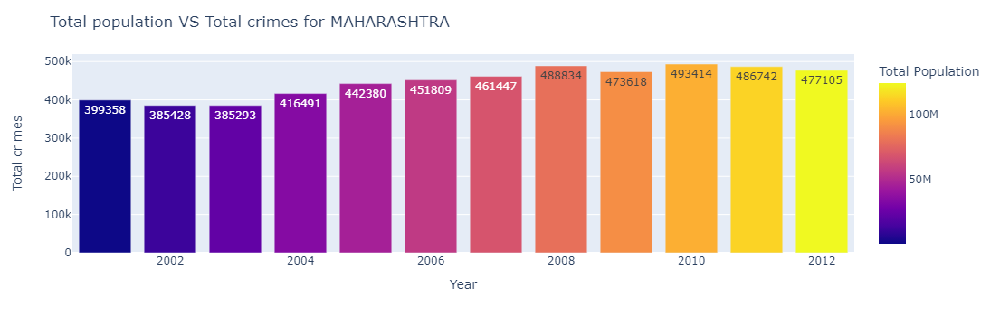

In [101]:
fig = px.bar(df.loc[df['State/UT']  == states[20]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[20]}')
fig.show()

##### In Maharashtra we can see that crime is also increases as the population increases. Lowest crime observed in the year 2001(399358) and the highest in 2010(493414)

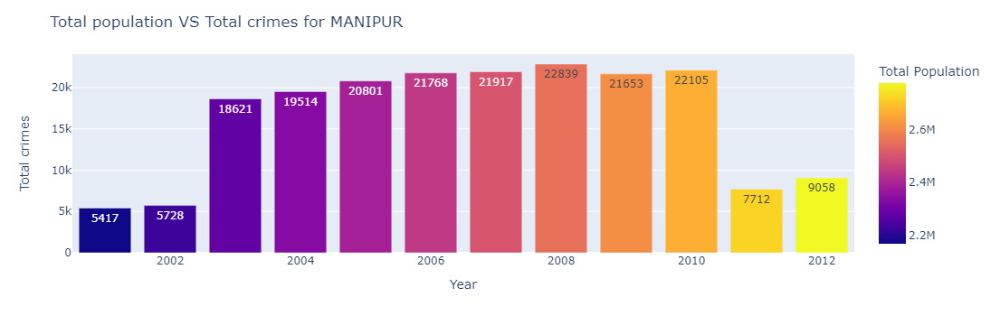

In [102]:
fig = px.bar(df.loc[df['State/UT']  == states[21]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[21]}')
fig.show()

##### Lowest Crime is observed in the year 2001(5417) then in the year 2003 there is a sudden increase in total crimes and it is about 18621 then it almost constant till 2010(22105) then there is a sudden drop in crimes in the year 2011(7712)

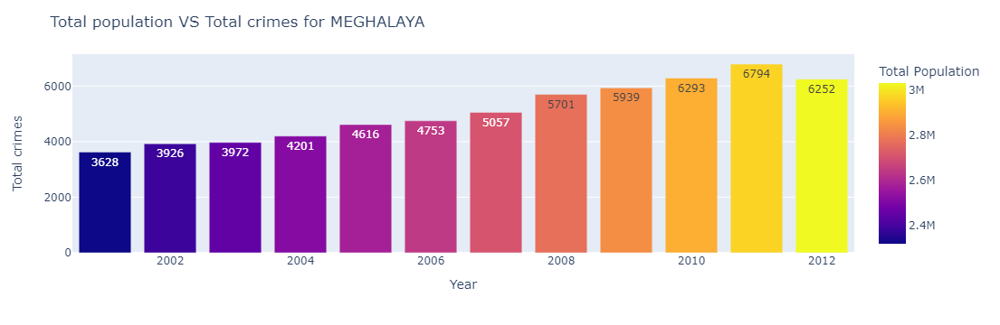

In [103]:
fig = px.bar(df.loc[df['State/UT']  == states[22]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[22]}')
fig.show()

##### In Meghalaya total crime increases as the as the population increases.In the year 2001 there is total crime of 3628 when the population is 2318822 and In 2012 total crime is 6252 when the population is 3028526

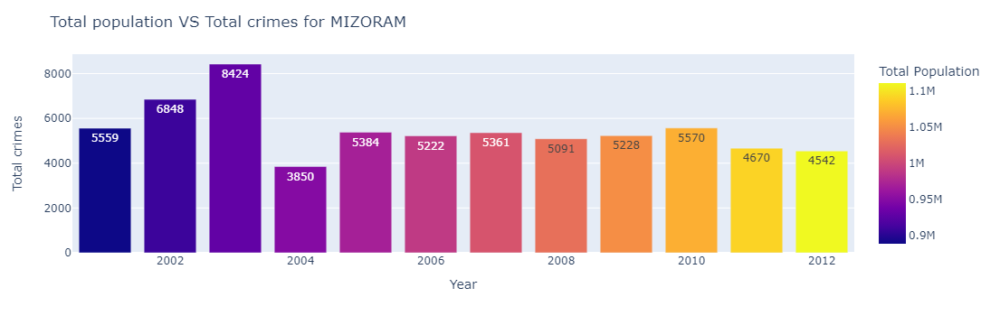

In [104]:
fig = px.bar(df.loc[df['State/UT']  == states[23]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[23]}')
fig.show()

##### In Mizoram highest total crime observed in the year 2003(8424) with population 888573 and in 2012 total crime is 4525 when the population is 1111258. So here total crime is almost constant from 2004 to 2012

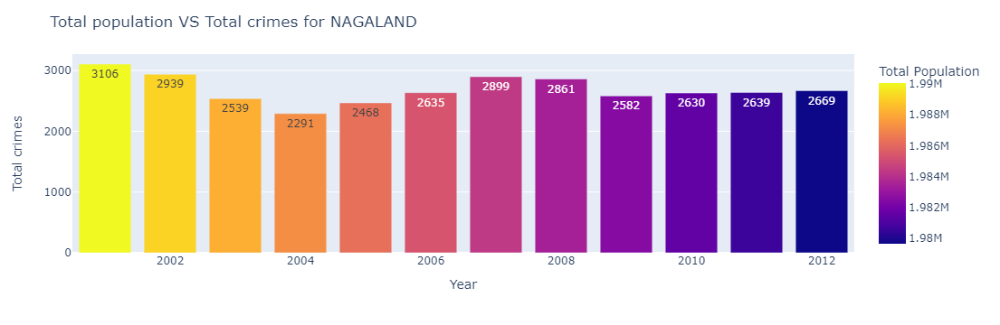

In [105]:
fig = px.bar(df.loc[df['State/UT']  == states[24]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[24]}')
fig.show()

##### So In Nagaland population is decreases over the year.That's mean In 2001 there is highest population of around 1990036 and that time total crime is around 3106  and In the year 2012 when the Population is 1979659 that time total crime is around 2669. So here also we can say that as the population is increases total crime also increases

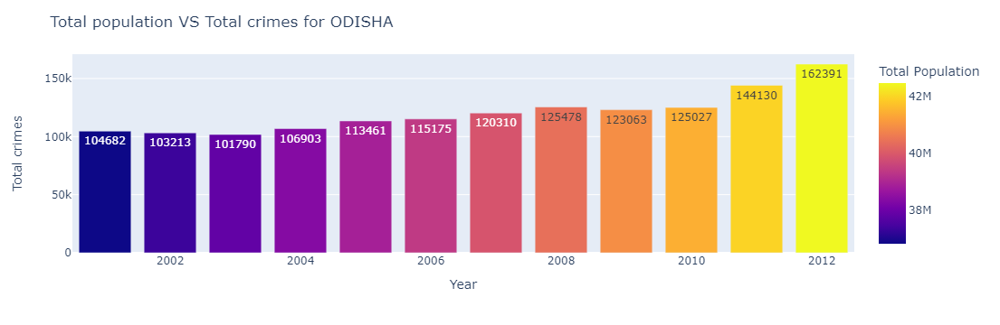

In [106]:
fig = px.bar(df.loc[df['State/UT']  == states[25]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[25]}')
fig.show()

##### Here also total crime is directly proportional to the population as we can see from the year 2001 when the population is around 36804660 total crime is 104682 and In the year 2012 when the population is 42461628 total crime is 162391

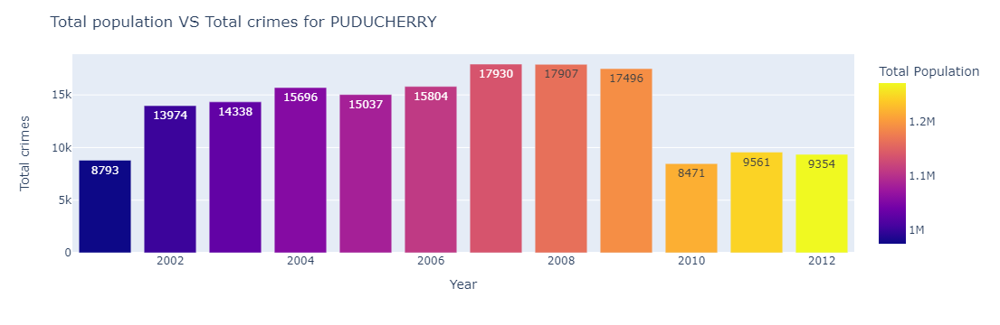

In [107]:
fig = px.bar(df.loc[df['State/UT']  == states[26]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[26]}')
fig.show()

##### Here in PUDUCHERRY total crime increases from the year 2001(8793) to 2009(17496) then there is a sudden drop in total crime around 2 times in the year 2010 then it remains constant till 2012

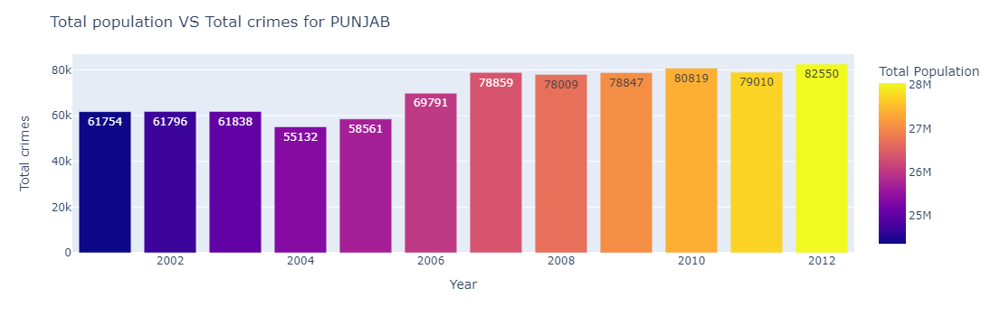

In [108]:
fig = px.bar(df.loc[df['State/UT']  == states[27]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[27]}')
fig.show()

##### here also as the population increases total crime is also increases 

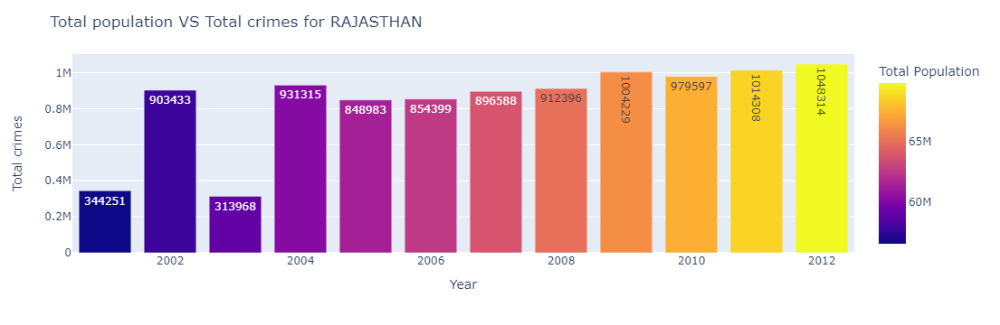

In [109]:
fig = px.bar(df.loc[df['State/UT']  == states[28]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[28]}')
fig.show()

##### In Rajasthan we can see that in the year 2002 total crime is around 903433 which is almost 3 times than for the year 2001(344251) and 2003(313968) then from 2004(931315) it continuously increases till 2012 when the population is around 69832394 and total crime is 1048314

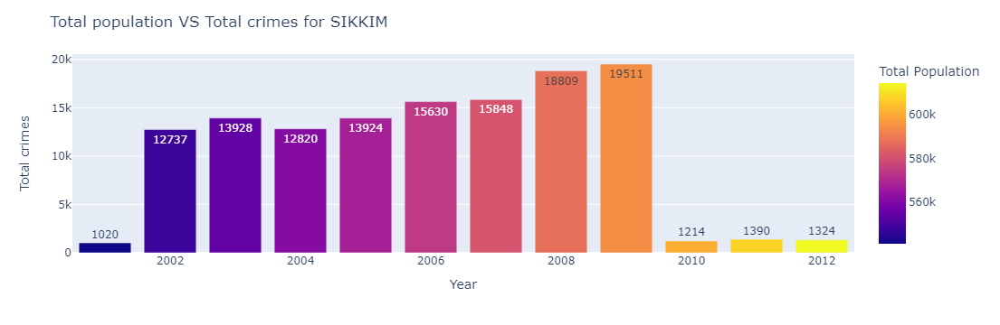

In [110]:
fig = px.bar(df.loc[df['State/UT']  == states[29]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[29]}')
fig.show()

##### In Sikkim lowest crime was observed in the year 2001 when total crime is 1020 and population is 540851 and the Highest observed in the year 2009 when the population is 594321 and total crime is 19511 then it drop in the year 2010 with total crime 1214 when the population is 601004 then almost constant for the rest years 

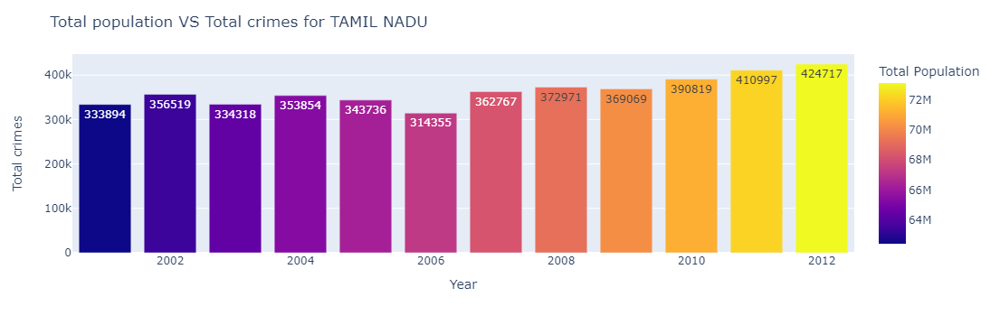

In [111]:
fig = px.bar(df.loc[df['State/UT']  == states[30]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[30]}')
fig.show()

##### For Tamil Nadu also total crime increases as the population increases for year 2001 total crime is 333894 when the population is 62405679 and in 2012 total crime is 424717 when the population is 73112286

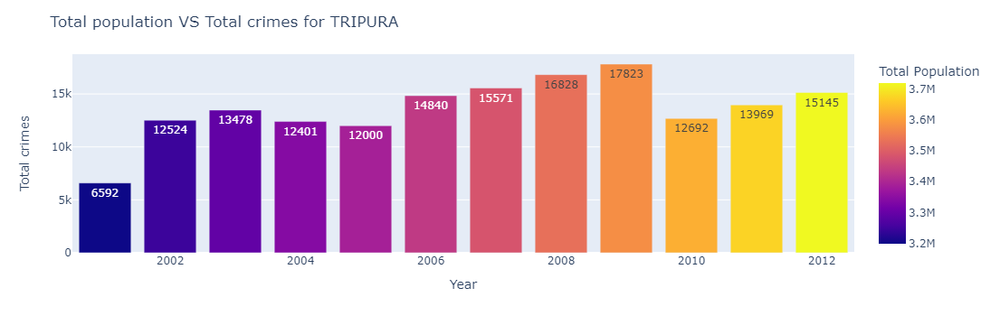

In [112]:
fig = px.bar(df.loc[df['State/UT']  == states[31]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[31]}')
fig.show()

##### Here also total crime increases as the population increases. From the year 2001 when the population is 3199203 total crime is 6592 and in 2012 when the population is 3718215 with total crime is 15145. But the peak observed in the year 2009(17823)

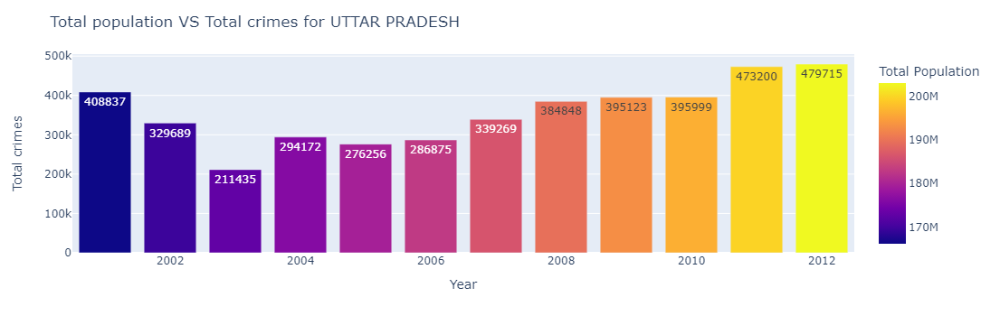

In [113]:
fig = px.bar(df.loc[df['State/UT']  == states[32]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[32]}')
fig.show()

##### here also first total crime decreases from the year 2001 to 2003 then it continuously increases till 2012. Highest crime observed in the year 2012 with total crime is 479715 and lowest observed in the year 2003 with total crime 211435

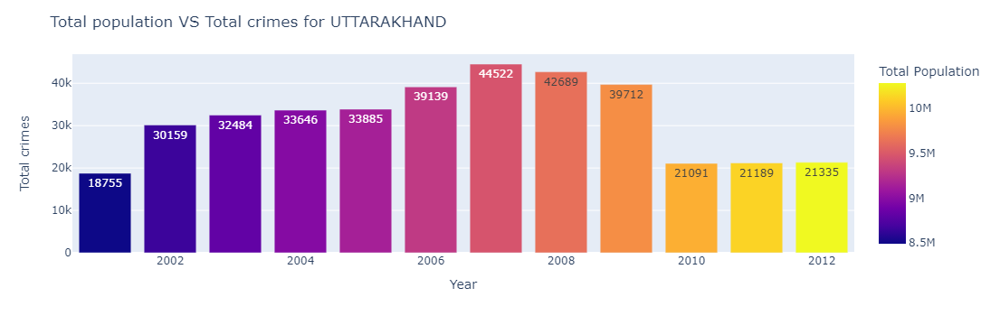

In [114]:
fig = px.bar(df.loc[df['State/UT']  == states[33]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[33]}')
fig.show()

##### In Uttarakhand first total crime is increase from the year 2001 till 2007 then it decreases till 2012

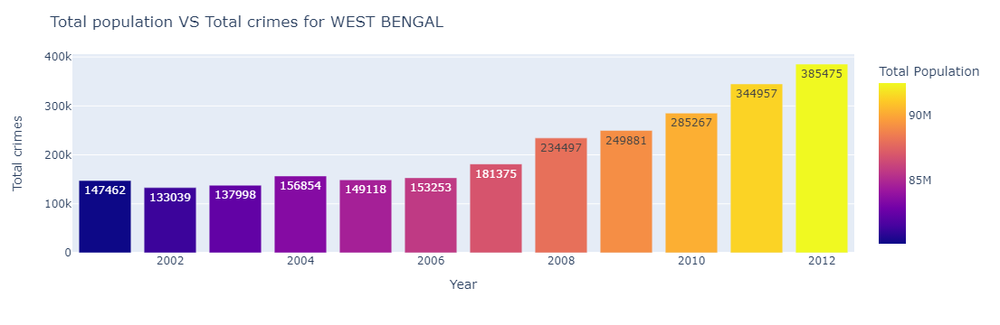

In [115]:
fig = px.bar(df.loc[df['State/UT']  == states[34]], x='Year', y='Total crimes', color='Total Population', text='Total crimes')
fig.update_layout(title=f'Total population VS Total crimes for {states[34]}')
fig.show()

##### In west bengal total crime is increases as population increases lowest observed in the year 2002 when population is 81293351 and total crime is 133039 then it increases till 2012 when the population is 92464890 and total crime is 385475

# 2.6	-- (Each state crime report. There is no fixed format to write a report, you can write a report inside the notebook itself based on what you have analyzed in the above points)

A&N ISLANDS -- So For A&N Islands Total crimes was increases as the population increases from the year 2002(1297) to 2010(31086) then there is a sudden drop of total crimes at the year 2011(1788) and then for 2012 it is about 1536. Here crime rate is increasing up to year 2010 with no of 8220.808276 but after that there is sudden huge drop at the year 2011 with no of 469.808 then it decreases.

ANDHRA PRADESH   -- In Andhra Pradesh Total crimes is increases as the population is increases from the year 2001(296366) to 2012(446894). Here crime rate is lowest at the year 2001 when the crime rate is 388.88 then it continuously increases up to 2012 when the crime rate is 524.933

ARUNACHAL PRADESH -- In Arunachal Pradesh Total crimes is increases up to 5 times at the year 2003 than 2002 then it continuously increases up to 2010 then there is a sudden drop in total crimes of about 5361 when the population is 1382611 at the year 2011. crime rate is lowest at 2001 with 500.469 then it increases almost 3.5 times at the year 2003 then it almost constant for up to 2010 then there is a sudden huge drop at the year 2011 with no 387.74

ASSAM -- For Assam as the population is increases total crimes is also increases from the year 2001(85490) to 2012(184152). Here crime rate is continuously increases from the year 2001 when the crime rate is 320.73 to 2012 and the crime rate is 582.37

BIHAR -- For Bihar as the population is increases total crimes is also increases from the year 2001(195570) to 2012(337074). Here is some ups and down of crime rate for the years(2003-2004-2005) then it continuously increases till 2012 and now crime rate is 318.33

CHANDIGARH -- In Chandigarh total crimes was increases from the year 2001(8604) to 2010(18191) as the population increases and then it decreases in year 2011(8900). Here crime rate starts from 955.325 at the year 2001 then it continuously increases till 2010 with no 1750.344 then it decreases at the year 2011 with no 843.85

CHHATTISGARH -- For CHHATTISGARH as the population is increases total crimes is also increases from the year 2001(87849) to 2011(127833). Here crime rate starts from 421.66 in the year 2001 then it decreases in the year 2003(387.764) then it continuously increases up to 2011(500.51) then rate decreases at the year 2012

D&N HAVELI -- For D&N Haveli at the year 2001 and 2002 total crimes around 780 and 808 respectively then it increases in the year 2003(4357) then it maintains a constant motion till 2010(5063) then there is a sudden drop in the year 2011(857) with the population 342853 and in year 2012 it is about 746 when the population 355089. In the year 2001 and 2002 rate is constant (353.75-347.18) then it increases in the year 2003(1778.63) then it almost constant till 2010 then it decreases in 2011

DAMAN & DIU -- Here total crimes was increases as the population increases but very less up to the year 2006 then it decreases at the year 2012(557). Here crime rate starts from 2001(481.65) then it continuously decreases till 2012(221.57)

DELHI -- For Delhi we can see that Total crime is almost constant for all the year a little bit fluctuation is there. In the year 2001 total crime is around 133171 and for the year 2012 it is about 145708 and it is maximum. Here in the year 2001 crime rate is 961.488 but over the years it improves and now in the year 2012 it becomes 854.917. In the year 2008 the rate is lowest is about 764.97

GOA -- In GOA highest Total crime observed in the year 2010 is about 13681 then it decreases in the year 2011 and 2012. Lowest total crime observed in the year 2001(5369). Here crime is continuously increases till 2010 but then it decreases in the year 2011(566.36)

GUJARAT -- For Gujarat total crime is maximum in the year 2012(289740) when the population is 61354889 and the lowest in the year 2001(231823) when the population is 50671017. So total crime increases as the population increases. Here at the year 2010 crime rate is the lowest around 425.90 and then it becomes 472.22 in the year 2012

HARYANA -- In Haryana the lowest Total crime is 88500 in the year 2001 when the population is 21144564 and the highest Total crime is observed in the year 2012 is 151559 when the population is 25773933. So we can see that as the population is increases total crime is also increases. Here crime rate is continuously increases from 2001(418.54) to 2012(588.032)

HIMACHAL PRADESH -- Here in Himachal Pradesh we can see that in the year 2007 total crime is the highest around 35362 then it start decreasing till 2012(27414). At the start it starts increasing from 2001 to 2007 from 24906 to 26322. the highest crime rate in the year 2007(540.28) and then it continuously decreases till 2012(395.33)

JAMMU & KASHMIR -- For Jammu and Kashmir total crime is almost constant from the year 2001(43380) to 2008(45366) then it starts increasing as the population increases till 2012(55998). Here from the year 2008 to 2011 there is sudden increase in crime rate is about 383.56-447.71 then somehow it decreases at 2012


JHARKHAND -- Here we can see that as the population increases total crimes is also increases. Lowest crimes in 2001 its about 58061 and now in 2012 its about 94994. In Jharkhand from the year 2005 to 2012 there is constant crime rate is about 282.987


KARNATAKA -- For Karnataka total crimes is increases as the population increases In 2001 total crimes was 238166 and in 2012 its about 301089. In the year 2007(452.094) there is a continuously increase in crime rate till 2010(519.65) then it decreases till 2012(485.95)


KERALA -- In Kerala Total crimes is almost constant from the year 2001(219979) to 2008(236541) then it starts increases for the rest years. In Kerala in the year 2001 there is 690.85 crime rate but then it continuously increases till 2011(1090.003)


LAKSHADWEEP -- The Lowest total crimes observed in the year 2001 its about 83 with population 60650 and the maximum crimes observed in the year 2009 which is about 11353 with population 63673 and then there is a sudden decrease in crimes in the year 2011 which is about 90 with the population 64429. In the year 2001 crime rate was 136.85 but then there is a huge steep in crime rate till 2010(17830.16) then it decreases at the year 2011(142.79)


MADHYA PRADESH -- In Madhya Pradesh we can see that as the population increases crimes is also increases. Lowest crime observed in the year 2001(409228) and the highest observed in the year 2012 which is about 494558. In Madhya Pradesh in the year 2001 there is a huge crime rate around 6777.516 but after that it continuously decreases till 2012 now the crime rate is about 624


MAHARASHTRA -- In Maharashtra we can see that crime is also increases as the population increases. Lowest crime observed in the year 2001(399358) and the highest in 2010(493414). Here in the year 2001 crime rate was 41222.519 that was huge. then there was sudden decrease in the year 2002(3182.93) then it remains constant up to 2012(386.277)

MANIPUR -- Lowest Crime is observed in the year 2001(5417) then in the year 2003 there is a sudden increase in total crimes and it is about 18621 then it almost constant till 2010(22105) then there is a sudden drop in crimes in the year 2011(7712). In the year 2002 crime rate was 257.75 then it increases in the year 2003(817.505) then there is a constant movement of crime rate till 2010 then it decreases in the year 2011(283.34)


MEGHALAYA -- In Meghalaya total crime increases as the as the population increases. In the year 2001 there is total crime of 3628 when the population is 2318822 and In 2012 total crime is 6252 when the population is 3028526. In Meghalaya crime rate is increased since 2001(156.45) up to 2012(206.43)


MIZORAM -- In Mizoram highest total crime observed in the year 2003(8424) with population 888573 and in 2012 total crime is 4525 when the population is 1111258. So here total crime is almost constant from 2004 to 2012. In 2003 crime rate was 906.72 but now in the year 2012 it is 408.72

NAGALAND -- So In Nagaland population is decreases over the year. That's mean In 2001 there is highest population of around 1990036 and that time total crime is around 3106 and In the year 2012 when the Population is 1979659 that time total crime is around 2669. So here also we can say that as the population is increases total crime also increases. Here crime rate is 156.077 in the year 2001 but in the year 2004 it decreases at 115 and now in 2012 it is 134.86

ODISHA -- Here also total crime is directly proportional to the population as we can see from the year 2001 when the population is around 36804660 total crime is 104682 and In the year 2012 when the population is 42461628 total crime is 162391. In Odisha crime rate is continuously increases since 2001(284.42) to 2012(382.44)

PUDUCHERRY -- Here in PUDUCHERRY total crime increases from the year 2001(8793) to 2009(17496) then there is a sudden drop in total crime around 2 times in the year 2010 then it remains constant till 2012. Here maximum crime rate is 1577.76 in the year 2007 and now in 2012 it is 735.68


PUNJAB -- here also as the population increases total crime is also increases. Here crime rate is very low but it continuously increases over the year. Now in 2012 it is 294.41


RAJASTHAN -- In Rajasthan we can see that in the year 2002 total crime is around 903433 which is almost 3 times than for the year 2001(344251) and 2003(313968) then from 2004(931315) it continuously increases till 2012 when the population is around 69832394 and total crime is 1048314. In Rajasthan in the year 2002 and 2004 crime rate is maximum about 1565 but in the year 2003 crime rate was 532.78 and in the year 2012 crime rate is around 1501

SIKKIM -- In Sikkim lowest crime was observed in the year 2001 when total crime is 1020 and population is 540851 and the Highest observed in the year 2009 when the population is 594321 and total crime is 19511 then it drop in the year 2010 with total crime 1214 when the population is 601004 then almost constant for the rest years. In Sikkim lowest crime rate was in 2001(188.59) then it increases over the year till 2009 then it decreases in the year 2010(201)


TAMIL NADU -- For Tamil Nadu also total crime increases as the population increases for year 2001 total crime is 333894 when the population is 62405679 and in 2012 total crime is 424717 when the population is 73112286. Here Lowest crime rate observed in the year 2006 and then it increases till 2012(580)


TRIPURA -- Here also total crime increases as the population increases. From the year 2001 when the population is 3199203 total crime is 6592 and in 2012 when the population is 3718215 with total crime is 15145. But the peak observed in the year 2009(17823). Here Lowest crime rate was observed in the year 2001(206.05) and highest observed in 2009(498.31)

UTTAR PRADESH -- here also first total crime decreases from the year 2001 to 2003 then it continuously increases till 2012. Highest crime observed in the year 2012 with total crime is 479715 and lowest observed in the year 2003 with total crime 211435. Here we can see that in between the years from 2001 to 2012 there are some ups and down of crime rate but now in 2012 crime rate is almost same as in the year 2001(245)

UTTARAKHAND -- In Uttarakhand first total crime is increase from the year 2001 till 2007 then it decreases till 2012. Here highest crime rate was observed in the year 2007(470.34) then it decreases till 2012(207.54)

WEST BENGAL -- In west Bengal total crime is increases as population increases lowest observed in the year 2002 when population is 81293351 and total crime is 133039 then it increases till 2012 when the population is 92464890 and total crime is 385475. Here in West Bengal crime rate is continuously increases from the year 2001(183.92) now in 2012 it becomes 416.88